<h1>2-ab: Introduction to Neural Networks</h1>

In [ ]:
!wget https://github.com/rdfia/rdfia.github.io/raw/master/data/2-ab.zip

!unzip -j 2-ab.zip
!wget https://github.com/rdfia/rdfia.github.io/raw/master/code/2-ab/utils-data.py

--2022-11-18 14:49:51--  https://github.com/rdfia/rdfia.github.io/raw/master/data/2-ab.zip
Resolving github.com (github.com)... 20.201.28.151
Connecting to github.com (github.com)|20.201.28.151|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/rdfia/rdfia.github.io/master/data/2-ab.zip [following]
--2022-11-18 14:49:52--  https://raw.githubusercontent.com/rdfia/rdfia.github.io/master/data/2-ab.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 13423991 (13M) [application/zip]
Saving to: ‘2-ab.zip’

2-ab.zip            100%[===================>]  12.80M  --.-KB/s    in 0.1s    

2022-11-18 14:49:52 (116 MB/s) - ‘2-ab.zip’ saved [13423991/13423991]

Archive:  2-ab.zip
  inflating: ._2-ab          

In [ ]:
import math
import torch
from torch.autograd import Variable
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
%run 'utils-data.py'

# Part 1 : Forward and backward passes "by hands"

In [ ]:
def init_params(nx, nh, ny):
    """
    nx, nh, ny: integers
    out params: dictionnary
    """
    params = {}

    # fill values for Wh, Wy, bh, by

    params["Wh"] = torch.randn((nh, nx)) * 0.3
    params["Wy"] = torch.randn((ny, nh)) * 0.3
    params["bh"] = torch.randn((nh,1)) * 0.3
    params["by"] = torch.randn((ny,1)) * 0.3

    return params

In [ ]:
def forward(params, X):
    """
    params: dictionnary
    X: (n_batch, dimension)
    """
    bsize = X.size(0)
    nx = X.size(1)
    nh = params['Wh'].size(0)
    ny = params['Wy'].size(0)
    outputs = {}


    # fill values for X, htilde, h, ytilde, yhat

    outputs["htilde"] = torch.mm(X, torch.transpose(params["Wh"], 0, 1)) +  torch.transpose(torch.broadcast_to(params["bh"], (nh, bsize)), 0, 1)

    outputs["h"] = torch.tanh(outputs["htilde"])

    outputs["ytilde"] = torch.add(torch.mm(outputs["h"], torch.transpose(params["Wy"], 0, 1)), torch.transpose(torch.broadcast_to(params["by"], (ny, bsize)), 0, 1))
    #e ^ (x - max(x)) / sum(e^(x - max(x))
    ytilde_exp = torch.exp(outputs["ytilde"] - torch.max(outputs["ytilde"]))

    outputs["yhat"] = torch.div(ytilde_exp, torch.sum(ytilde_exp, axis=1).reshape((bsize, 1)))

    return outputs['yhat'], outputs

In [ ]:
def loss_accuracy(Yhat, Y):

    #loss
    L_1 = Y * torch.log(Yhat)
    L_2 = torch.sum(L_1, dim=0)
    L =  -torch.mean(L_2)

    #accuracy
    _, indsY = torch.max(Y, 1)
    _, indsYhat = torch.max(Yhat, 1)

    acc = torch.sum((indsY == indsYhat).float()) / indsY.size(dim=0)

    acc *= 100
    #preds = scores.argmax(axis=1)
    #acc = (labels == preds).mean()

    return L, acc

In [ ]:
def backward(params, outputs, Y):
    bsize = Y.shape[0]
    grads = {}

    # fill values for Wy, Wh, by, bh

    grads["ytilde"] = outputs['yhat'] - Y


    grads["Wy"] = torch.mm(torch.transpose(grads["ytilde"], 0, 1), outputs["h"])

    intermediate1 = ((1 - outputs["h"])**2)
    intermediate2 = torch.mm(grads["ytilde"], params["Wy"])
    intermediate3 = intermediate1 * intermediate2

    grads["htilde"] = torch.mm(grads["ytilde"], params["Wy"])*(1- (outputs["h"])**2)
    grads["Wh"] = torch.mm(torch.transpose(grads["htilde"], 0, 1), X)
    #grads["by"] = torch.sum(torch.transpose(grads["ytilde"], 0, 1), 0)
    #grads["bh"] = torch.sum(torch.transpose(grads["htilde"], 0, 1), 0)

    grads["by"] = torch.sum(grads["ytilde"], 0)
    grads["bh"] = torch.sum(grads["htilde"], 0)

    return grads

In [ ]:
def sgd(params, grads, eta):

    # update the params values
    #print(params["Wh"])
    params["Wh"] = params["Wh"] - eta * grads["Wh"]
    #print(params["Wh"])
    params["Wy"] = params["Wy"] - eta * grads["Wy"]
    params["bh"] = params["bh"] - eta * torch.reshape(grads["bh"], params["bh"].size())
    params["by"] = params["by"] - eta * torch.reshape(grads["by"], params["by"].size())


    return params

## Global learning procedure "by hands"

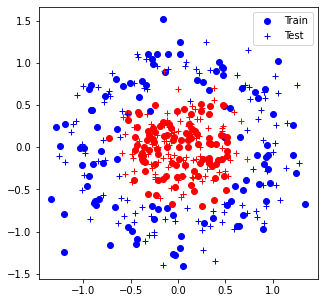

200
Iter 0: Acc train 63.5% (69.26), acc test 62.5% (69.61)


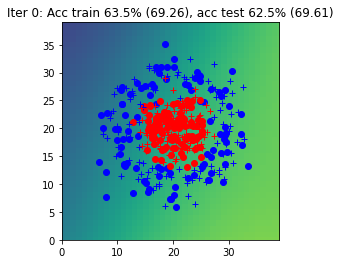

Iter 1: Acc train 62.0% (69.40), acc test 60.5% (69.90)


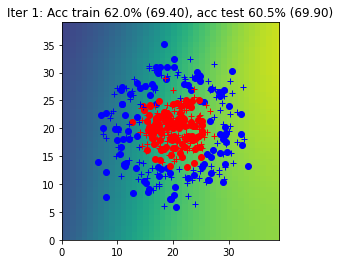

Iter 2: Acc train 51.5% (68.23), acc test 50.5% (68.43)


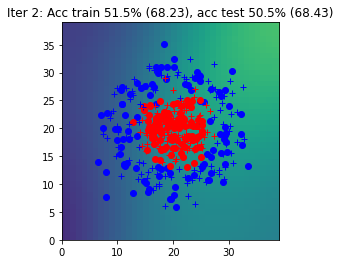

Iter 3: Acc train 61.0% (67.89), acc test 57.5% (68.09)


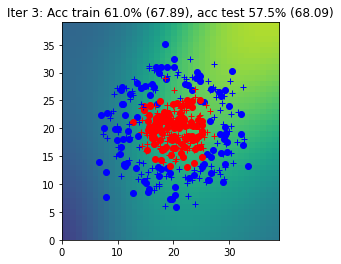

Iter 4: Acc train 48.0% (66.85), acc test 49.5% (66.99)


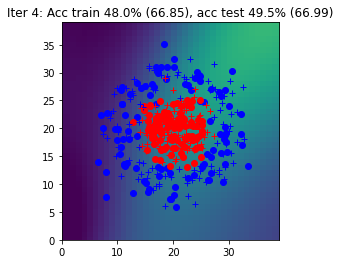

Iter 5: Acc train 50.0% (66.74), acc test 50.0% (66.66)


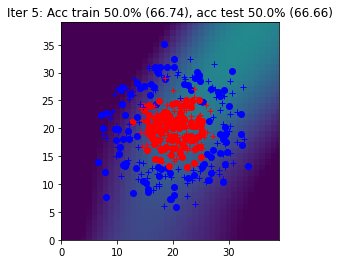

Iter 6: Acc train 71.5% (62.47), acc test 73.5% (62.38)


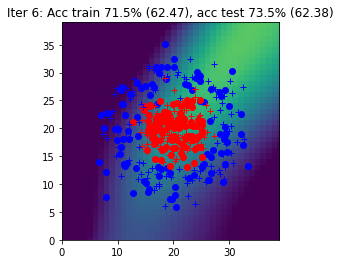

Iter 7: Acc train 83.0% (59.09), acc test 81.0% (58.81)


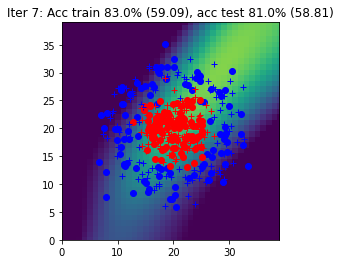

Iter 8: Acc train 76.5% (56.71), acc test 76.0% (56.95)


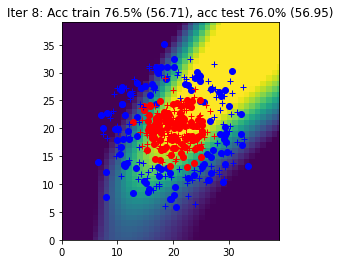

Iter 9: Acc train 59.0% (58.11), acc test 62.0% (57.25)


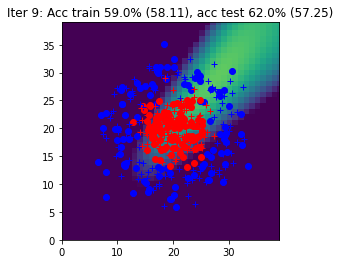

Iter 10: Acc train 73.5% (53.05), acc test 75.0% (52.17)


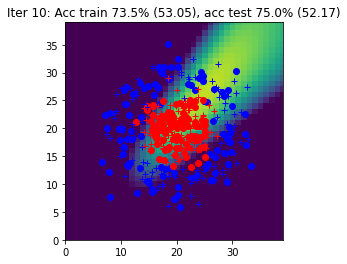

Iter 11: Acc train 80.5% (49.37), acc test 79.5% (49.53)


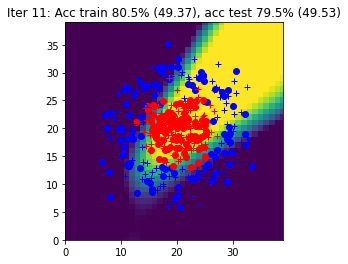

Iter 12: Acc train 82.0% (47.31), acc test 77.0% (46.47)


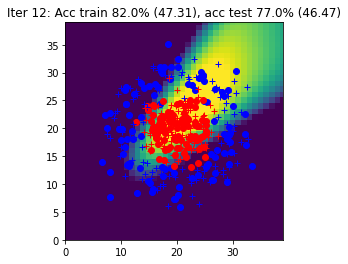

Iter 13: Acc train 78.5% (45.02), acc test 80.0% (44.62)


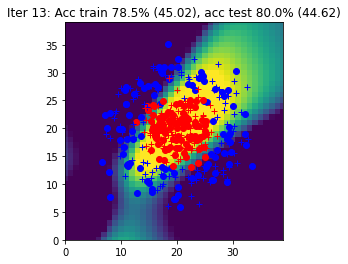

Iter 14: Acc train 82.0% (42.35), acc test 82.5% (41.37)


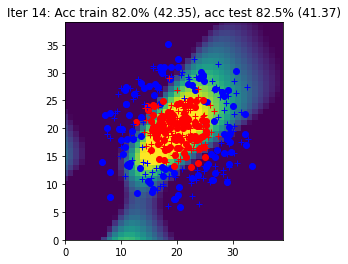

Iter 15: Acc train 82.5% (39.93), acc test 84.0% (38.82)


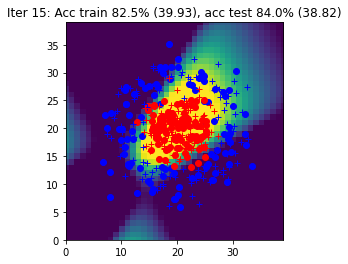

Iter 16: Acc train 83.0% (37.22), acc test 85.0% (36.02)


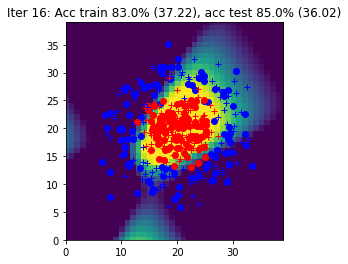

Iter 17: Acc train 90.0% (33.97), acc test 93.0% (32.68)


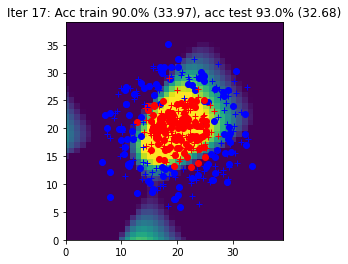

Iter 18: Acc train 82.0% (36.71), acc test 82.0% (35.33)


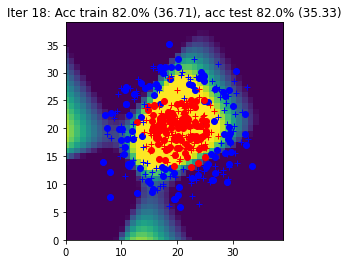

Iter 19: Acc train 92.0% (28.21), acc test 97.0% (26.63)


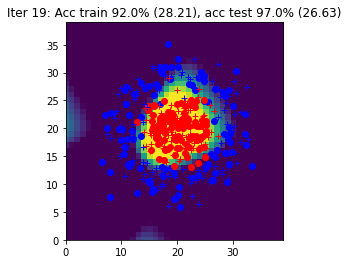

Iter 20: Acc train 92.5% (26.10), acc test 96.5% (24.27)


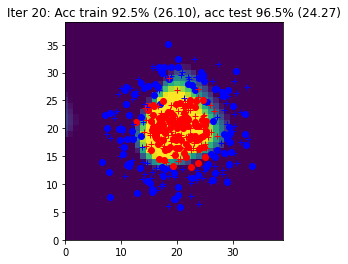

Iter 21: Acc train 95.0% (24.05), acc test 95.0% (22.86)


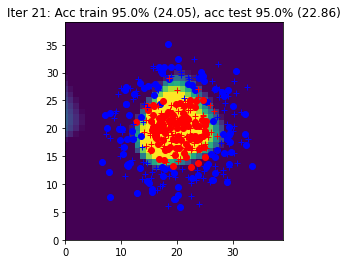

Iter 22: Acc train 93.0% (24.72), acc test 92.5% (24.15)


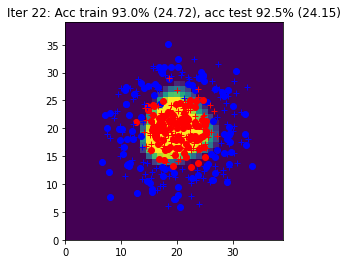

Iter 23: Acc train 94.5% (21.00), acc test 95.5% (21.42)


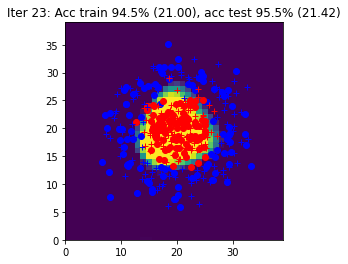

Iter 24: Acc train 94.5% (20.05), acc test 95.5% (18.95)


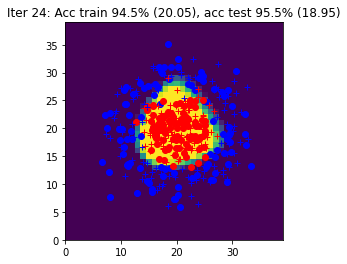

Iter 25: Acc train 94.0% (19.16), acc test 95.5% (18.91)


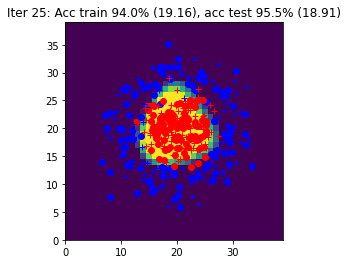

Iter 26: Acc train 95.0% (18.12), acc test 95.5% (18.19)


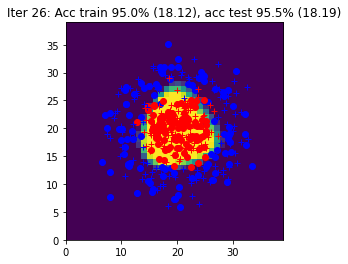

Iter 27: Acc train 95.0% (18.12), acc test 95.5% (17.95)


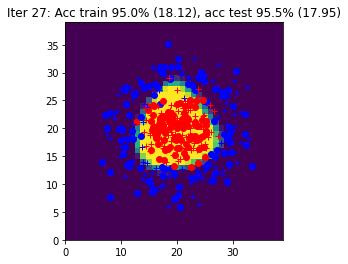

Iter 28: Acc train 95.0% (17.49), acc test 96.0% (16.32)


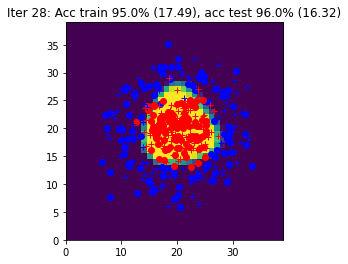

Iter 29: Acc train 95.0% (17.06), acc test 96.0% (16.26)


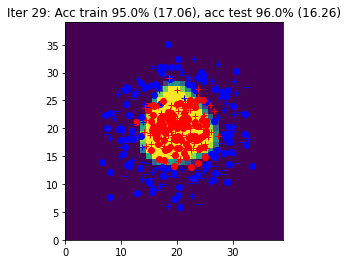

Iter 30: Acc train 95.0% (17.00), acc test 93.5% (16.47)


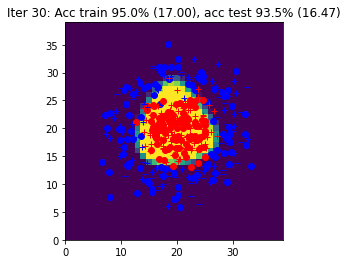

Iter 31: Acc train 94.5% (16.07), acc test 96.0% (15.28)


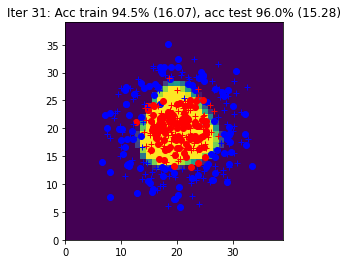

Iter 32: Acc train 94.0% (16.06), acc test 96.0% (15.83)


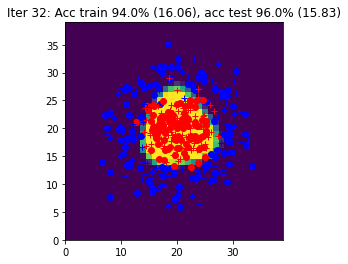

Iter 33: Acc train 95.0% (15.56), acc test 95.0% (16.58)


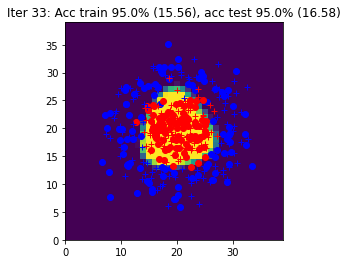

Iter 34: Acc train 95.0% (15.40), acc test 95.0% (15.83)


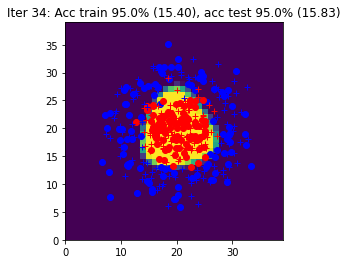

Iter 35: Acc train 94.0% (14.92), acc test 95.5% (15.89)


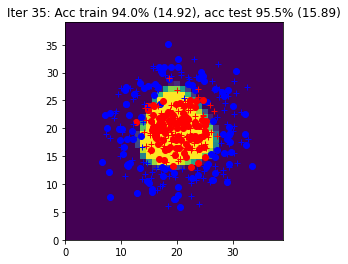

Iter 36: Acc train 95.5% (14.80), acc test 95.5% (16.28)


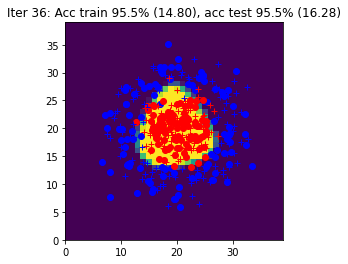

Iter 37: Acc train 94.0% (15.25), acc test 95.5% (16.24)


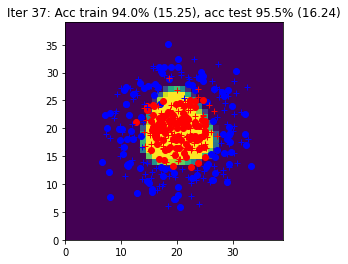

Iter 38: Acc train 95.5% (14.89), acc test 95.5% (15.24)


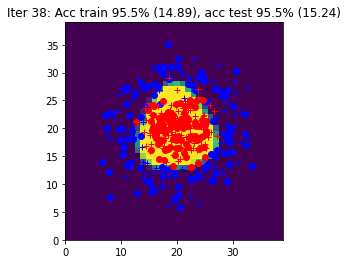

Iter 39: Acc train 94.0% (15.50), acc test 93.5% (18.01)


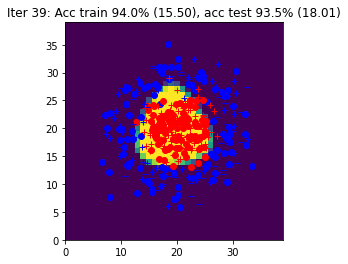

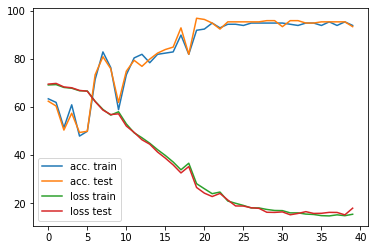

In [ ]:
# init
data = CirclesData()
data.plot_data()
N = data.Xtrain.shape[0]
Nbatch = 1
nx = data.Xtrain.shape[1]
nh = 10
ny = data.Ytrain.shape[1]
eta = 0.03

params = init_params(nx, nh, ny)

curves = [[],[], [], []]

print(N)
# epoch
for iteration in range(40):

    # permute
    perm = np.random.permutation(N)
    Xtrain = data.Xtrain[perm, :]
    Ytrain = data.Ytrain[perm, :]

    # batches
    for j in range(N // Nbatch):

        indsBatch = range(j * Nbatch, (j+1) * Nbatch)
        X = Xtrain[indsBatch, :]
        Y = Ytrain[indsBatch, :]

        # write the optimization algorithm on the batch (X,Y)
        # using the functions: forward, loss_accuracy, backward, sgd

        Yhat, outputs = forward(params, X)
        L, acc = loss_accuracy(Yhat, Y)
        grads = backward(params, outputs, Y)
        params = sgd(params, grads, eta)


    Yhat_train, _ = forward(params, data.Xtrain)
    Yhat_test, _ = forward(params, data.Xtest)
    Ltrain, acctrain = loss_accuracy(Yhat_train, data.Ytrain)
    Ltest, acctest = loss_accuracy(Yhat_test, data.Ytest)
    Ygrid, _ = forward(params, data.Xgrid)

    title = 'Iter {}: Acc train {:.1f}% ({:.2f}), acc test {:.1f}% ({:.2f})'.format(iteration, acctrain, Ltrain, acctest, Ltest)
    print(title)
    data.plot_data_with_grid(Ygrid, title)

    curves[0].append(acctrain)
    curves[1].append(acctest)
    curves[2].append(Ltrain)
    curves[3].append(Ltest)

fig = plt.figure()
plt.plot(curves[0], label="acc. train")
plt.plot(curves[1], label="acc. test")
plt.plot(curves[2], label="loss train")
plt.plot(curves[3], label="loss test")
plt.legend()
plt.show()

# Part 2 : Simplification of the backward pass with `torch.autograd`



In [ ]:
def init_params(nx, nh, ny):
    """
    nx, nh, ny: integers
    out params: dictionnary
    """
    params = {}

    # fill values for Wh, Wy, bh, by
    # activaye autograd on the network weights

    params["Wh"] = torch.randn((nh, nx))*0.3
    params["Wy"] = torch.randn((ny, nh))*0.3
    params["bh"] = torch.randn((nh, 1), requires_grad=True)
    params["by"] = torch.randn((ny, 1), requires_grad=True)

    params["Wh"].requires_grad = True
    params["Wy"].requires_grad = True

    return params

The function `forward` remains unchanged from previous part.

The function `backward` is no longer used because of "autograd".

In [ ]:
def sgd(params, eta):

    # update the network weights
    # warning: use torch.no_grad()
    # and reset to zero the gradient accumulators
    #params["Wy"].backward(torch.ones_like(params["Wy"]))
    #params["Wh"].backward(torch.Tensor([1, 1]))
    with torch.no_grad():
      params['Wy'] -= eta * params['Wy'].grad
      params['Wh'] -= eta * params['Wh'].grad
      params['by'] -= eta * torch.reshape(params["by"].grad, params["by"].size())
      params['bh'] -= eta * torch.reshape(params["bh"].grad, params["bh"].size())
      params['Wy'].grad.zero_() # resets the gradient accumulator to zero
      params['Wh'].grad.zero_()
      params['by'].grad.zero_()
      params['bh'].grad.zero_()

    return params

## Global learning procedure with autograd

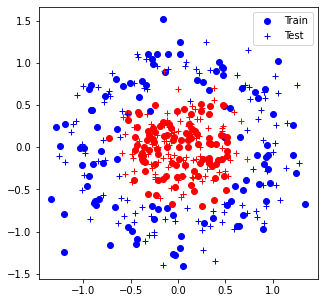

Iter 0: Acc train 50.0% (71.94), acc test 50.0% (71.84)


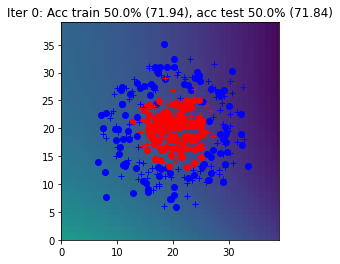

Iter 1: Acc train 51.0% (70.04), acc test 50.5% (69.83)


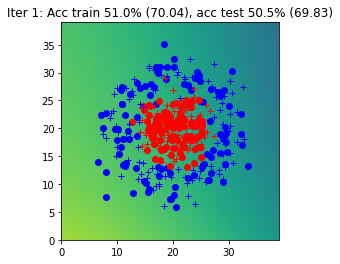

Iter 2: Acc train 50.0% (72.91), acc test 50.0% (72.85)


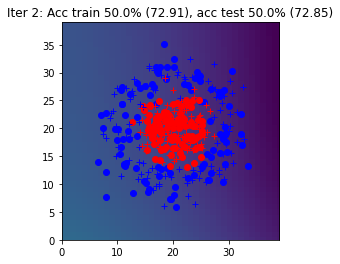

Iter 3: Acc train 50.0% (72.05), acc test 50.0% (71.79)


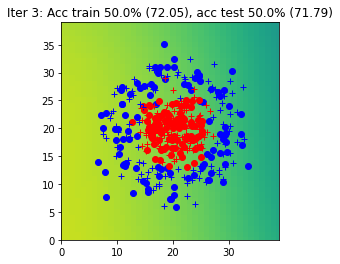

Iter 4: Acc train 50.0% (70.58), acc test 50.0% (70.51)


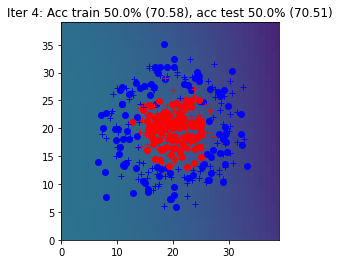

Iter 5: Acc train 37.5% (69.07), acc test 39.0% (68.95)


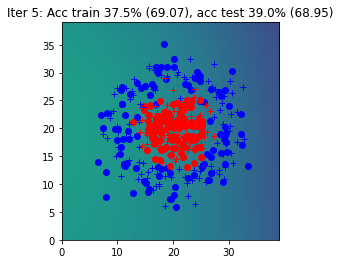

Iter 6: Acc train 50.0% (76.26), acc test 50.0% (76.25)


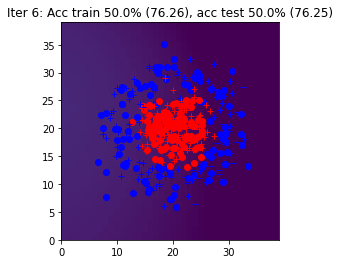

Iter 7: Acc train 58.5% (68.93), acc test 61.5% (68.80)


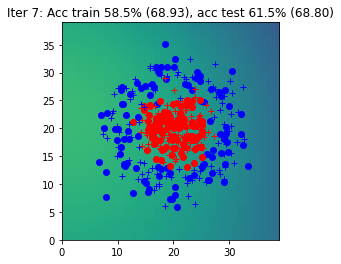

Iter 8: Acc train 50.0% (69.28), acc test 50.5% (69.12)


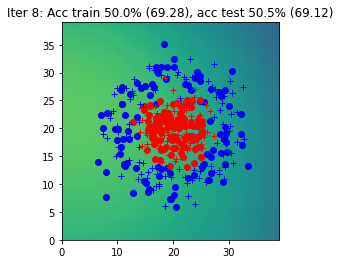

Iter 9: Acc train 50.0% (75.70), acc test 50.0% (75.71)


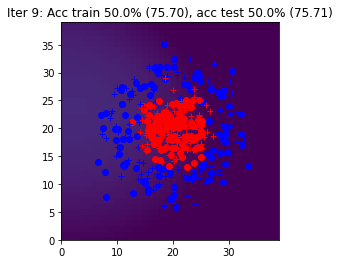

Iter 10: Acc train 50.0% (68.73), acc test 50.0% (68.70)


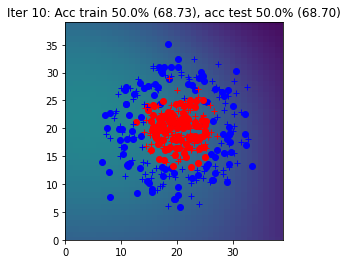

Iter 11: Acc train 66.0% (67.71), acc test 66.0% (67.67)


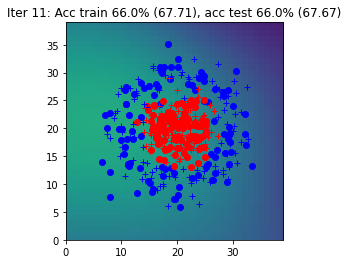

Iter 12: Acc train 50.0% (68.70), acc test 50.0% (68.78)


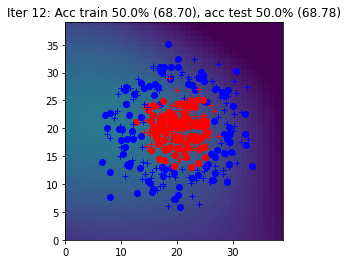

Iter 13: Acc train 50.5% (68.29), acc test 51.5% (68.27)


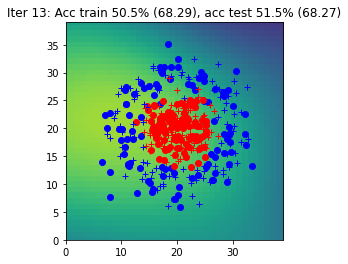

Iter 14: Acc train 53.0% (67.04), acc test 54.5% (67.06)


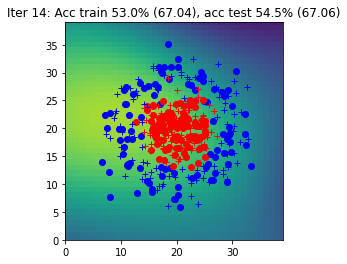

Iter 15: Acc train 61.5% (64.65), acc test 60.0% (64.89)


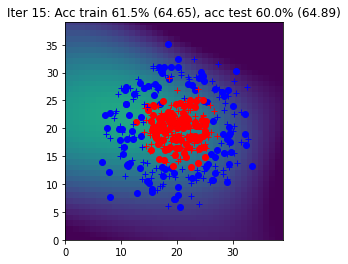

Iter 16: Acc train 80.0% (62.77), acc test 80.5% (63.15)


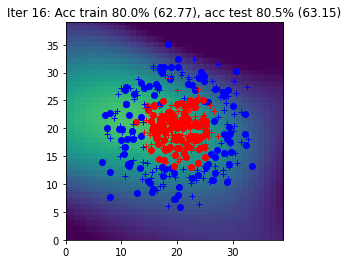

Iter 17: Acc train 75.5% (60.94), acc test 76.0% (61.46)


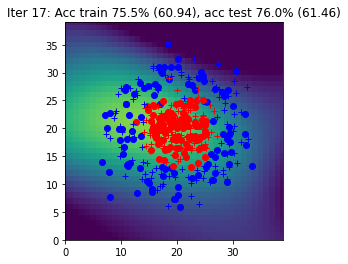

Iter 18: Acc train 81.0% (58.63), acc test 76.5% (59.34)


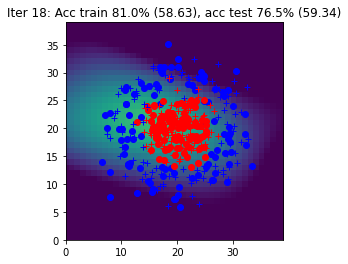

Iter 19: Acc train 83.0% (56.36), acc test 80.0% (57.19)


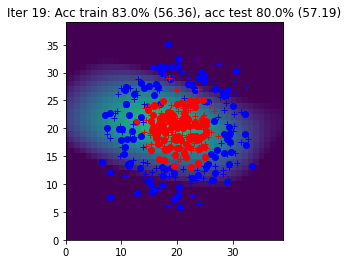

Iter 20: Acc train 68.5% (55.84), acc test 67.5% (56.84)


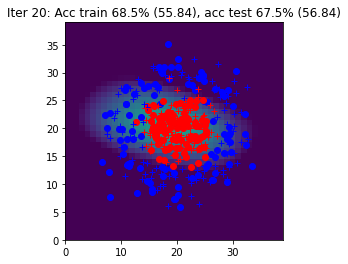

Iter 21: Acc train 82.5% (49.46), acc test 86.0% (50.40)


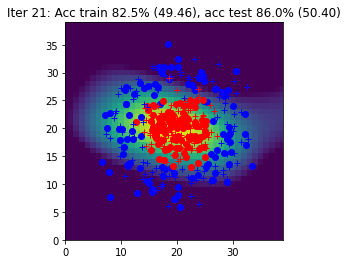

Iter 22: Acc train 83.5% (46.45), acc test 86.5% (47.43)


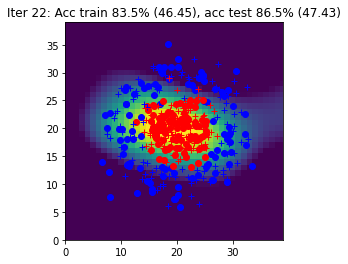

Iter 23: Acc train 89.0% (45.04), acc test 88.5% (46.48)


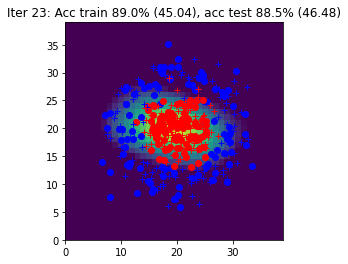

Iter 24: Acc train 87.0% (40.39), acc test 91.0% (41.53)


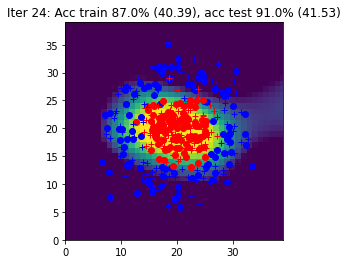

Iter 25: Acc train 90.5% (37.24), acc test 91.5% (38.26)


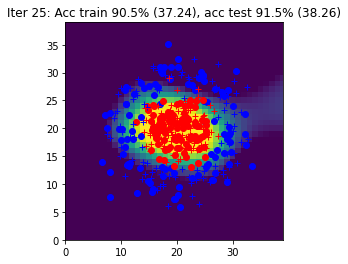

Iter 26: Acc train 93.0% (34.50), acc test 92.5% (35.46)


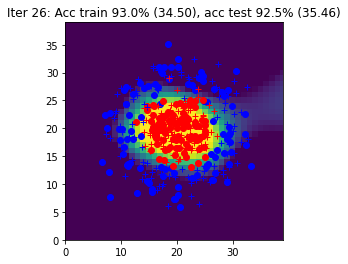

Iter 27: Acc train 93.5% (31.80), acc test 93.0% (32.73)


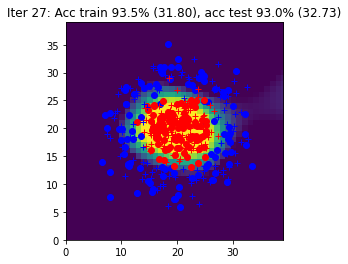

Iter 28: Acc train 93.0% (30.43), acc test 94.0% (31.97)


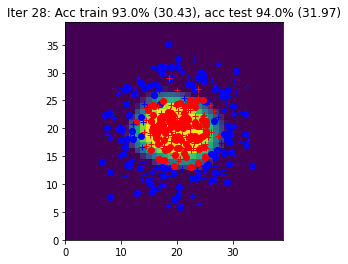

Iter 29: Acc train 95.0% (27.63), acc test 94.5% (28.78)


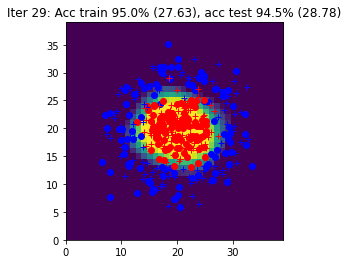

Iter 30: Acc train 95.5% (26.14), acc test 94.5% (27.18)


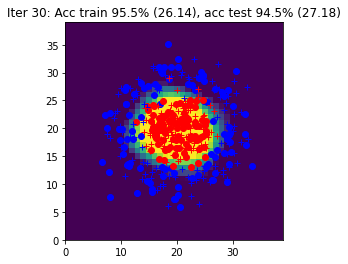

Iter 31: Acc train 96.5% (24.68), acc test 93.5% (26.10)


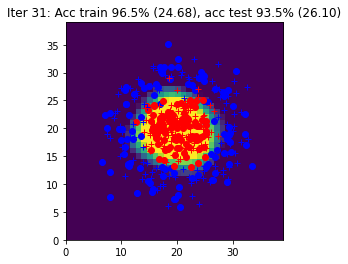

Iter 32: Acc train 94.5% (23.70), acc test 94.5% (24.80)


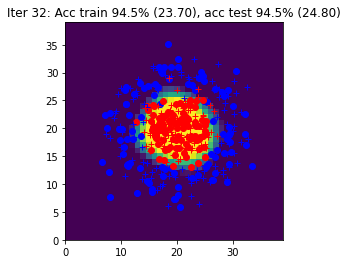

Iter 33: Acc train 96.0% (22.62), acc test 94.0% (23.25)


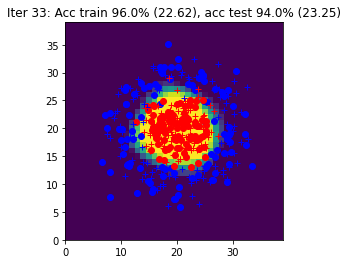

Iter 34: Acc train 94.5% (21.78), acc test 94.0% (22.75)


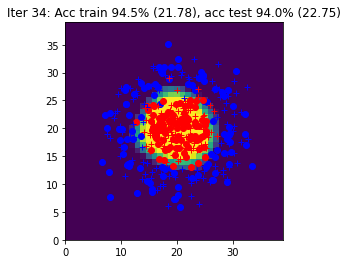

Iter 35: Acc train 95.0% (20.95), acc test 94.0% (22.09)


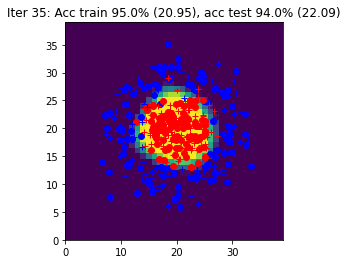

Iter 36: Acc train 96.5% (20.50), acc test 93.5% (21.28)


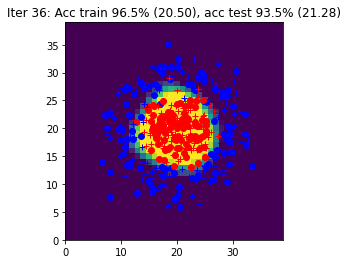

Iter 37: Acc train 94.5% (19.67), acc test 94.5% (20.76)


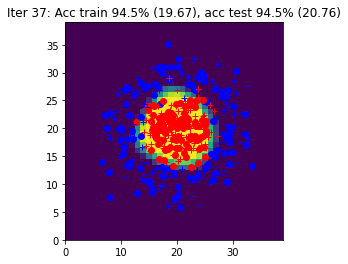

Iter 38: Acc train 96.0% (19.53), acc test 94.5% (20.03)


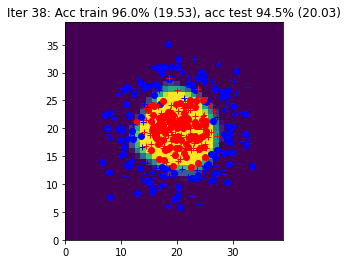

Iter 39: Acc train 95.5% (18.58), acc test 95.0% (19.72)


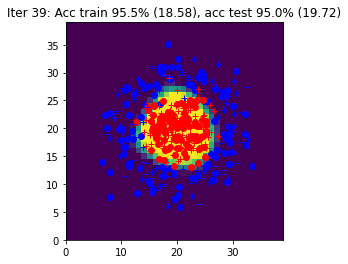

Iter 40: Acc train 97.0% (18.43), acc test 94.5% (19.55)


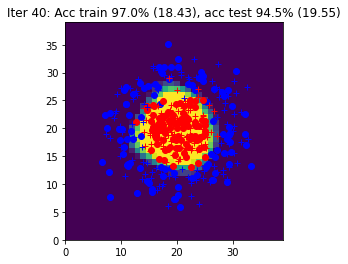

Iter 41: Acc train 95.5% (17.87), acc test 95.0% (19.39)


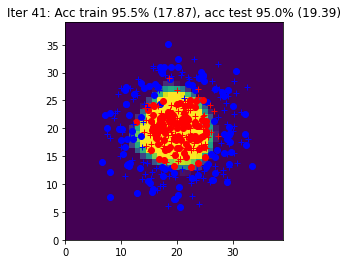

Iter 42: Acc train 95.0% (17.54), acc test 95.0% (19.17)


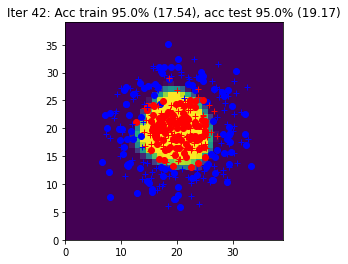

Iter 43: Acc train 96.0% (17.56), acc test 93.5% (18.92)


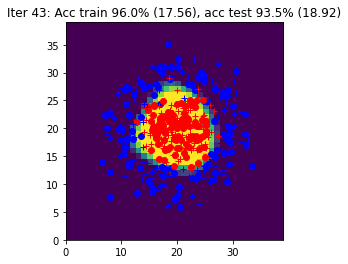

Iter 44: Acc train 96.0% (16.79), acc test 95.0% (17.89)


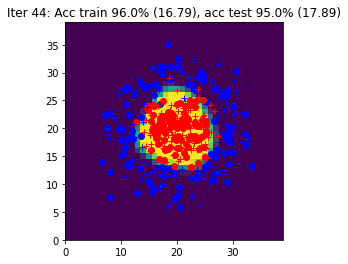

Iter 45: Acc train 97.0% (16.57), acc test 95.0% (17.43)


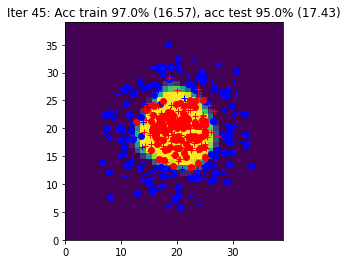

Iter 46: Acc train 96.5% (17.11), acc test 94.5% (17.50)


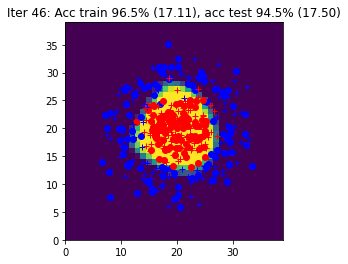

Iter 47: Acc train 96.0% (16.10), acc test 95.0% (17.85)


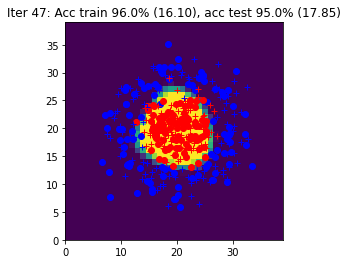

Iter 48: Acc train 96.0% (16.84), acc test 93.5% (17.76)


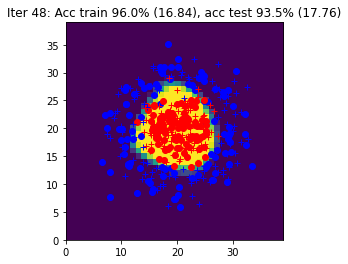

Iter 49: Acc train 96.5% (15.71), acc test 95.0% (17.50)


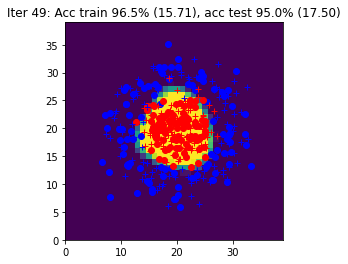

Iter 50: Acc train 95.0% (16.68), acc test 94.0% (16.85)


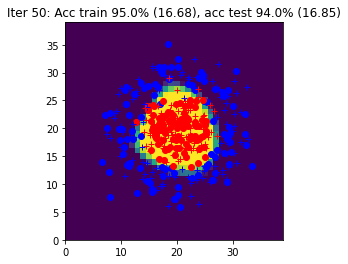

Iter 51: Acc train 96.5% (15.73), acc test 94.5% (16.44)


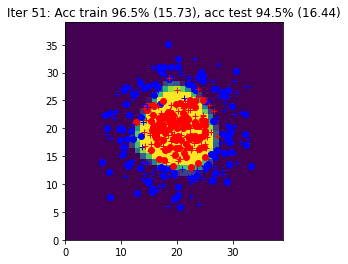

Iter 52: Acc train 95.5% (15.49), acc test 95.0% (17.60)


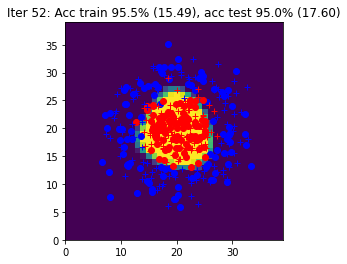

Iter 53: Acc train 96.5% (15.48), acc test 94.5% (16.63)


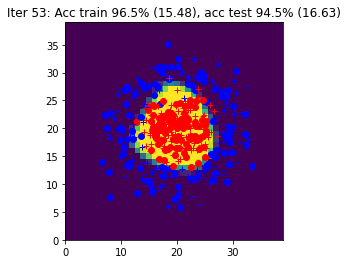

Iter 54: Acc train 96.5% (14.86), acc test 95.0% (16.38)


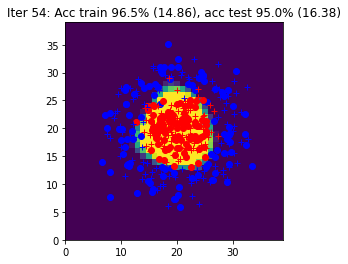

Iter 55: Acc train 95.0% (14.98), acc test 95.5% (15.77)


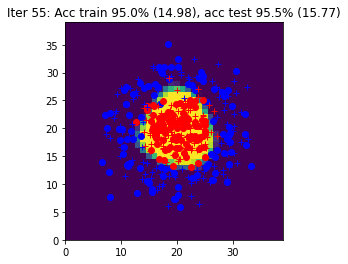

Iter 56: Acc train 96.5% (14.85), acc test 95.0% (15.73)


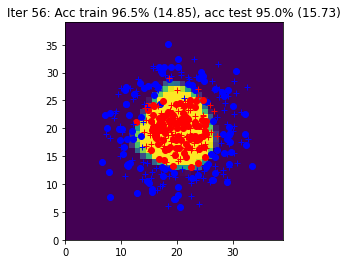

Iter 57: Acc train 95.5% (14.82), acc test 95.0% (17.17)


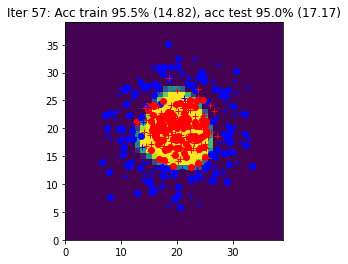

Iter 58: Acc train 96.0% (15.40), acc test 94.5% (15.40)


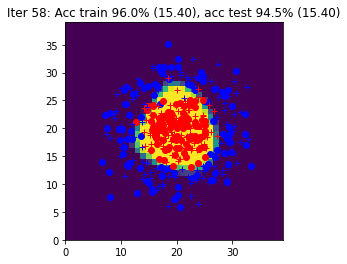

Iter 59: Acc train 96.0% (14.59), acc test 95.0% (15.53)


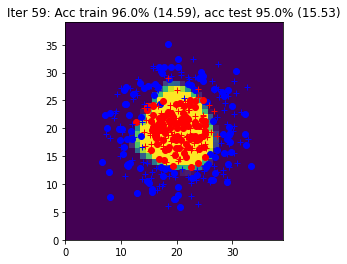

Iter 60: Acc train 95.5% (14.31), acc test 95.0% (16.38)


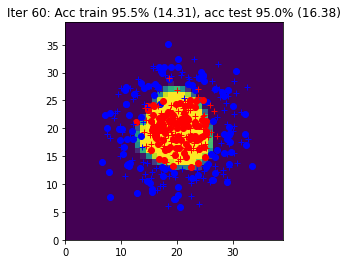

Iter 61: Acc train 96.5% (14.32), acc test 95.0% (15.40)


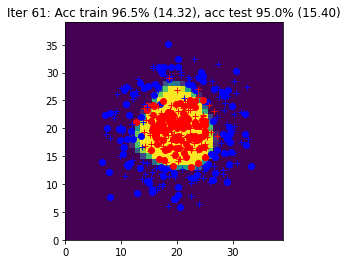

Iter 62: Acc train 96.0% (14.09), acc test 95.0% (15.94)


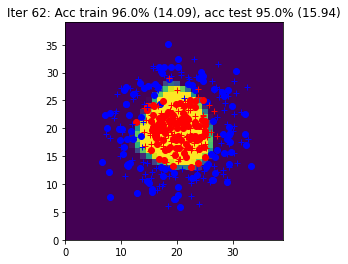

Iter 63: Acc train 96.0% (14.02), acc test 95.5% (15.23)


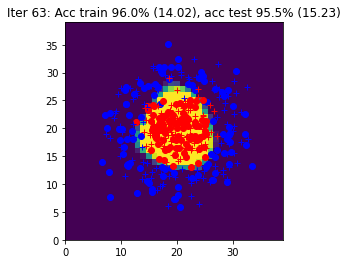

Iter 64: Acc train 96.5% (14.84), acc test 94.5% (15.53)


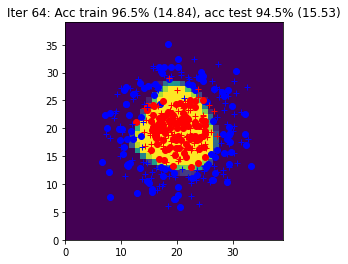

Iter 65: Acc train 95.5% (13.81), acc test 95.0% (15.28)


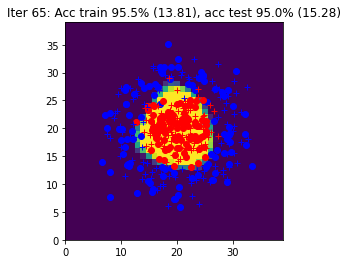

Iter 66: Acc train 93.5% (14.65), acc test 94.5% (16.77)


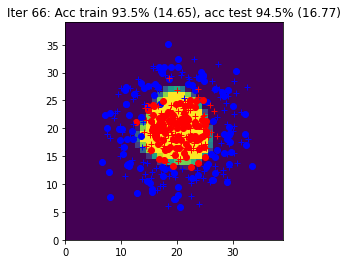

Iter 67: Acc train 96.0% (13.72), acc test 95.0% (15.96)


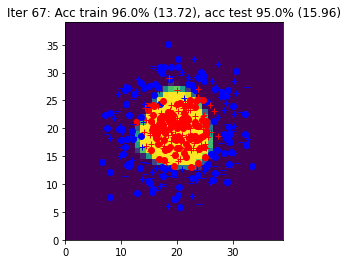

Iter 68: Acc train 96.0% (13.65), acc test 95.5% (15.57)


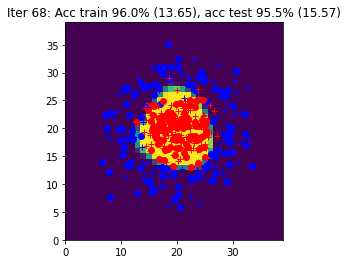

Iter 69: Acc train 95.5% (13.60), acc test 95.5% (15.27)


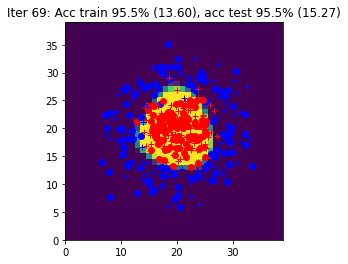

Iter 70: Acc train 96.0% (13.74), acc test 94.5% (15.22)


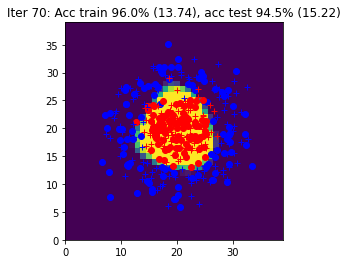

Iter 71: Acc train 96.0% (13.43), acc test 95.0% (15.12)


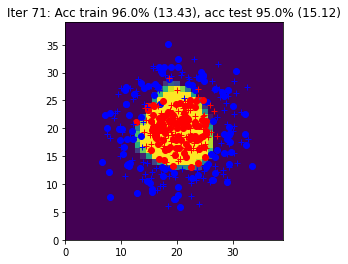

Iter 72: Acc train 96.5% (13.40), acc test 94.5% (15.85)


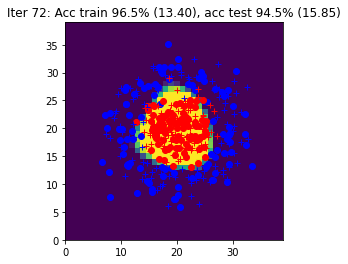

Iter 73: Acc train 95.5% (13.62), acc test 95.0% (15.94)


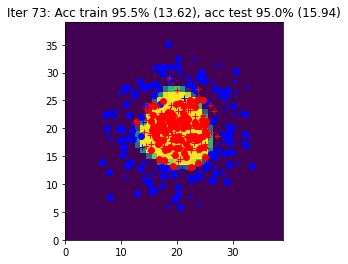

Iter 74: Acc train 96.0% (13.40), acc test 95.0% (15.99)


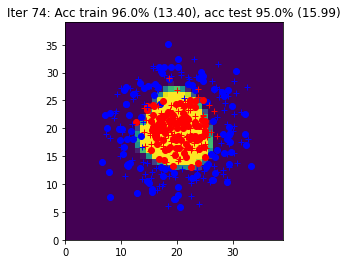

Iter 75: Acc train 96.0% (13.40), acc test 95.0% (14.91)


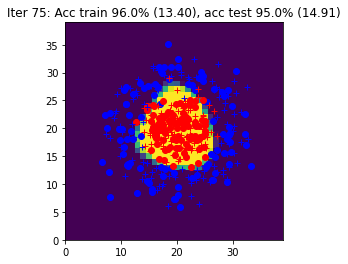

Iter 76: Acc train 96.0% (13.38), acc test 95.0% (14.58)


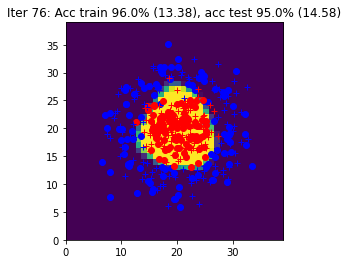

Iter 77: Acc train 95.0% (13.45), acc test 95.0% (16.25)


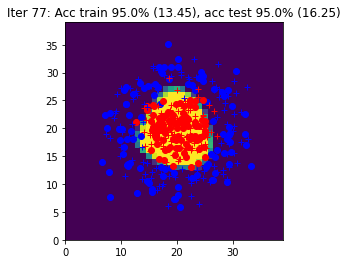

Iter 78: Acc train 95.5% (13.15), acc test 95.5% (14.54)


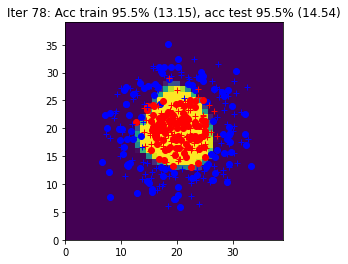

Iter 79: Acc train 95.0% (13.43), acc test 95.0% (15.12)


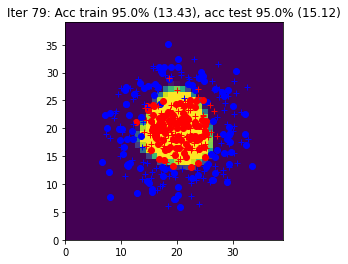

Iter 80: Acc train 95.0% (13.62), acc test 94.5% (16.72)


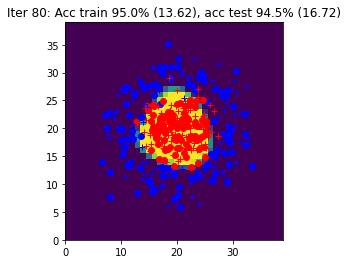

Iter 81: Acc train 93.5% (13.79), acc test 94.0% (16.18)


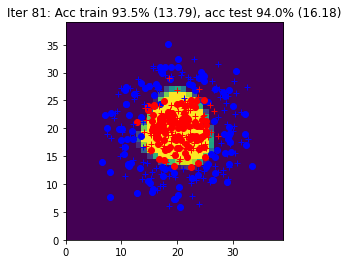

Iter 82: Acc train 95.5% (12.96), acc test 94.5% (15.49)


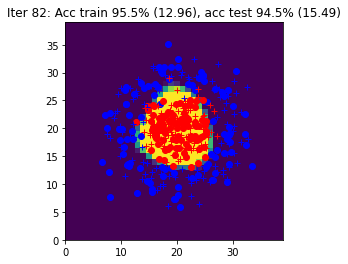

Iter 83: Acc train 95.5% (13.02), acc test 94.5% (16.08)


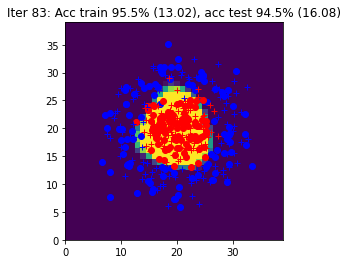

Iter 84: Acc train 96.5% (12.92), acc test 95.0% (15.52)


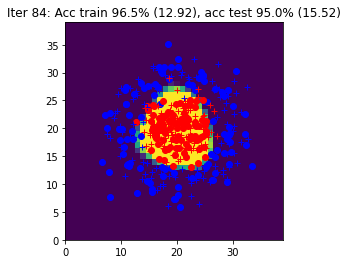

Iter 85: Acc train 96.0% (13.18), acc test 94.5% (15.89)


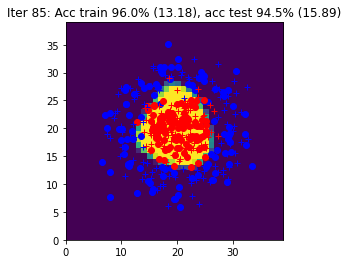

Iter 86: Acc train 96.5% (13.43), acc test 95.5% (14.59)


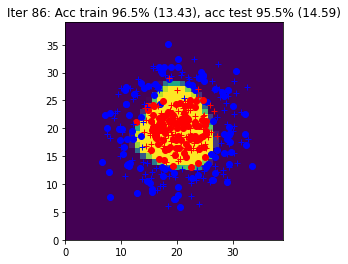

Iter 87: Acc train 95.0% (13.28), acc test 94.5% (16.02)


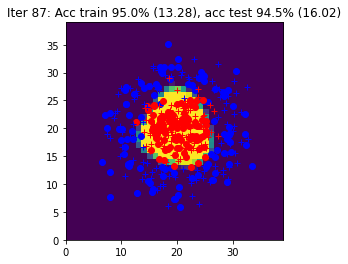

Iter 88: Acc train 95.5% (12.74), acc test 95.0% (14.61)


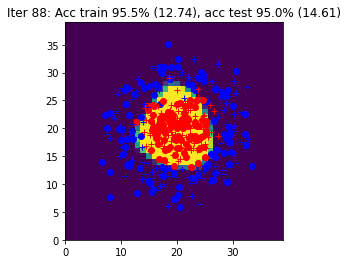

Iter 89: Acc train 97.0% (12.79), acc test 94.5% (15.45)


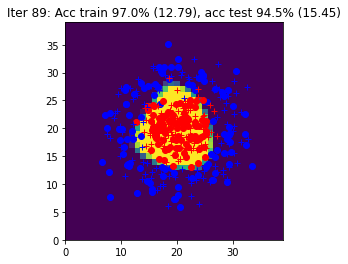

Iter 90: Acc train 95.5% (12.67), acc test 94.5% (14.74)


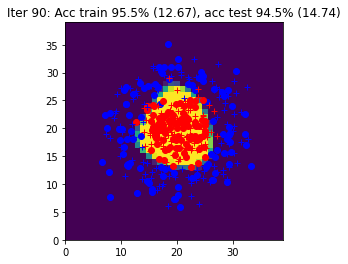

Iter 91: Acc train 96.5% (12.90), acc test 94.5% (15.31)


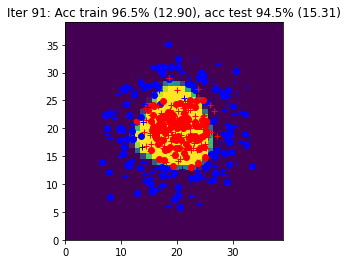

Iter 92: Acc train 92.0% (14.29), acc test 94.0% (17.49)


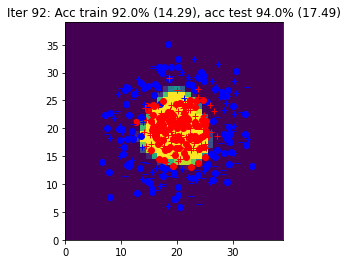

Iter 93: Acc train 94.5% (13.19), acc test 94.5% (15.88)


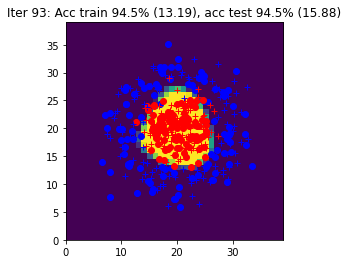

Iter 94: Acc train 95.5% (12.72), acc test 95.5% (14.35)


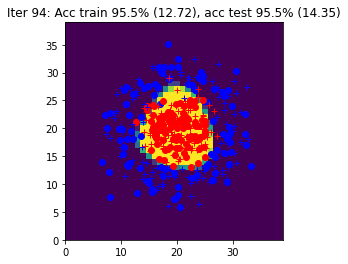

Iter 95: Acc train 96.5% (12.58), acc test 94.5% (15.25)


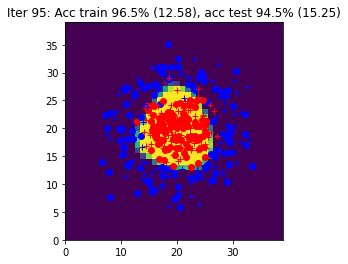

Iter 96: Acc train 95.0% (13.00), acc test 95.0% (15.74)


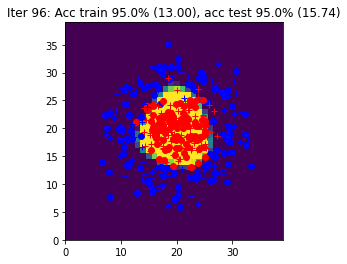

Iter 97: Acc train 97.0% (12.60), acc test 94.5% (15.06)


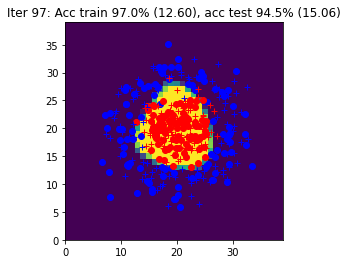

Iter 98: Acc train 96.0% (12.61), acc test 94.5% (16.17)


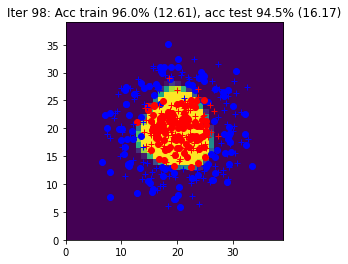

Iter 99: Acc train 96.5% (12.39), acc test 94.5% (14.89)


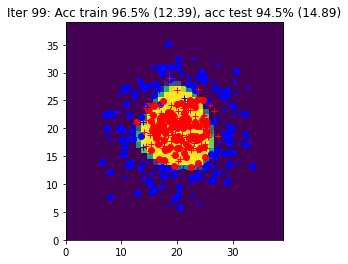

Iter 100: Acc train 96.0% (12.74), acc test 94.0% (16.59)


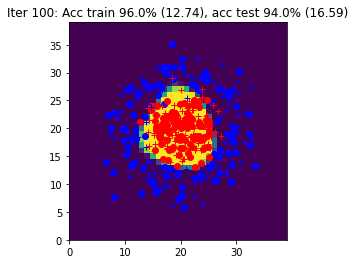

Iter 101: Acc train 96.5% (12.40), acc test 94.5% (14.99)


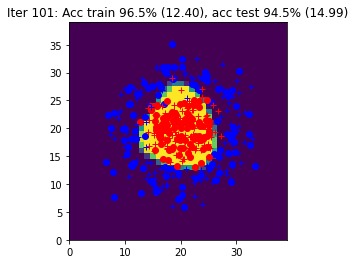

Iter 102: Acc train 96.5% (13.06), acc test 95.0% (14.33)


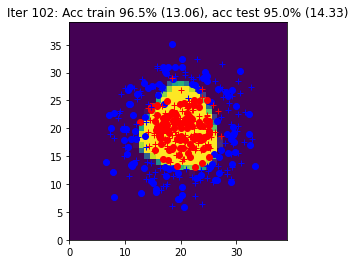

Iter 103: Acc train 95.5% (12.43), acc test 95.5% (14.50)


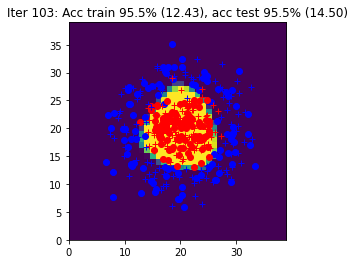

Iter 104: Acc train 96.5% (12.28), acc test 94.5% (14.97)


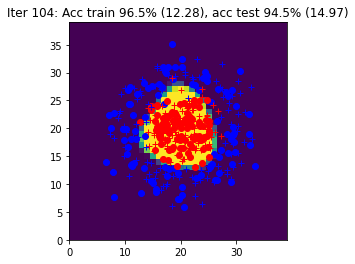

Iter 105: Acc train 96.5% (12.31), acc test 95.0% (14.38)


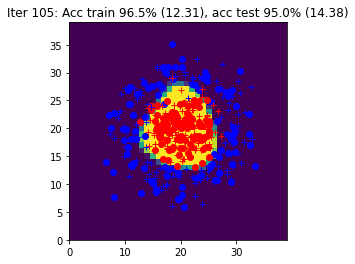

Iter 106: Acc train 96.5% (13.05), acc test 94.0% (15.70)


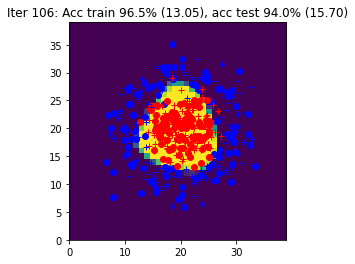

Iter 107: Acc train 96.5% (12.40), acc test 94.5% (16.34)


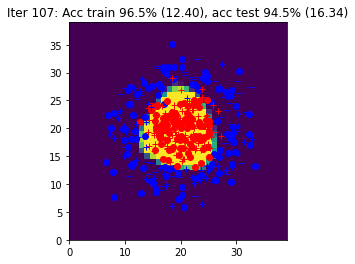

Iter 108: Acc train 96.5% (12.84), acc test 93.5% (15.86)


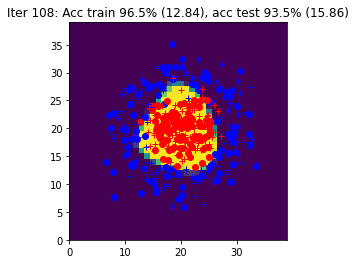

Iter 109: Acc train 96.5% (12.17), acc test 94.5% (14.89)


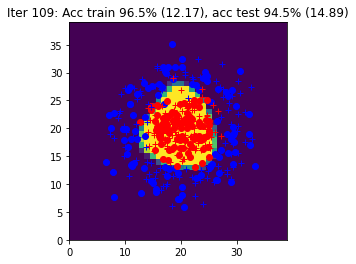

Iter 110: Acc train 96.5% (13.29), acc test 94.0% (14.88)


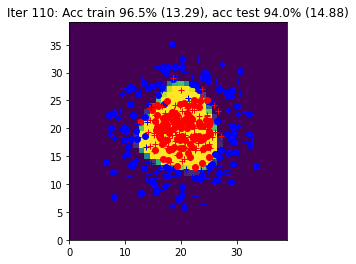

Iter 111: Acc train 96.5% (12.22), acc test 95.0% (15.51)


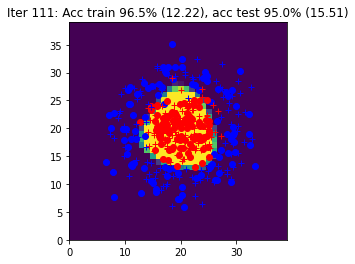

Iter 112: Acc train 96.0% (12.73), acc test 94.0% (14.17)


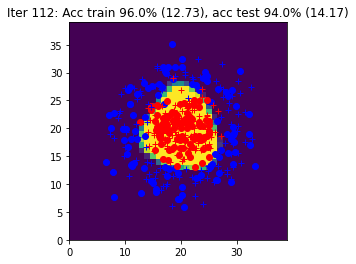

Iter 113: Acc train 95.5% (12.11), acc test 94.5% (14.43)


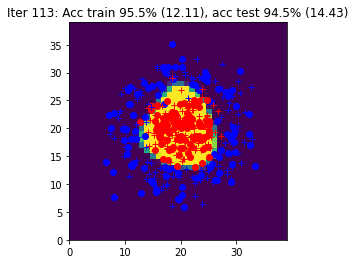

Iter 114: Acc train 96.5% (12.05), acc test 94.5% (15.20)


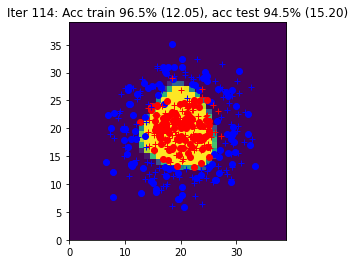

Iter 115: Acc train 96.5% (12.03), acc test 94.5% (15.18)


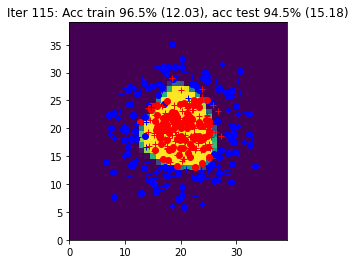

Iter 116: Acc train 96.0% (12.12), acc test 95.0% (15.33)


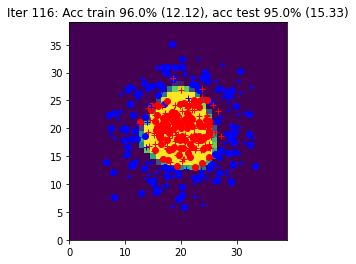

Iter 117: Acc train 96.5% (12.05), acc test 95.0% (15.40)


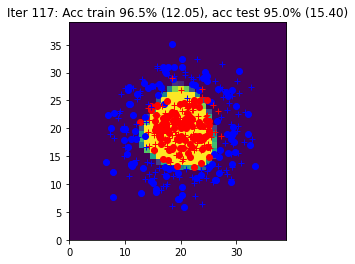

Iter 118: Acc train 95.5% (12.04), acc test 94.5% (14.90)


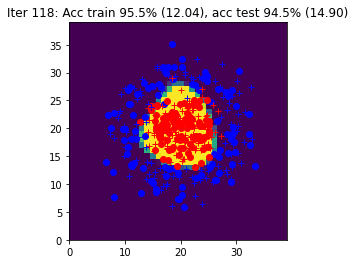

Iter 119: Acc train 96.0% (12.04), acc test 94.5% (14.47)


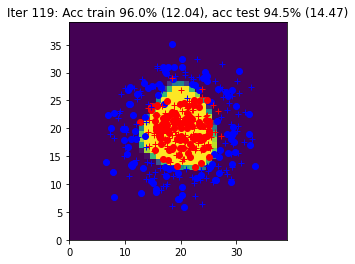

Iter 120: Acc train 96.5% (11.95), acc test 94.5% (14.92)


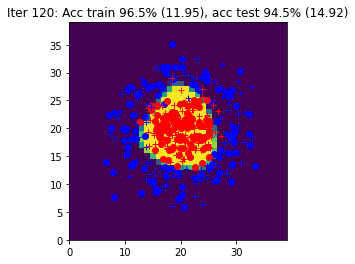

Iter 121: Acc train 96.0% (11.97), acc test 95.0% (14.20)


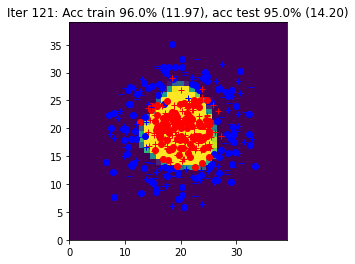

Iter 122: Acc train 96.0% (11.98), acc test 95.0% (14.21)


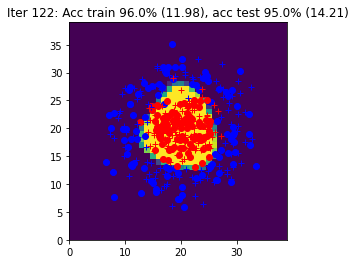

Iter 123: Acc train 96.0% (12.09), acc test 95.5% (14.19)


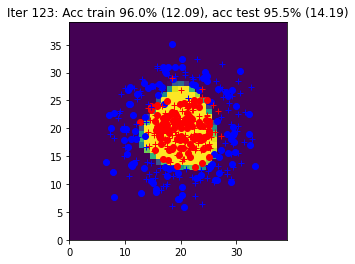

Iter 124: Acc train 97.0% (11.91), acc test 94.5% (14.95)


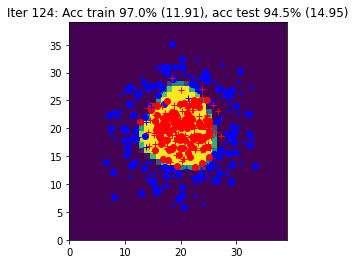

Iter 125: Acc train 96.0% (12.47), acc test 94.0% (14.72)


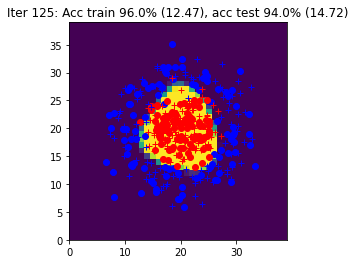

Iter 126: Acc train 96.0% (12.28), acc test 94.0% (14.59)


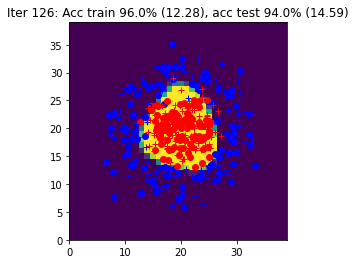

Iter 127: Acc train 97.0% (11.88), acc test 94.5% (15.53)


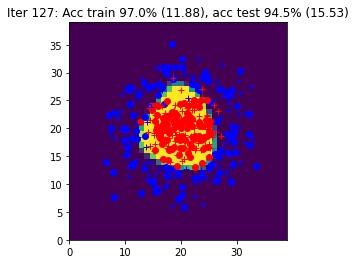

Iter 128: Acc train 96.5% (11.81), acc test 95.0% (14.88)


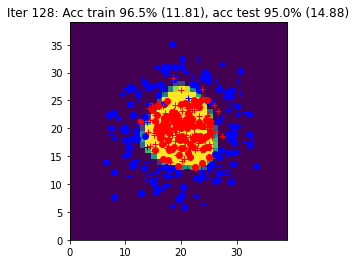

Iter 129: Acc train 93.5% (13.65), acc test 94.0% (18.03)


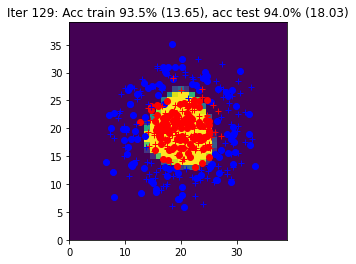

Iter 130: Acc train 95.5% (12.05), acc test 94.5% (15.70)


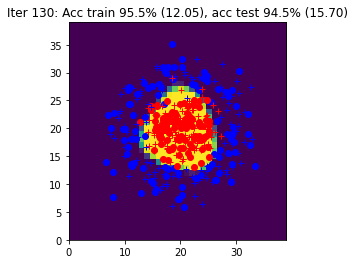

Iter 131: Acc train 96.5% (11.86), acc test 94.5% (15.86)


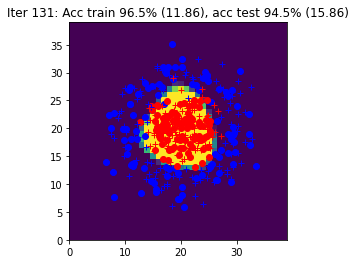

Iter 132: Acc train 96.5% (11.77), acc test 94.0% (15.29)


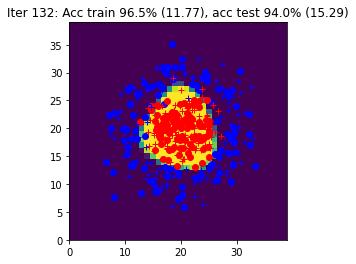

Iter 133: Acc train 94.5% (12.54), acc test 93.5% (16.17)


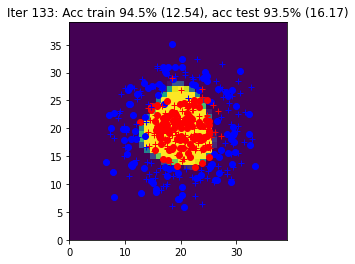

Iter 134: Acc train 95.5% (11.95), acc test 94.0% (14.78)


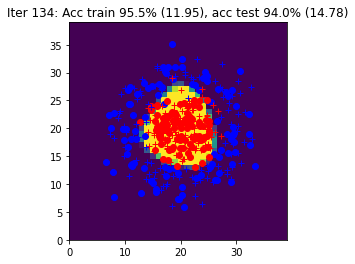

Iter 135: Acc train 96.5% (12.26), acc test 94.5% (14.85)


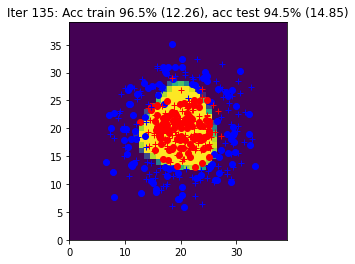

Iter 136: Acc train 94.0% (12.44), acc test 95.0% (15.52)


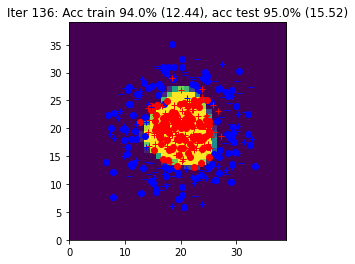

Iter 137: Acc train 96.5% (11.57), acc test 94.5% (14.99)


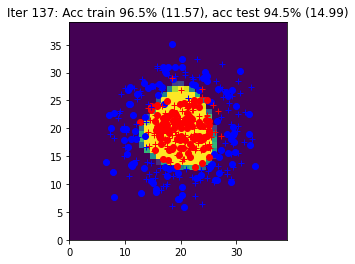

Iter 138: Acc train 95.0% (12.36), acc test 95.0% (16.54)


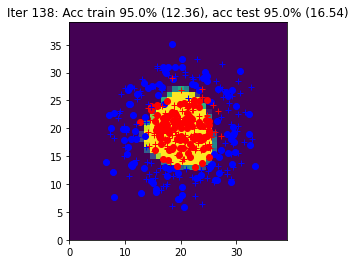

Iter 139: Acc train 96.0% (11.57), acc test 94.5% (14.49)


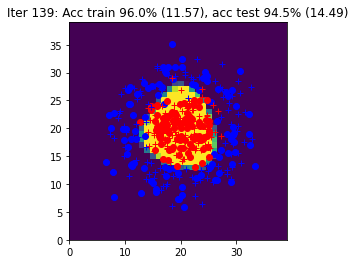

Iter 140: Acc train 96.5% (11.51), acc test 94.5% (14.52)


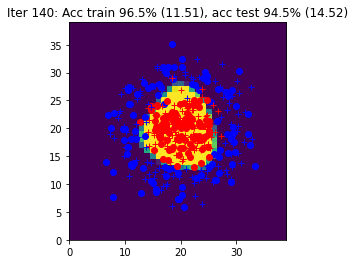

Iter 141: Acc train 95.5% (11.90), acc test 95.0% (15.93)


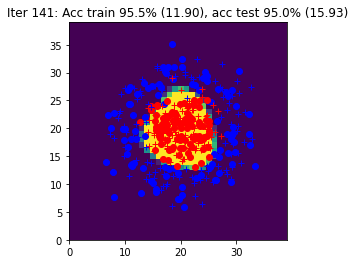

Iter 142: Acc train 95.5% (11.74), acc test 94.5% (15.59)


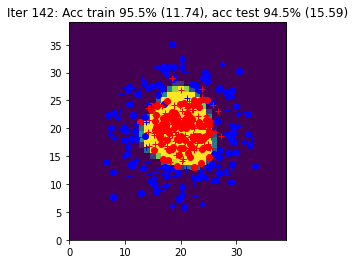

Iter 143: Acc train 96.5% (11.78), acc test 95.0% (13.84)


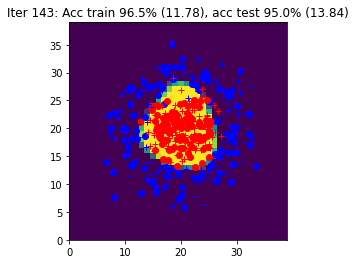

Iter 144: Acc train 93.5% (13.28), acc test 94.0% (17.62)


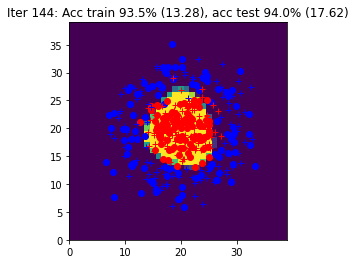

Iter 145: Acc train 96.5% (11.61), acc test 94.0% (14.52)


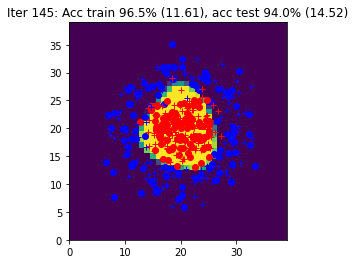

Iter 146: Acc train 96.5% (12.28), acc test 94.5% (14.03)


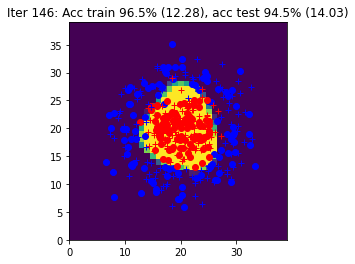

Iter 147: Acc train 97.0% (11.73), acc test 94.5% (14.98)


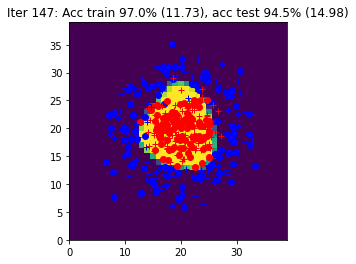

Iter 148: Acc train 96.0% (11.37), acc test 94.5% (14.47)


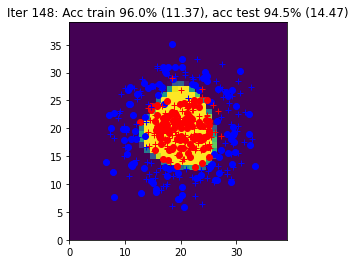

Iter 149: Acc train 97.0% (11.54), acc test 94.5% (15.68)


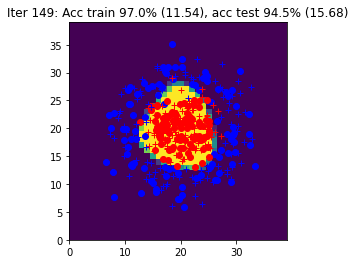

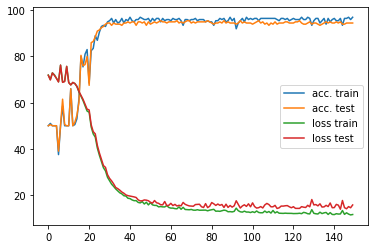

In [ ]:
# init
data = CirclesData()
data.plot_data()
N = data.Xtrain.shape[0]
Nbatch = 10
nx = data.Xtrain.shape[1]
nh = 10
ny = data.Ytrain.shape[1]
eta = 0.03

params = init_params(nx, nh, ny)

curves = [[],[], [], []]



# epoch
for iteration in range(150):

    # permute
    perm = np.random.permutation(N)
    Xtrain = data.Xtrain[perm, :]
    Ytrain = data.Ytrain[perm, :]

    # batches
    for j in range(N // Nbatch):

        indsBatch = range(j * Nbatch, (j+1) * Nbatch)
        X = Xtrain[indsBatch, :]
        Y = Ytrain[indsBatch, :]

        # write the optimization algorithm on the batch (X,Y)
        # using the functions: forward, loss_accuracy, sgd
        # and the backward function with autograd
        Yhat, outputs = forward(params, X)

        L, acc = loss_accuracy(Yhat, Y)
       
        L.backward()
        params = sgd(params, eta)



    Yhat_train, _ = forward(params, data.Xtrain)
    Yhat_test, _ = forward(params, data.Xtest)
    Ltrain, acctrain = loss_accuracy(Yhat_train, data.Ytrain)
    Ltest, acctest = loss_accuracy(Yhat_test, data.Ytest)
    Ygrid, _ = forward(params, data.Xgrid)

    title = 'Iter {}: Acc train {:.1f}% ({:.2f}), acc test {:.1f}% ({:.2f})'.format(iteration, acctrain, Ltrain, acctest, Ltest)
    print(title)
    # detach() is used to remove the predictions from the computational graph in autograd
    data.plot_data_with_grid(Ygrid.detach(), title)

    curves[0].append(acctrain)
    curves[1].append(acctest)
    curves[2].append(Ltrain.detach())
    curves[3].append(Ltest.detach())


fig = plt.figure()
plt.plot(curves[0], label="acc. train")
plt.plot(curves[1], label="acc. test")
plt.plot(curves[2], label="loss train")
plt.plot(curves[3], label="loss test")
plt.legend()
plt.show()

# Part 3 : Simplification of the forward pass with `torch.nn`

`init_params` and `forward` are replaced by the `init_model` function which defines the network architecture and the loss.

In [ ]:
def init_model(nx, nh, ny):

    model = torch.nn.Sequential(
      torch.nn.Linear(nx, nh),
      torch.nn.Tanh(),
      torch.nn.Linear(nh, ny),
      torch.nn.Softmax()
    )
    loss = torch.nn.CrossEntropyLoss()

    return model, loss

In [ ]:
def loss_accuracy(loss, Yhat, Y):

    # call the loss function

    L = loss(Yhat, Y) * 100 #To make graphs with acc look better

    _, indsY = torch.max(Y, 1)
    _, indsYhat = torch.max(Yhat, 1)

    acc = torch.sum((indsY == indsYhat).float()) / indsY.size(dim=0)
    acc *= 100

    return L, acc

In [ ]:
def sgd(model, eta):

    # update the network weights
    # warning: use torch.no_grad()
    # and reset to zero the gradient accumulators

    with torch.no_grad():
      for param in model.parameters():
        param -= eta * param.grad
      model.zero_grad()

    return model

## Global learning procedure with autograd and `torch.nn`

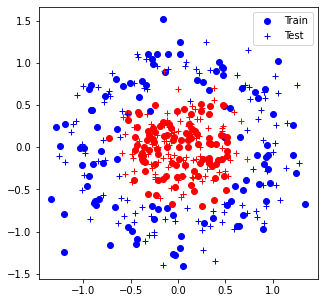

Iter 0: Acc train 61.0% (70.32), acc test 55.0% (70.38)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


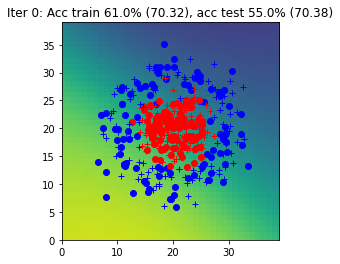

Iter 1: Acc train 64.0% (70.19), acc test 57.5% (70.25)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


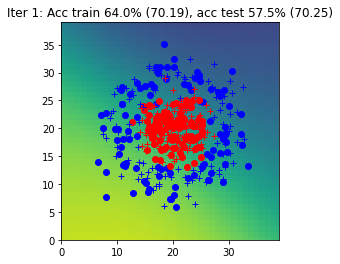

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 2: Acc train 64.0% (70.09), acc test 60.0% (70.15)


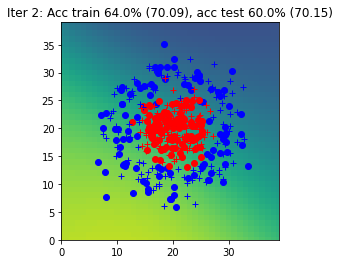

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 3: Acc train 63.5% (70.00), acc test 60.0% (70.06)


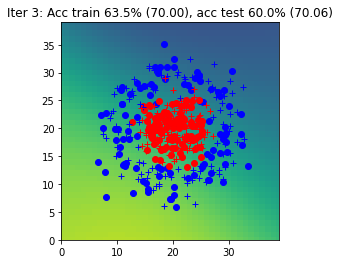

Iter 4: Acc train 63.0% (69.91), acc test 60.5% (69.98)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


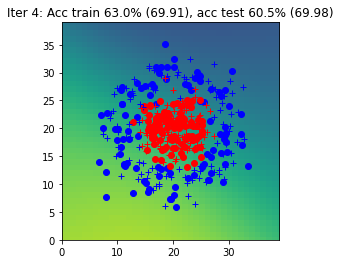

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 5: Acc train 62.5% (69.82), acc test 61.0% (69.90)


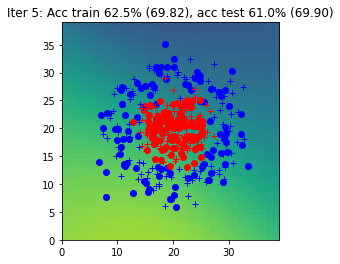

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 6: Acc train 62.0% (69.73), acc test 63.5% (69.82)


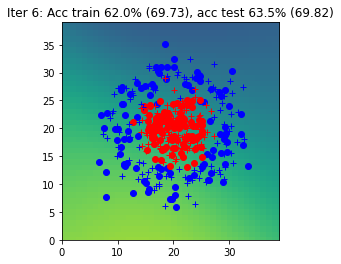

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 7: Acc train 62.5% (69.64), acc test 63.5% (69.74)


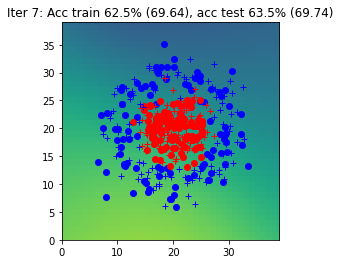

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 8: Acc train 63.5% (69.56), acc test 64.0% (69.66)


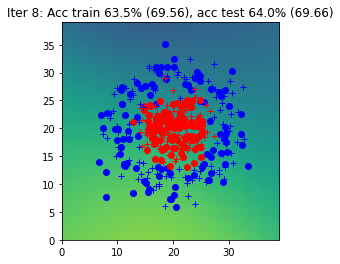

Iter 9: Acc train 64.5% (69.47), acc test 65.0% (69.59)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


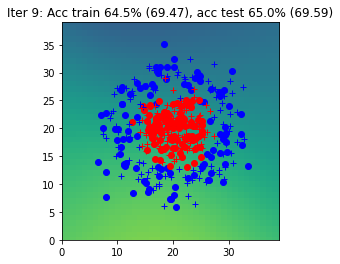

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 10: Acc train 65.0% (69.39), acc test 64.0% (69.52)


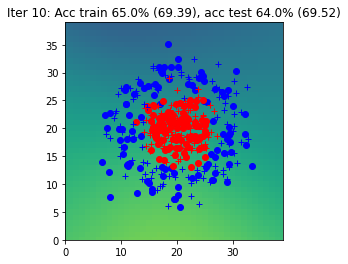

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 11: Acc train 64.5% (69.31), acc test 65.0% (69.45)


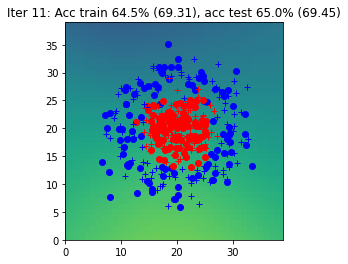

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 12: Acc train 65.0% (69.24), acc test 65.5% (69.38)


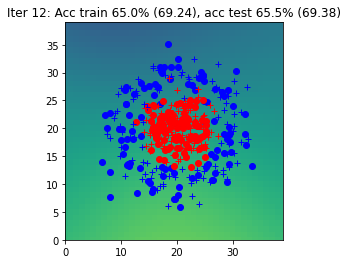

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 13: Acc train 66.0% (69.16), acc test 67.0% (69.32)


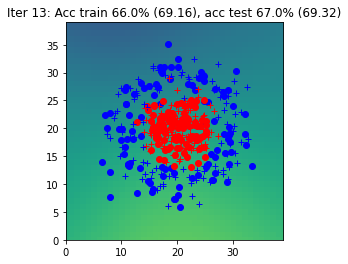

Iter 14: Acc train 65.5% (69.09), acc test 65.5% (69.26)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


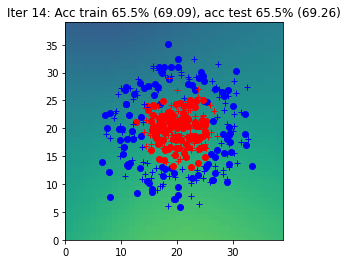

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 15: Acc train 65.0% (69.02), acc test 64.5% (69.20)


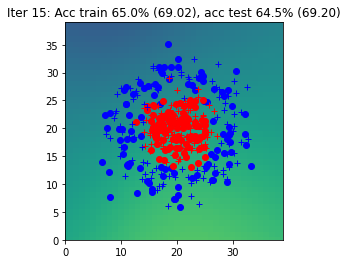

Iter 16: Acc train 64.5% (68.96), acc test 63.5% (69.15)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


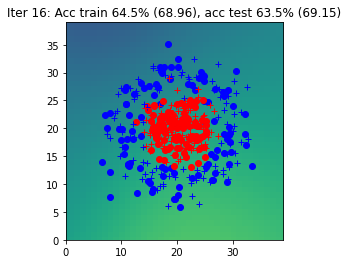

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 17: Acc train 65.0% (68.90), acc test 65.0% (69.10)


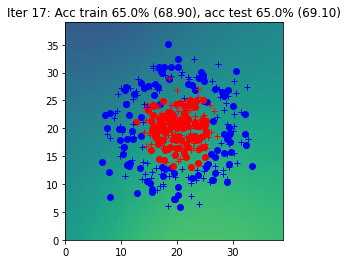

Iter 18: Acc train 65.5% (68.83), acc test 64.5% (69.05)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


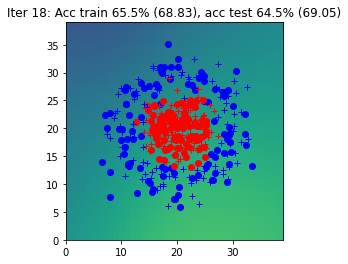

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 19: Acc train 66.0% (68.77), acc test 64.5% (68.99)


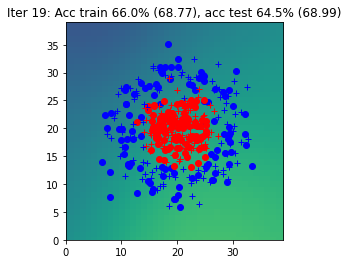

Iter 20: Acc train 67.5% (68.72), acc test 65.5% (68.94)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


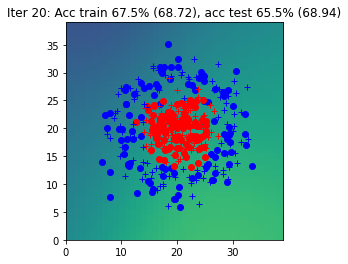

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 21: Acc train 67.0% (68.66), acc test 65.5% (68.90)


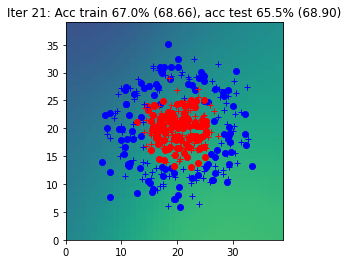

Iter 22: Acc train 66.0% (68.60), acc test 64.0% (68.85)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


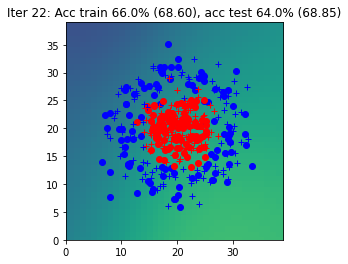

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 23: Acc train 68.0% (68.55), acc test 64.5% (68.80)


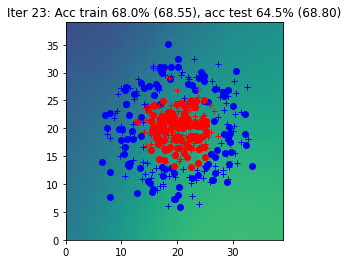

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 24: Acc train 67.0% (68.49), acc test 64.0% (68.75)


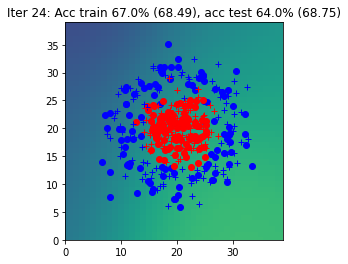

Iter 25: Acc train 67.0% (68.43), acc test 64.0% (68.70)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


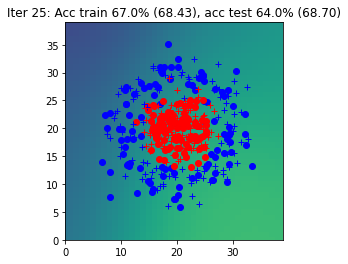

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 26: Acc train 66.0% (68.37), acc test 63.5% (68.65)


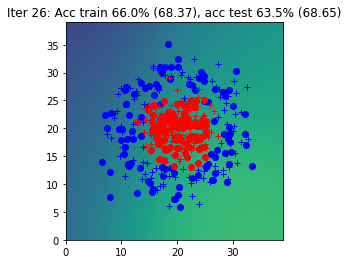

Iter 27: Acc train 66.0% (68.31), acc test 62.5% (68.60)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


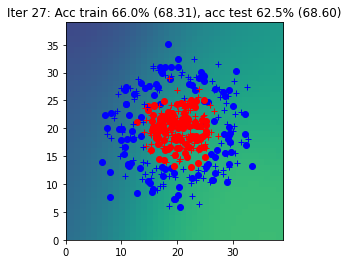

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 28: Acc train 66.5% (68.25), acc test 63.0% (68.54)


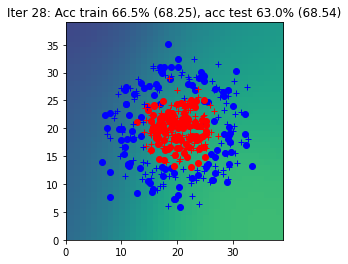

Iter 29: Acc train 67.5% (68.19), acc test 65.0% (68.49)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


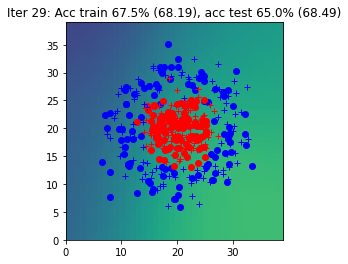

Iter 30: Acc train 67.5% (68.13), acc test 63.5% (68.43)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


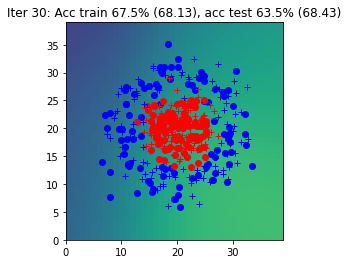

Iter 31: Acc train 68.0% (68.06), acc test 63.5% (68.37)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


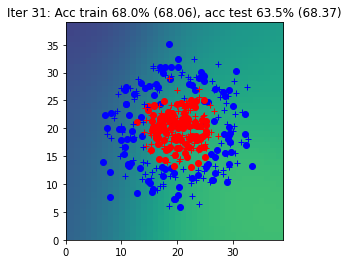

Iter 32: Acc train 68.5% (67.99), acc test 63.0% (68.31)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


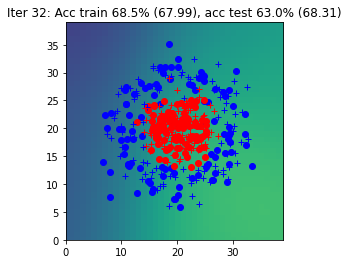

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 33: Acc train 68.0% (67.92), acc test 63.5% (68.24)


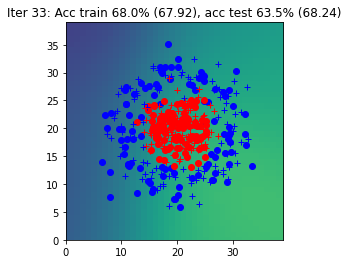

Iter 34: Acc train 67.0% (67.85), acc test 63.0% (68.17)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


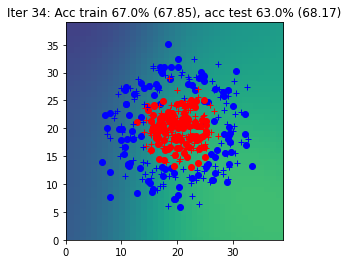

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 35: Acc train 68.0% (67.78), acc test 63.0% (68.10)


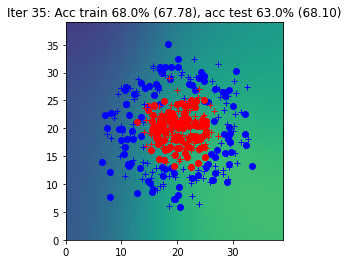

Iter 36: Acc train 68.0% (67.70), acc test 63.5% (68.03)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


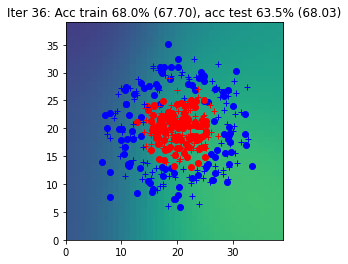

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 37: Acc train 68.0% (67.61), acc test 63.5% (67.95)


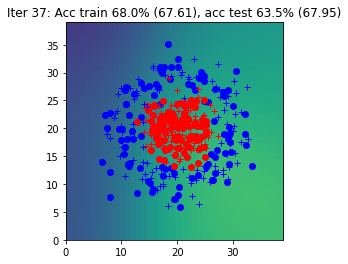

Iter 38: Acc train 68.5% (67.53), acc test 63.5% (67.87)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


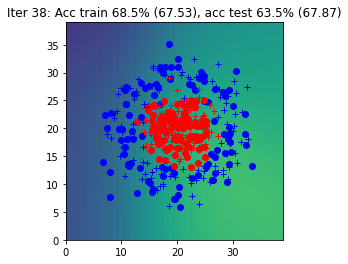

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 39: Acc train 68.0% (67.44), acc test 64.0% (67.79)


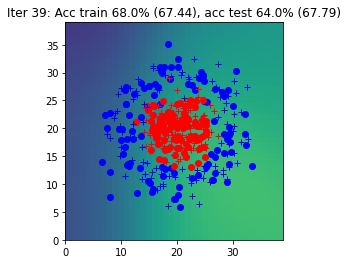

Iter 40: Acc train 68.0% (67.35), acc test 63.5% (67.70)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


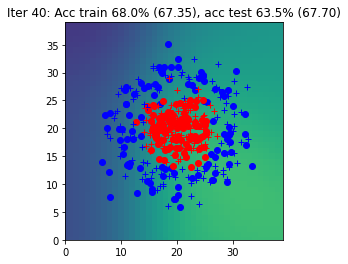

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 41: Acc train 68.0% (67.25), acc test 64.0% (67.60)


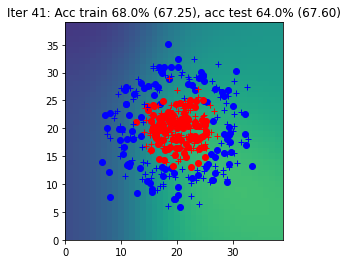

Iter 42: Acc train 68.5% (67.15), acc test 64.0% (67.51)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


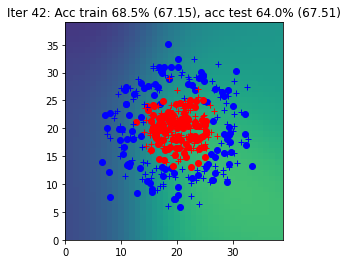

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 43: Acc train 68.5% (67.04), acc test 64.0% (67.41)


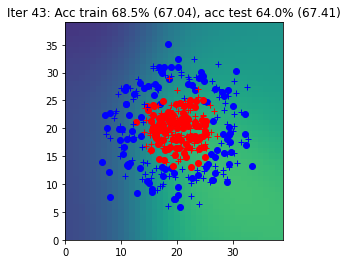

Iter 44: Acc train 68.5% (66.93), acc test 65.5% (67.30)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


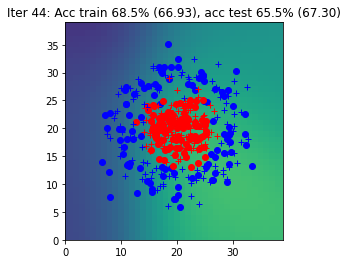

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 45: Acc train 69.5% (66.82), acc test 66.0% (67.20)


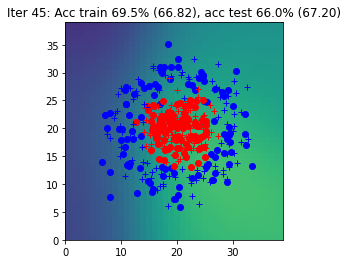

Iter 46: Acc train 69.5% (66.70), acc test 66.0% (67.08)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


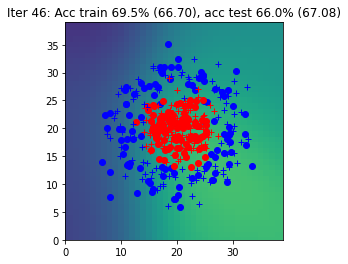

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 47: Acc train 69.5% (66.57), acc test 66.0% (66.96)


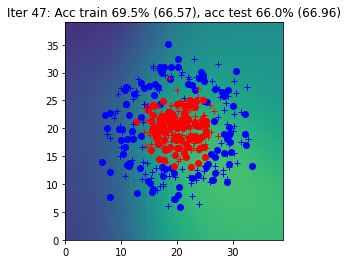

Iter 48: Acc train 69.0% (66.44), acc test 66.0% (66.82)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


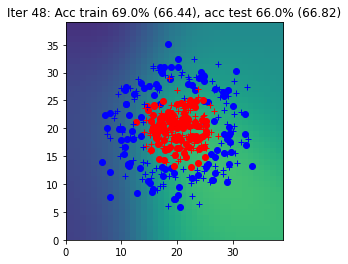

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 49: Acc train 69.5% (66.30), acc test 66.5% (66.69)


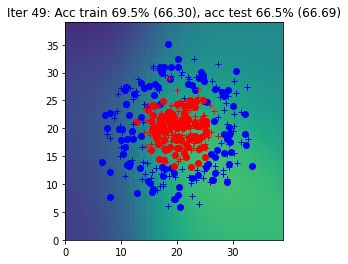

Iter 50: Acc train 69.5% (66.16), acc test 66.5% (66.55)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


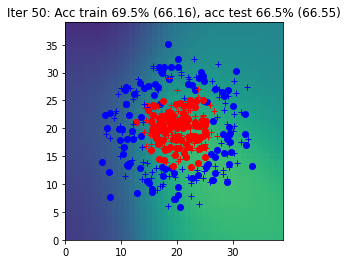

Iter 51: Acc train 70.5% (66.01), acc test 68.0% (66.41)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


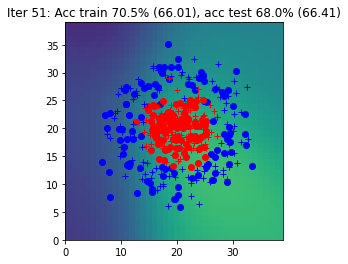

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 52: Acc train 70.5% (65.85), acc test 67.5% (66.26)


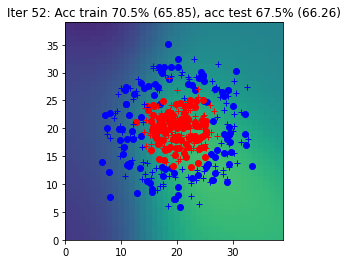

Iter 53: Acc train 71.5% (65.69), acc test 68.0% (66.10)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


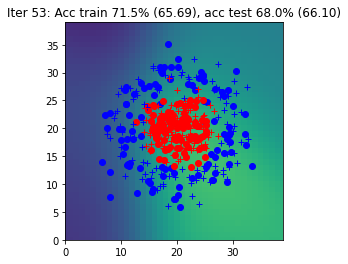

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 54: Acc train 72.0% (65.52), acc test 69.0% (65.93)


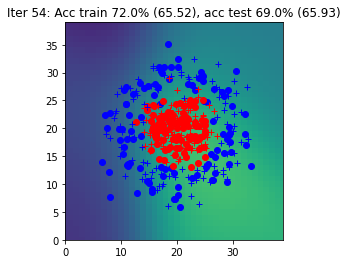

Iter 55: Acc train 72.0% (65.34), acc test 69.5% (65.76)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


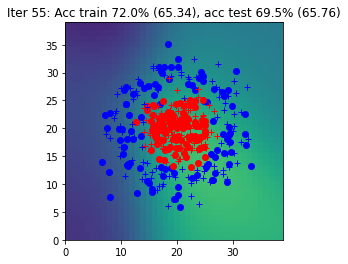

Iter 56: Acc train 72.5% (65.16), acc test 70.0% (65.58)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


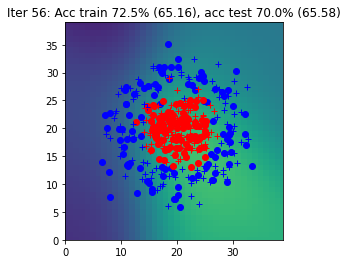

Iter 57: Acc train 73.0% (64.97), acc test 70.5% (65.40)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


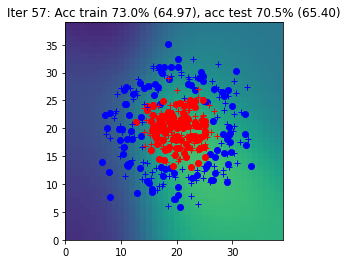

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 58: Acc train 74.5% (64.77), acc test 71.5% (65.20)


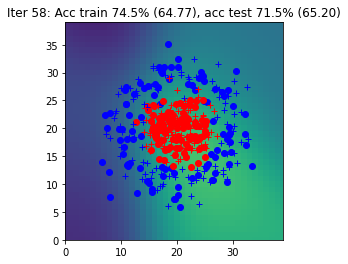

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 59: Acc train 74.5% (64.56), acc test 72.0% (65.00)


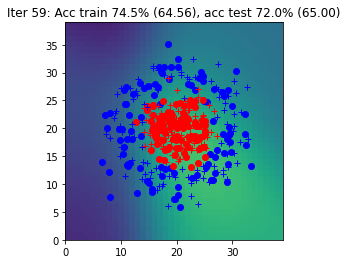

Iter 60: Acc train 76.0% (64.34), acc test 73.5% (64.79)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


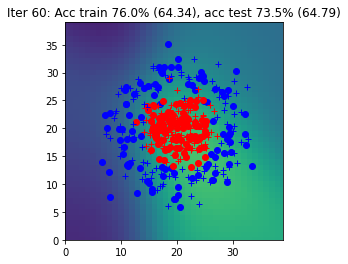

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 61: Acc train 78.0% (64.12), acc test 76.5% (64.58)


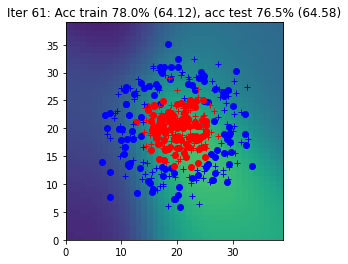

Iter 62: Acc train 78.5% (63.89), acc test 77.0% (64.36)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


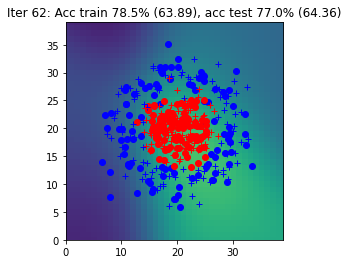

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 63: Acc train 78.0% (63.65), acc test 78.5% (64.13)


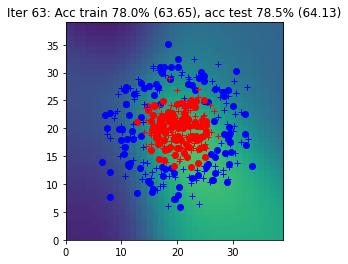

Iter 64: Acc train 78.5% (63.41), acc test 79.0% (63.89)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


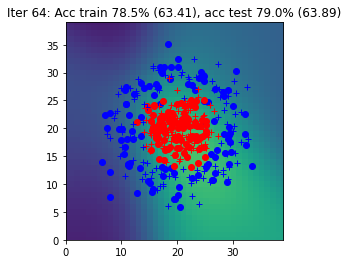

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 65: Acc train 78.5% (63.15), acc test 80.0% (63.65)


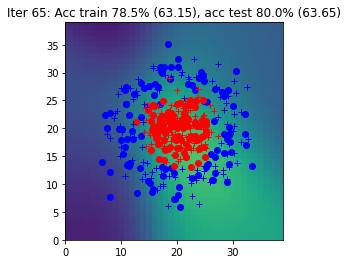

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 66: Acc train 79.5% (62.90), acc test 80.0% (63.40)


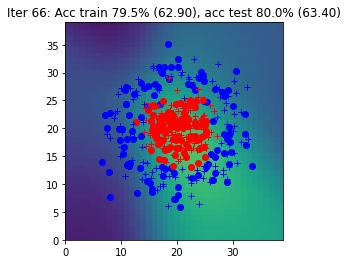

Iter 67: Acc train 80.0% (62.63), acc test 79.0% (63.14)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


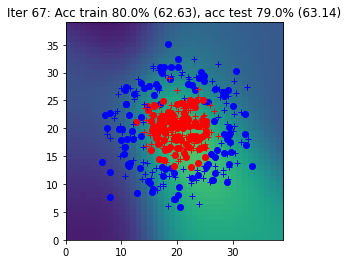

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 68: Acc train 80.5% (62.35), acc test 79.0% (62.89)


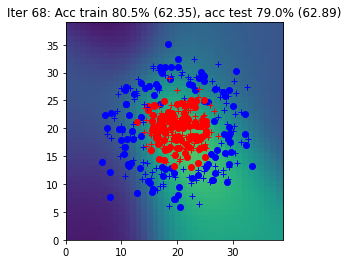

Iter 69: Acc train 81.0% (62.08), acc test 81.0% (62.62)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


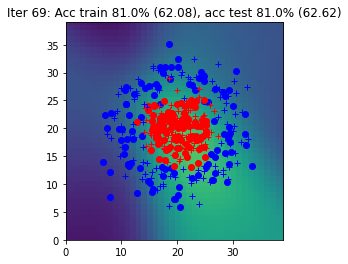

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 70: Acc train 80.5% (61.79), acc test 81.0% (62.35)


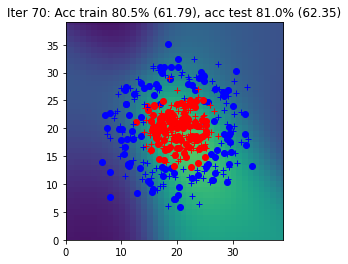

Iter 71: Acc train 82.0% (61.50), acc test 81.0% (62.07)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


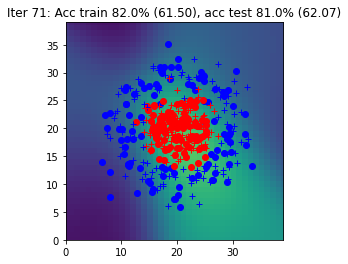

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 72: Acc train 81.5% (61.21), acc test 81.0% (61.79)


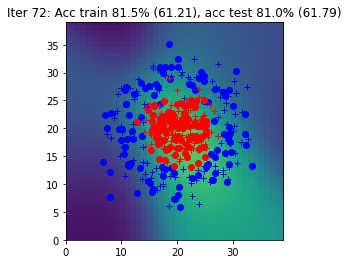

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 73: Acc train 82.5% (60.91), acc test 80.0% (61.51)


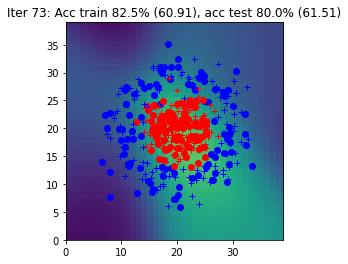

Iter 74: Acc train 83.0% (60.60), acc test 81.0% (61.22)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


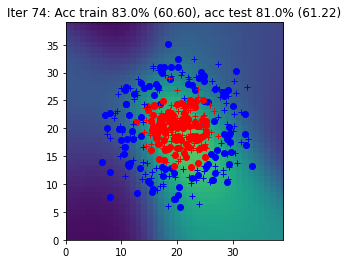

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 75: Acc train 82.5% (60.30), acc test 80.5% (60.93)


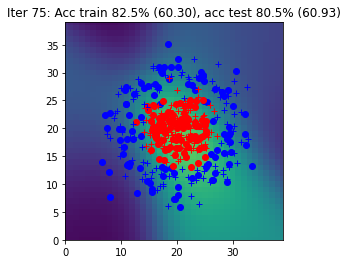

Iter 76: Acc train 83.0% (59.99), acc test 81.5% (60.63)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


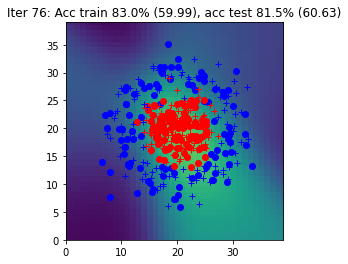

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 77: Acc train 83.0% (59.68), acc test 81.5% (60.33)


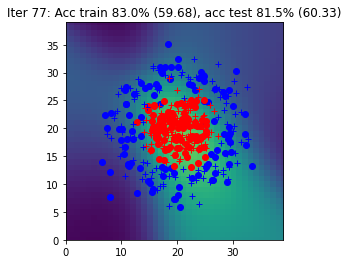

Iter 78: Acc train 83.5% (59.36), acc test 82.5% (60.03)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


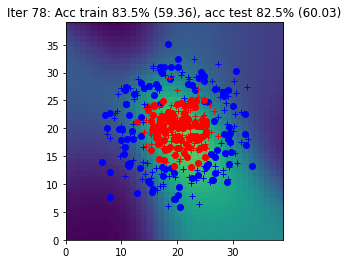

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 79: Acc train 84.0% (59.05), acc test 83.0% (59.74)


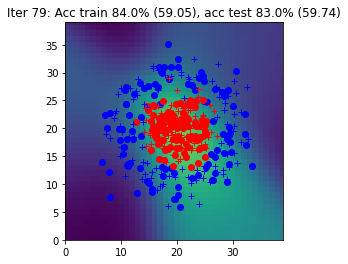

Iter 80: Acc train 84.5% (58.73), acc test 83.0% (59.44)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


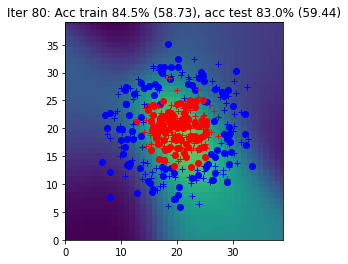

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 81: Acc train 83.5% (58.42), acc test 82.5% (59.14)


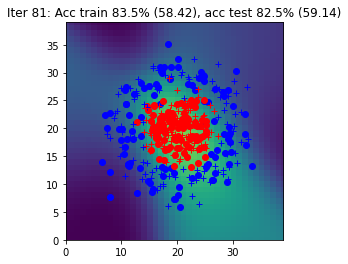

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 82: Acc train 84.5% (58.10), acc test 83.0% (58.83)


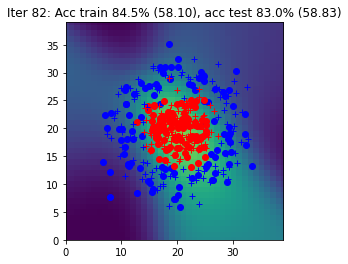

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 83: Acc train 85.5% (57.78), acc test 83.5% (58.52)


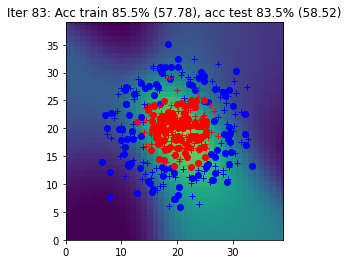

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 84: Acc train 86.5% (57.46), acc test 83.5% (58.22)


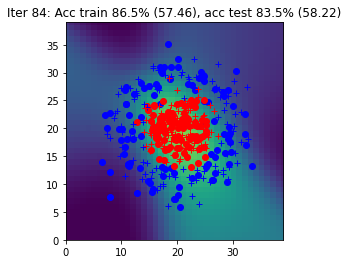

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 85: Acc train 86.5% (57.15), acc test 83.5% (57.93)


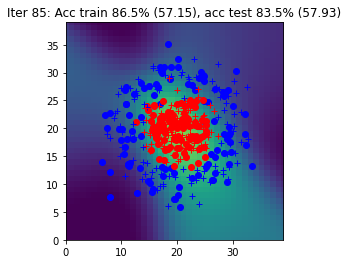

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 86: Acc train 87.0% (56.83), acc test 83.5% (57.63)


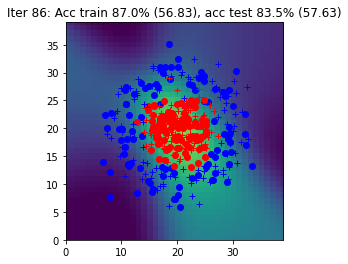

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 87: Acc train 87.0% (56.51), acc test 83.5% (57.32)


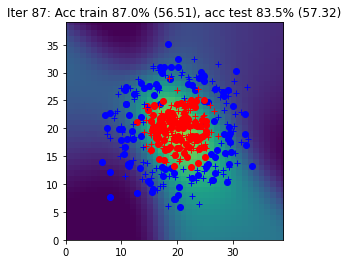

Iter 88: Acc train 87.0% (56.20), acc test 83.5% (57.02)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


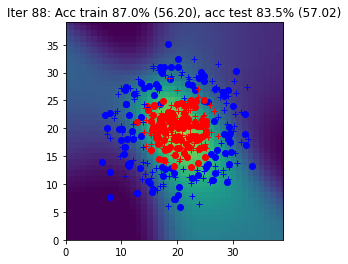

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 89: Acc train 87.5% (55.89), acc test 84.0% (56.71)


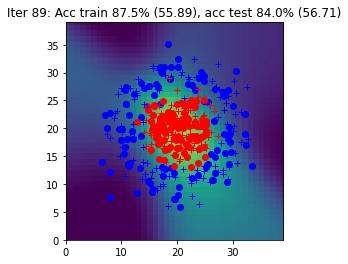

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 90: Acc train 88.5% (55.59), acc test 85.5% (56.43)


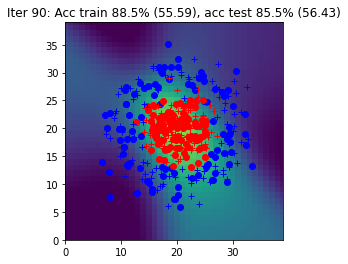

Iter 91: Acc train 88.5% (55.27), acc test 85.5% (56.11)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


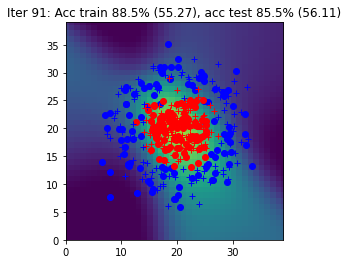

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 92: Acc train 88.5% (54.97), acc test 85.5% (55.81)


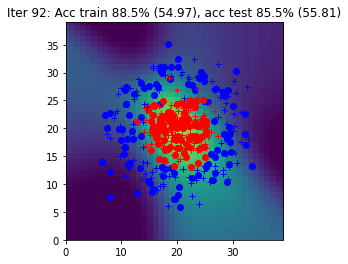

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 93: Acc train 88.5% (54.66), acc test 85.5% (55.52)


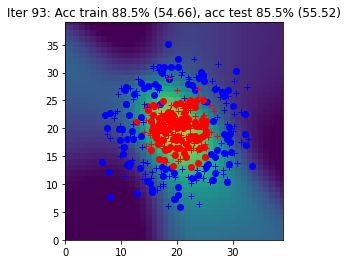

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 94: Acc train 89.0% (54.36), acc test 85.5% (55.22)


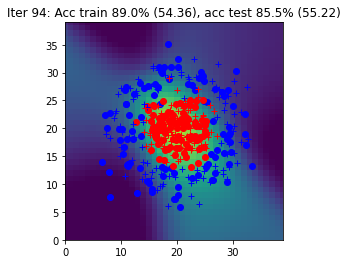

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 95: Acc train 89.0% (54.05), acc test 86.0% (54.92)


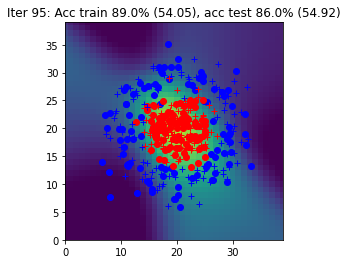

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 96: Acc train 89.0% (53.75), acc test 86.5% (54.61)


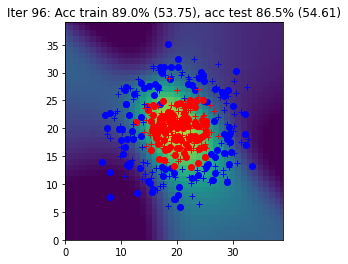

Iter 97: Acc train 89.0% (53.47), acc test 87.0% (54.34)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


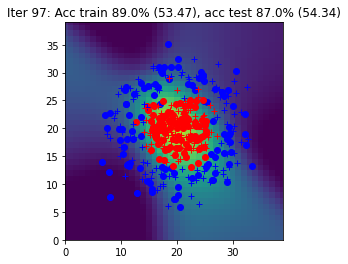

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 98: Acc train 89.5% (53.17), acc test 87.0% (54.02)


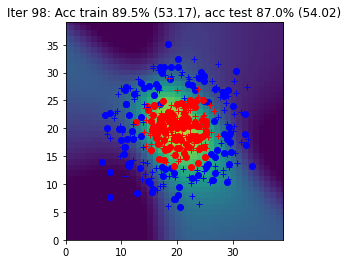

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 99: Acc train 90.0% (52.87), acc test 87.5% (53.73)


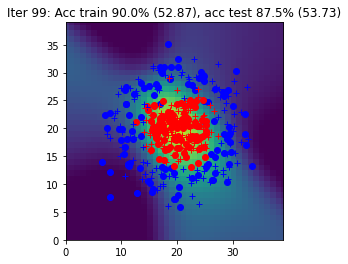

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 100: Acc train 90.5% (52.60), acc test 88.5% (53.48)


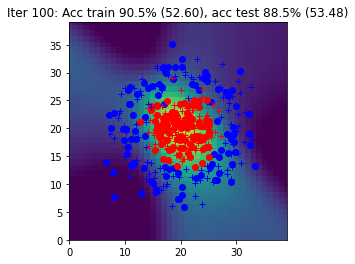

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 101: Acc train 90.5% (52.30), acc test 88.5% (53.16)


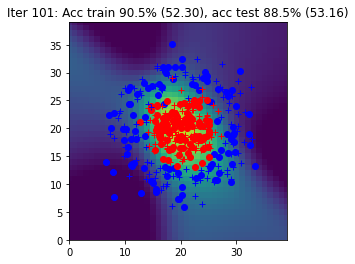

Iter 102: Acc train 91.0% (52.04), acc test 89.5% (52.91)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


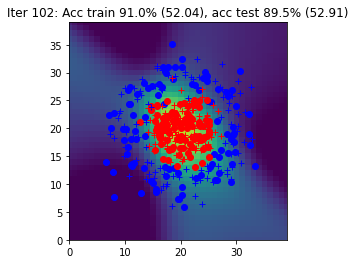

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 103: Acc train 91.0% (51.73), acc test 88.5% (52.59)


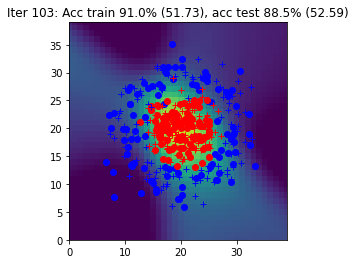

Iter 104: Acc train 91.0% (51.45), acc test 89.0% (52.30)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


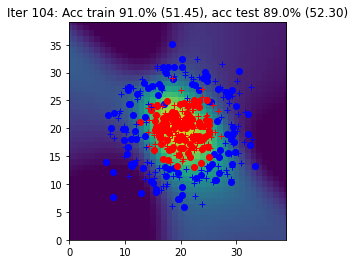

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 105: Acc train 91.0% (51.18), acc test 90.0% (52.03)


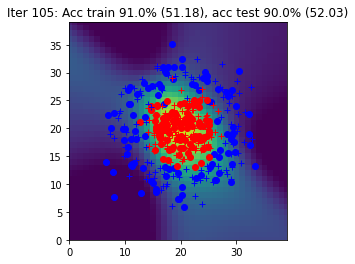

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 106: Acc train 91.0% (50.91), acc test 90.0% (51.76)


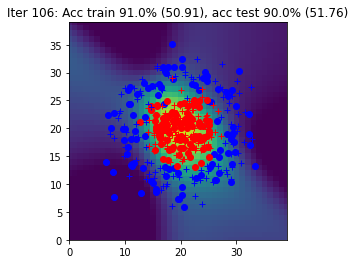

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 107: Acc train 91.5% (50.65), acc test 90.5% (51.49)


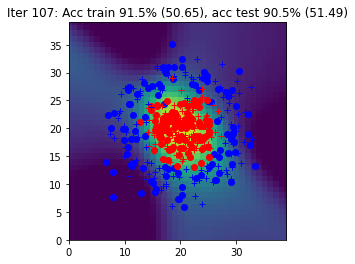

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 108: Acc train 91.5% (50.38), acc test 91.0% (51.22)


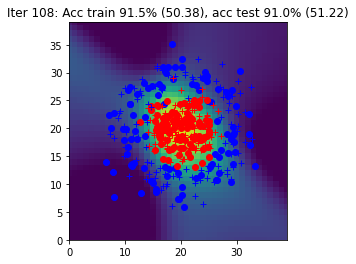

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 109: Acc train 93.0% (50.12), acc test 91.0% (50.96)


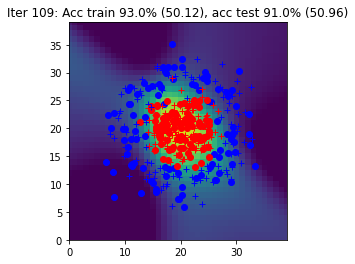

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 110: Acc train 93.0% (49.86), acc test 91.0% (50.70)


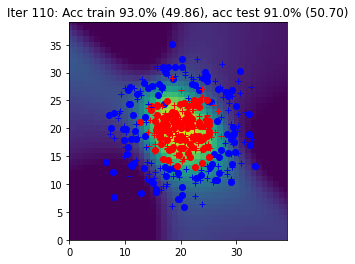

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 111: Acc train 93.5% (49.61), acc test 91.5% (50.45)


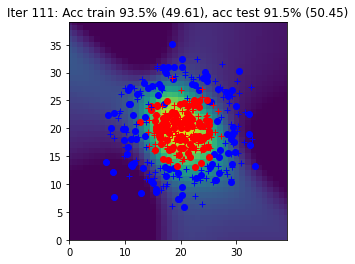

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 112: Acc train 94.0% (49.37), acc test 92.0% (50.22)


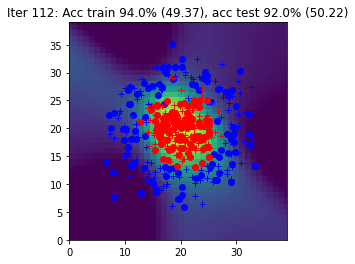

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 113: Acc train 94.5% (49.13), acc test 92.0% (49.97)


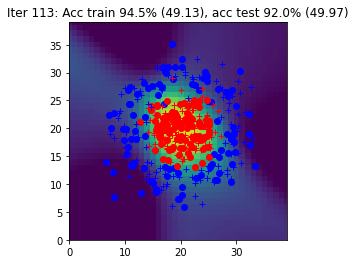

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 114: Acc train 95.0% (48.89), acc test 92.5% (49.73)


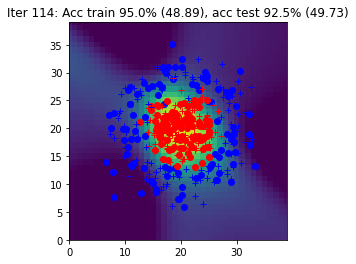

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 115: Acc train 95.5% (48.67), acc test 93.0% (49.53)


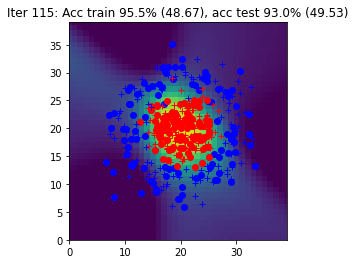

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 116: Acc train 95.5% (48.44), acc test 94.0% (49.28)


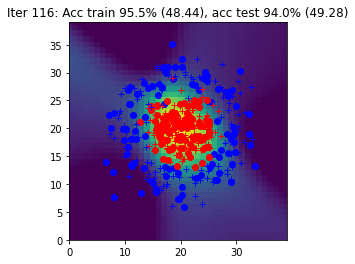

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 117: Acc train 95.5% (48.21), acc test 94.0% (49.05)


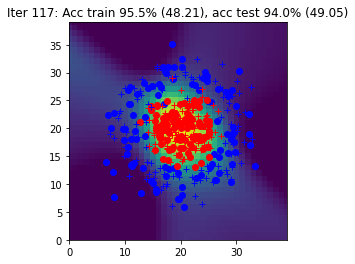

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 118: Acc train 95.5% (47.99), acc test 94.0% (48.82)


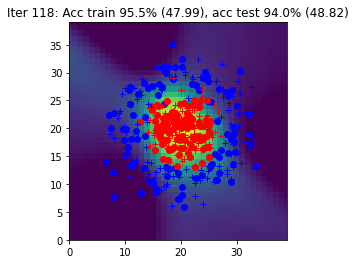

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 119: Acc train 95.5% (47.77), acc test 94.0% (48.58)


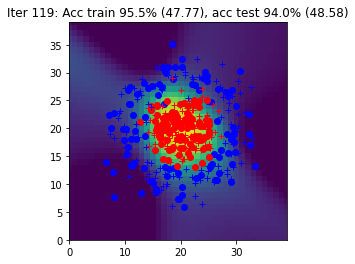

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 120: Acc train 95.5% (47.56), acc test 94.0% (48.36)


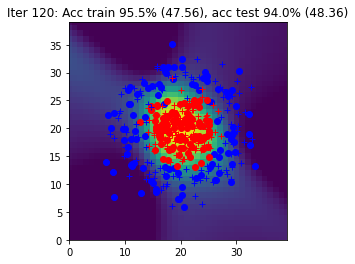

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 121: Acc train 95.5% (47.36), acc test 94.0% (48.15)


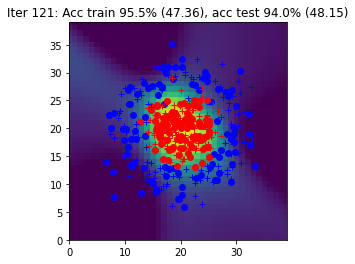

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 122: Acc train 95.5% (47.16), acc test 94.0% (47.94)


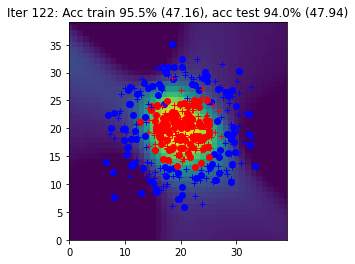

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 123: Acc train 95.5% (46.97), acc test 93.5% (47.76)


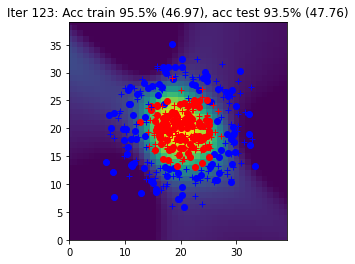

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 124: Acc train 95.5% (46.77), acc test 94.0% (47.54)


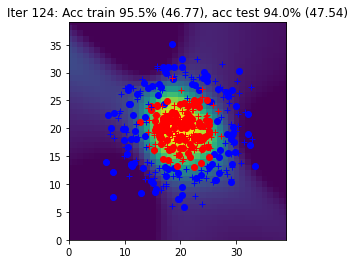

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 125: Acc train 95.5% (46.59), acc test 94.0% (47.35)


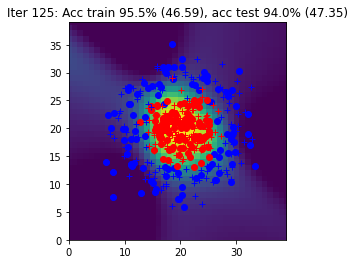

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 126: Acc train 95.5% (46.41), acc test 94.5% (47.15)


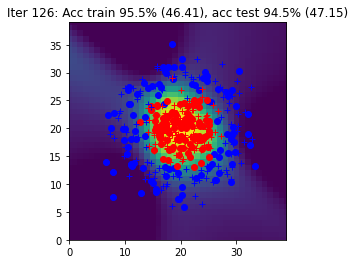

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 127: Acc train 95.5% (46.24), acc test 94.5% (46.96)


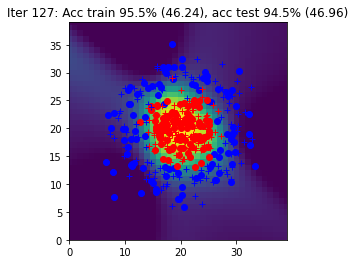

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 128: Acc train 95.5% (46.06), acc test 94.5% (46.80)


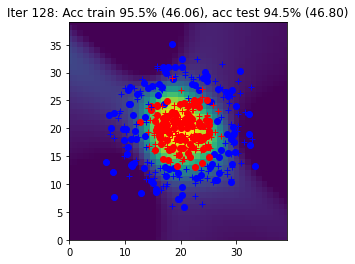

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 129: Acc train 95.0% (45.90), acc test 95.0% (46.65)


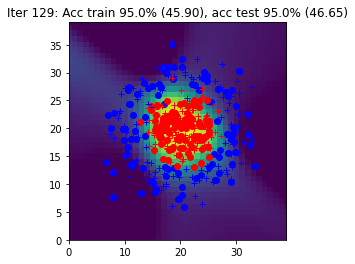

Iter 130: Acc train 95.0% (45.74), acc test 95.0% (46.46)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


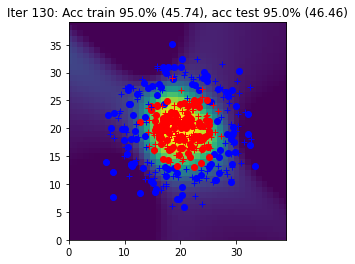

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 131: Acc train 95.0% (45.58), acc test 95.0% (46.30)


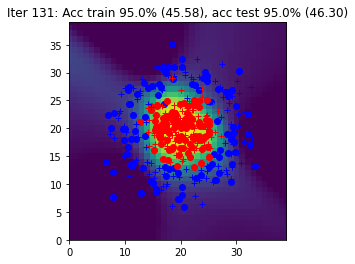

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 132: Acc train 95.0% (45.43), acc test 95.0% (46.13)


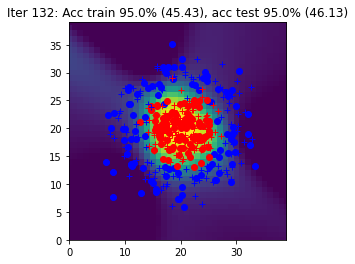

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 133: Acc train 95.5% (45.28), acc test 95.0% (45.99)


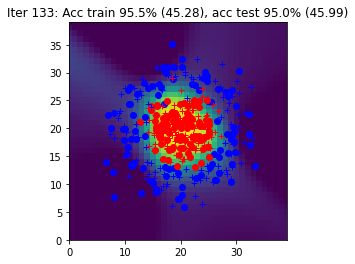

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 134: Acc train 95.0% (45.14), acc test 95.0% (45.82)


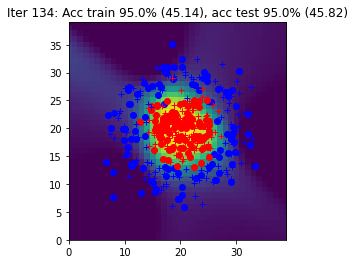

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 135: Acc train 95.5% (44.99), acc test 95.0% (45.70)


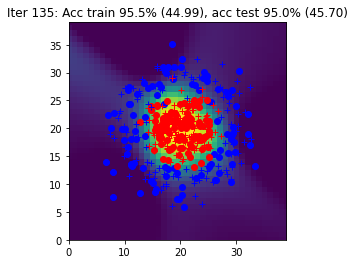

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 136: Acc train 95.5% (44.85), acc test 95.0% (45.54)


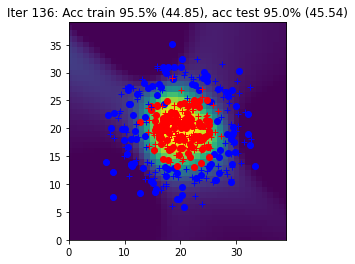

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 137: Acc train 95.5% (44.72), acc test 95.0% (45.41)


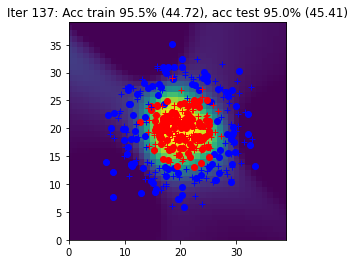

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 138: Acc train 95.5% (44.59), acc test 95.0% (45.29)


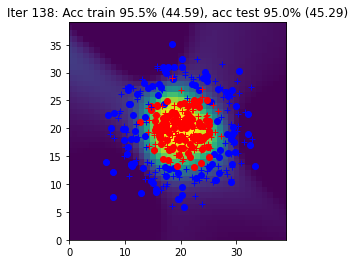

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 139: Acc train 95.5% (44.47), acc test 95.5% (45.14)


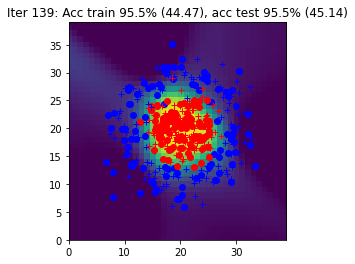

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 140: Acc train 96.0% (44.34), acc test 95.0% (45.01)


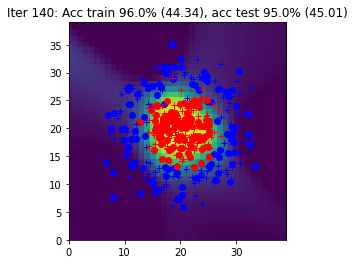

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 141: Acc train 96.0% (44.22), acc test 95.0% (44.90)


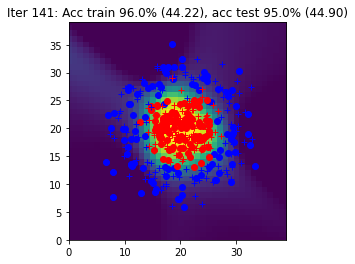

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 142: Acc train 95.5% (44.11), acc test 95.0% (44.77)


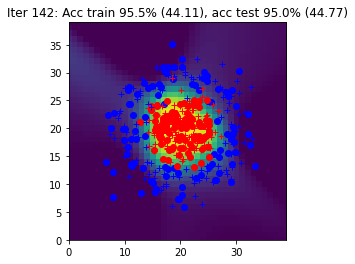

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 143: Acc train 96.0% (43.99), acc test 95.0% (44.68)


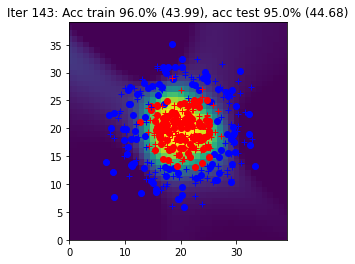

Iter 144: Acc train 96.0% (43.88), acc test 95.0% (44.54)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


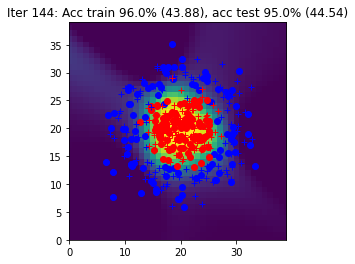

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 145: Acc train 96.0% (43.78), acc test 95.0% (44.44)


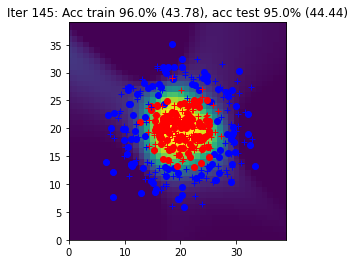

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 146: Acc train 96.0% (43.67), acc test 95.0% (44.33)


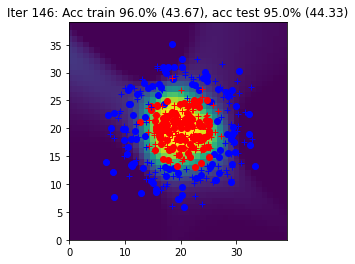

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 147: Acc train 96.0% (43.57), acc test 95.0% (44.23)


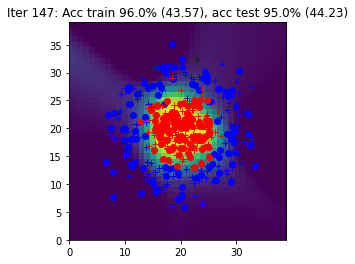

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 148: Acc train 96.0% (43.47), acc test 95.0% (44.12)


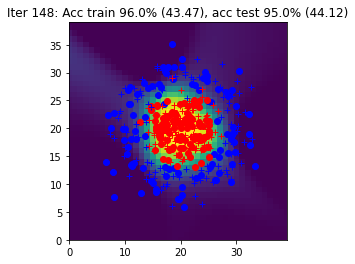

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 149: Acc train 96.0% (43.37), acc test 95.0% (44.01)


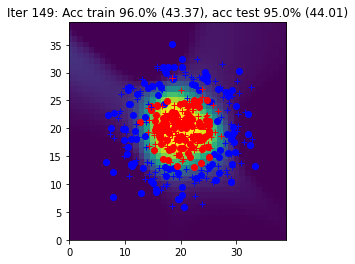

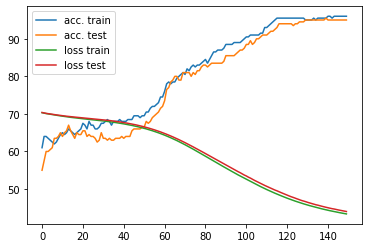

In [ ]:
 # init
data = CirclesData()
data.plot_data()
N = data.Xtrain.shape[0]
Nbatch = 10
nx = data.Xtrain.shape[1]
nh = 10
ny = data.Ytrain.shape[1]
eta = 0.06

model, loss = init_model(nx, nh, ny)

curves = [[],[], [], []]

# epoch
for iteration in range(150):

    # permute
    perm = np.random.permutation(N)
    Xtrain = data.Xtrain[perm, :]
    Ytrain = data.Ytrain[perm, :]

    # batches
    for j in range(N // Nbatch):

        indsBatch = range(j * Nbatch, (j+1) * Nbatch)
        X = Xtrain[indsBatch, :]
        Y = Ytrain[indsBatch, :]

        # write the optimization algorithm on the batch (X,Y)
        # using the functions: loss_accuracy, sgd
        # the forward with the predict method from the model
        # and the backward function with autograd
        Yhat = model(X)
        L = loss(Yhat, Y)
        L.backward()
        model = sgd(model, eta)


    Yhat_train = model(data.Xtrain)
    Yhat_test = model(data.Xtest)
    Ltrain, acctrain = loss_accuracy(loss, Yhat_train, data.Ytrain)
    Ltest, acctest = loss_accuracy(loss, Yhat_test, data.Ytest)
    Ygrid = model(data.Xgrid)

    title = 'Iter {}: Acc train {:.1f}% ({:.2f}), acc test {:.1f}% ({:.2f})'.format(iteration, acctrain, Ltrain, acctest, Ltest)
    print(title)
    data.plot_data_with_grid(torch.nn.Softmax(dim=1)(Ygrid.detach()), title)

    curves[0].append(acctrain)
    curves[1].append(acctest)
    curves[2].append(Ltrain.detach())
    curves[3].append(Ltest.detach())

fig = plt.figure()
plt.plot(curves[0], label="acc. train")
plt.plot(curves[1], label="acc. test")
plt.plot(curves[2], label="loss train")
plt.plot(curves[3], label="loss test")
plt.legend()
plt.show()

# Part 4 : Simplification of the SGD with `torch.optim`

In [ ]:
def init_model(nx, nh, ny, eta):

    #####################
    ## Your code here  ##
    #####################

    model = torch.nn.Sequential(
      torch.nn.Linear(nx, nh),
      torch.nn.Tanh(),
      torch.nn.Linear(nh, ny),
      torch.nn.Softmax()
    )
    loss = torch.nn.CrossEntropyLoss()
    optim = optim = torch.optim.SGD(model.parameters(), lr=eta)

    ####################
    ##      END        #
    ####################

    return model, loss, optim

The `sgd` function is replaced by calling the `optim.zero_grad()` before the backward and `optim.step()` after.

## Algorithme global d'apprentissage (avec autograd, les couches `torch.nn` et `torch.optim`)

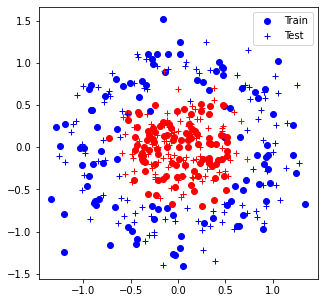

Iter 0: Acc train 44.0% (69.85), acc test 49.0% (69.85)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


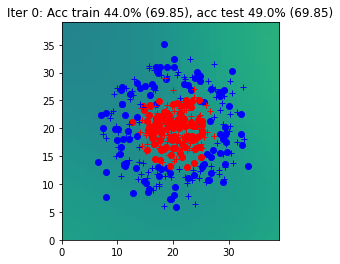

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 1: Acc train 58.5% (69.76), acc test 58.0% (69.75)


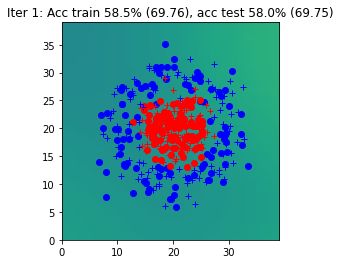

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 2: Acc train 55.5% (69.68), acc test 56.5% (69.67)


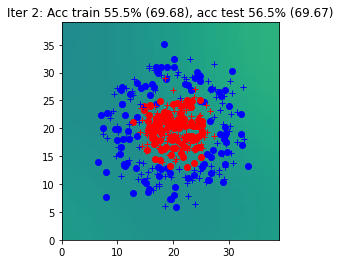

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 3: Acc train 57.0% (69.62), acc test 58.5% (69.60)


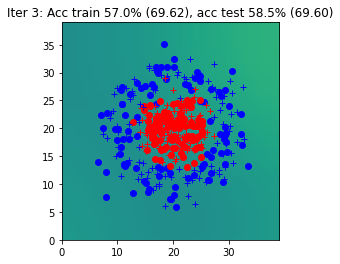

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 4: Acc train 56.0% (69.55), acc test 57.5% (69.53)


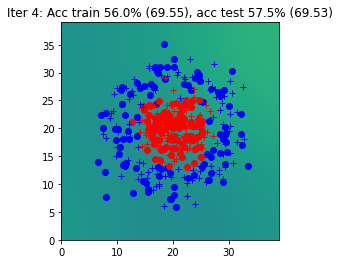

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 5: Acc train 60.5% (69.50), acc test 62.0% (69.47)


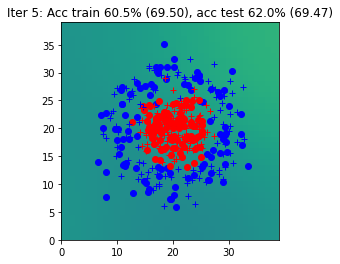

Iter 6: Acc train 61.0% (69.44), acc test 61.5% (69.41)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


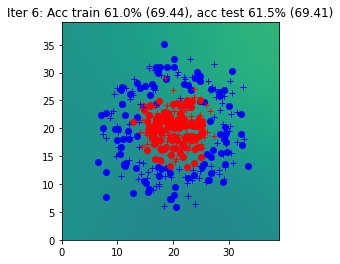

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 7: Acc train 62.5% (69.39), acc test 64.0% (69.35)


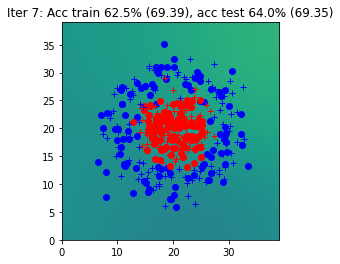

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 8: Acc train 62.5% (69.34), acc test 64.5% (69.30)


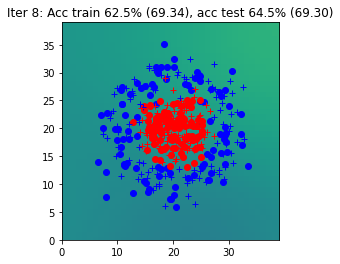

Iter 9: Acc train 62.0% (69.29), acc test 65.0% (69.24)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


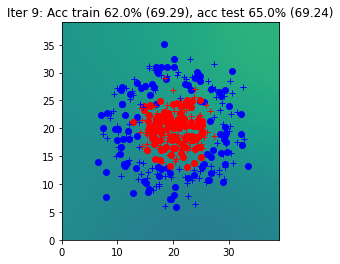

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 10: Acc train 61.5% (69.25), acc test 65.0% (69.19)


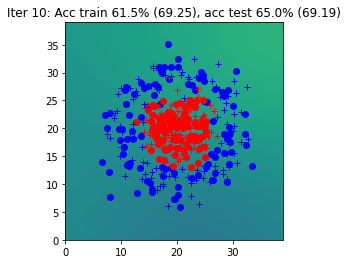

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 11: Acc train 62.0% (69.20), acc test 65.5% (69.14)


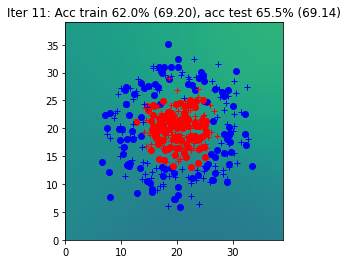

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 12: Acc train 62.5% (69.15), acc test 64.0% (69.09)


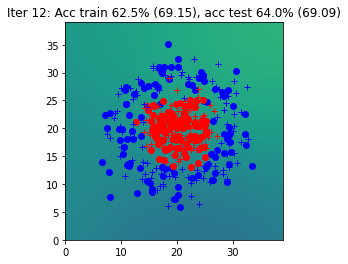

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 13: Acc train 62.0% (69.11), acc test 63.0% (69.04)


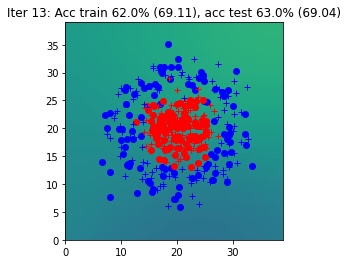

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 14: Acc train 63.5% (69.06), acc test 63.5% (68.98)


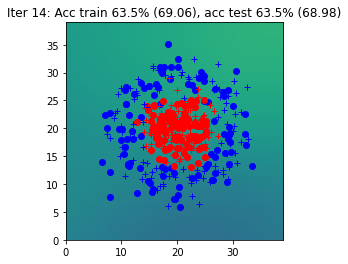

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 15: Acc train 64.0% (69.02), acc test 66.0% (68.93)


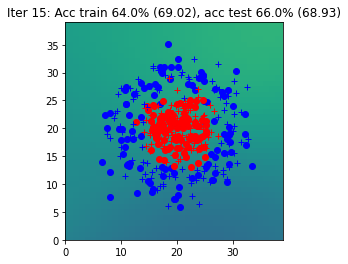

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 16: Acc train 64.5% (68.97), acc test 66.5% (68.88)


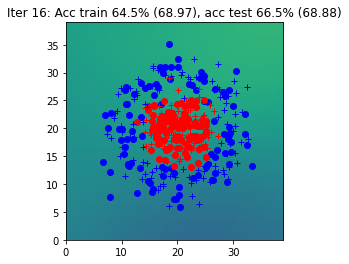

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 17: Acc train 64.5% (68.93), acc test 66.0% (68.83)


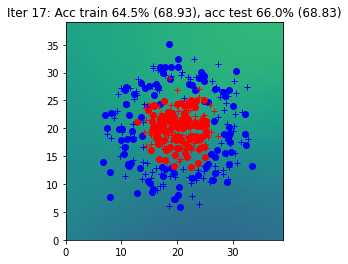

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 18: Acc train 63.0% (68.87), acc test 63.0% (68.77)


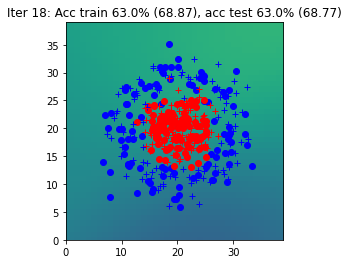

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 19: Acc train 61.5% (68.82), acc test 61.5% (68.71)


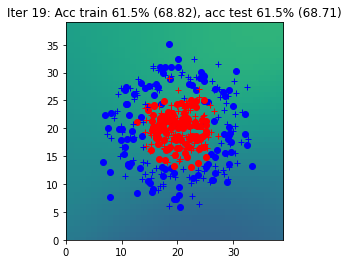

Iter 20: Acc train 63.0% (68.77), acc test 63.0% (68.65)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


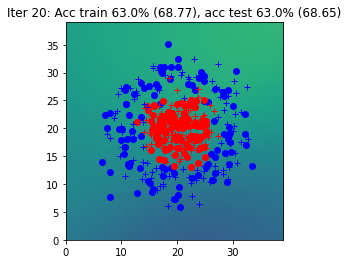

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 21: Acc train 65.0% (68.72), acc test 65.5% (68.59)


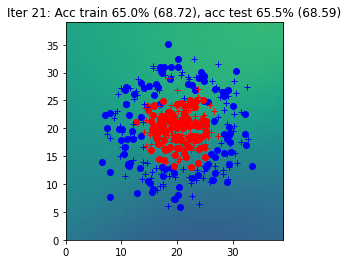

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 22: Acc train 64.5% (68.66), acc test 65.5% (68.53)


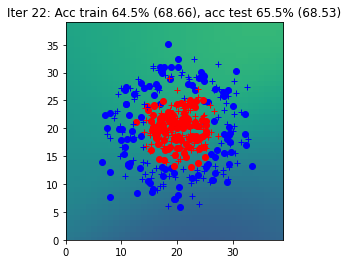

Iter 23: Acc train 64.5% (68.60), acc test 65.0% (68.46)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


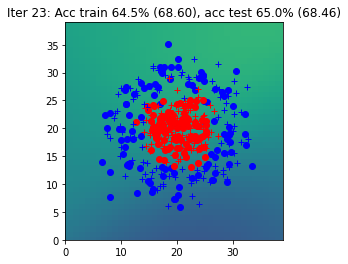

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 24: Acc train 65.0% (68.54), acc test 65.0% (68.39)


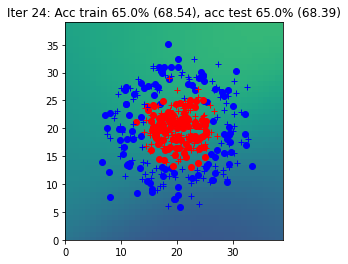

Iter 25: Acc train 64.5% (68.48), acc test 65.5% (68.32)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


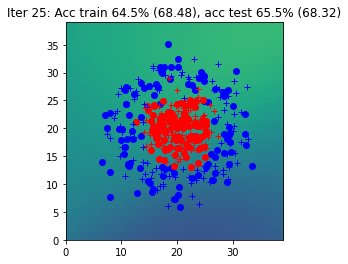

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 26: Acc train 65.0% (68.41), acc test 64.5% (68.25)


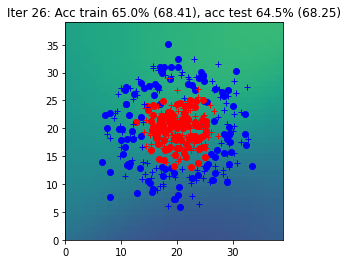

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 27: Acc train 64.5% (68.34), acc test 65.0% (68.17)


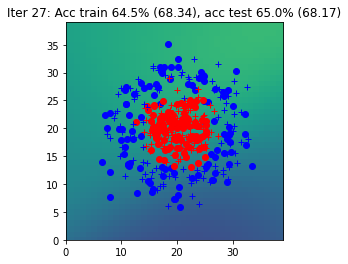

Iter 28: Acc train 65.0% (68.26), acc test 64.0% (68.09)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


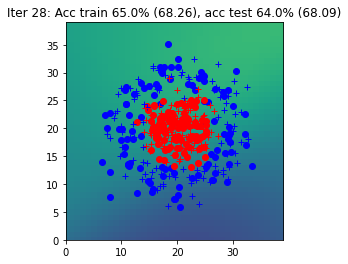

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 29: Acc train 65.5% (68.18), acc test 65.5% (68.00)


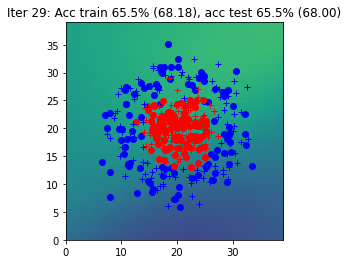

Iter 30: Acc train 63.5% (68.10), acc test 63.0% (67.92)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


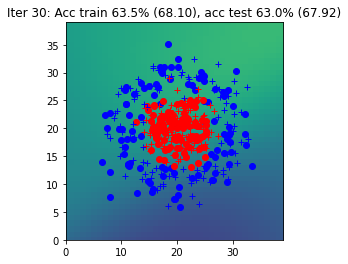

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 31: Acc train 64.0% (68.01), acc test 62.0% (67.82)


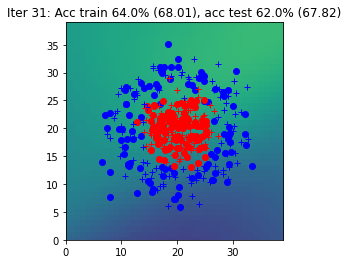

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 32: Acc train 64.0% (67.91), acc test 63.0% (67.72)


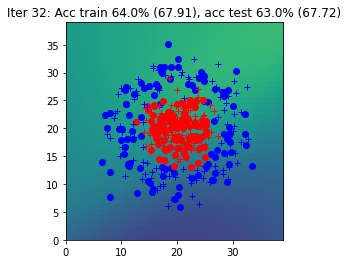

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 33: Acc train 65.5% (67.81), acc test 64.0% (67.61)


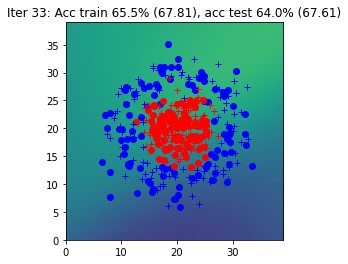

Iter 34: Acc train 65.5% (67.70), acc test 64.0% (67.50)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


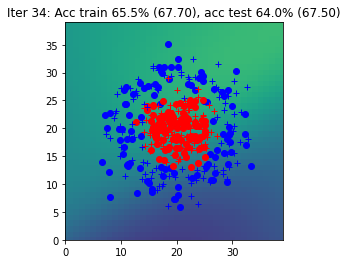

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 35: Acc train 65.5% (67.59), acc test 64.5% (67.37)


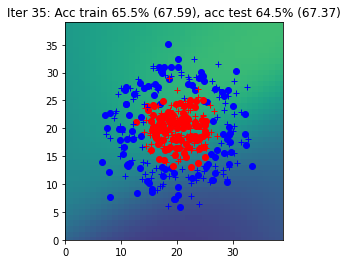

Iter 36: Acc train 65.5% (67.47), acc test 65.0% (67.25)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


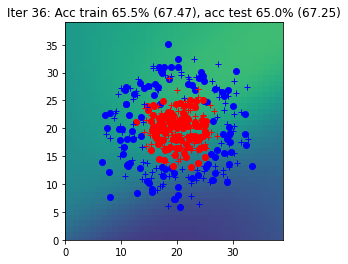

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 37: Acc train 65.0% (67.34), acc test 66.0% (67.12)


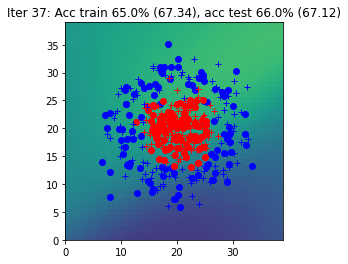

Iter 38: Acc train 64.5% (67.21), acc test 66.0% (66.97)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


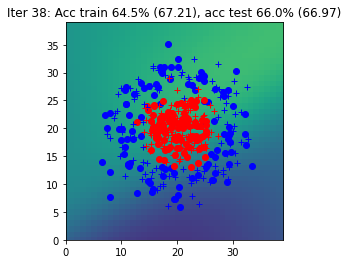

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 39: Acc train 64.0% (67.06), acc test 66.0% (66.83)


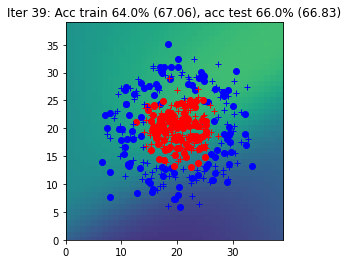

Iter 40: Acc train 64.5% (66.91), acc test 66.0% (66.67)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


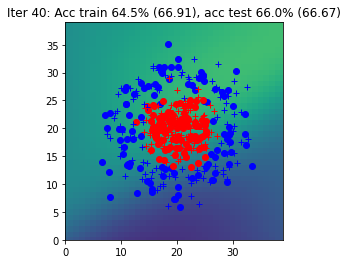

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 41: Acc train 66.0% (66.74), acc test 65.5% (66.50)


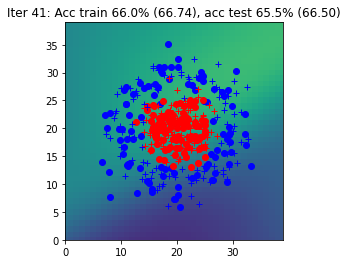

Iter 42: Acc train 66.5% (66.57), acc test 64.5% (66.33)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


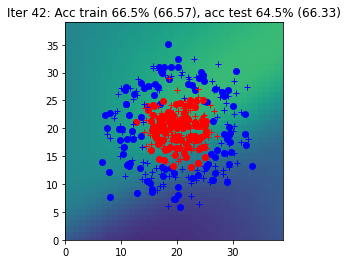

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 43: Acc train 66.5% (66.39), acc test 65.0% (66.15)


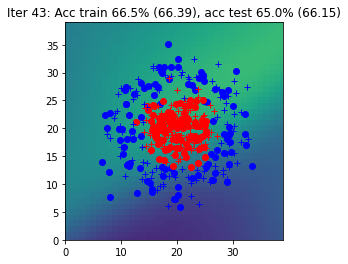

Iter 44: Acc train 66.5% (66.19), acc test 65.0% (65.96)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


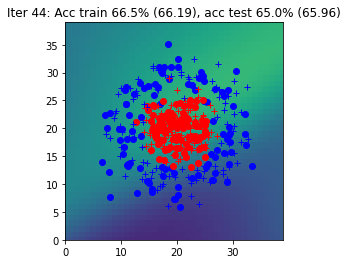

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 45: Acc train 67.0% (65.99), acc test 65.0% (65.75)


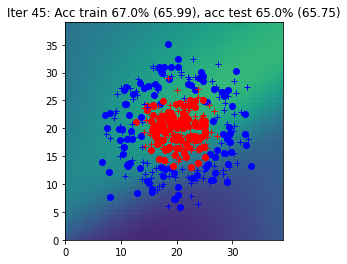

Iter 46: Acc train 65.0% (65.76), acc test 66.0% (65.52)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


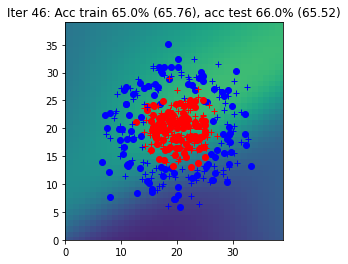

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 47: Acc train 64.5% (65.53), acc test 66.0% (65.29)


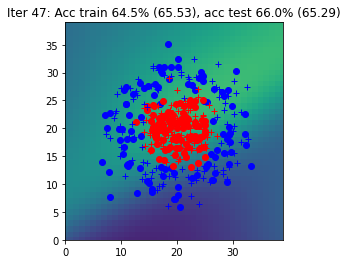

Iter 48: Acc train 65.0% (65.28), acc test 66.0% (65.04)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


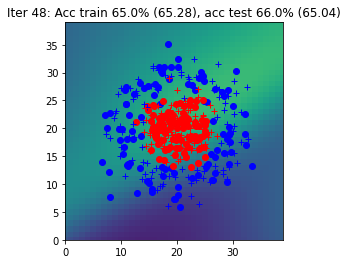

Iter 49: Acc train 67.5% (65.02), acc test 67.5% (64.79)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


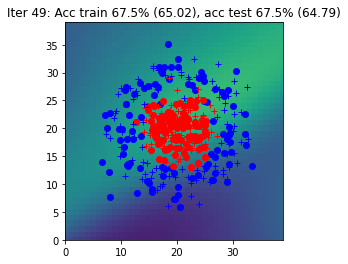

Iter 50: Acc train 67.0% (64.74), acc test 67.0% (64.51)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


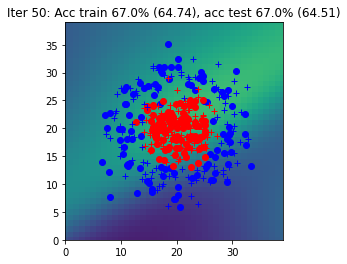

Iter 51: Acc train 68.5% (64.45), acc test 70.5% (64.22)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


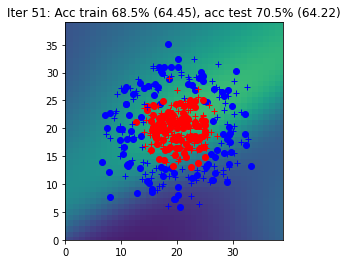

Iter 52: Acc train 71.0% (64.14), acc test 72.5% (63.92)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


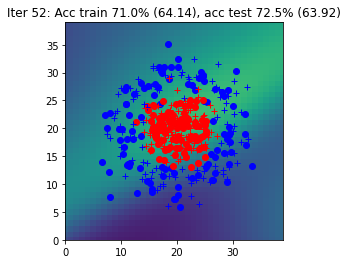

Iter 53: Acc train 72.0% (63.83), acc test 73.5% (63.61)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


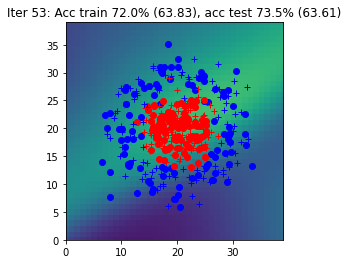

Iter 54: Acc train 72.5% (63.50), acc test 73.5% (63.28)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


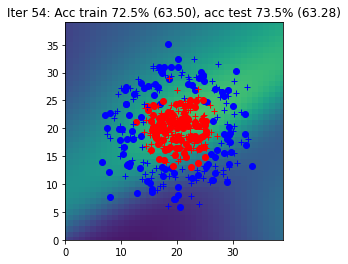

Iter 55: Acc train 75.5% (63.14), acc test 76.5% (62.94)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


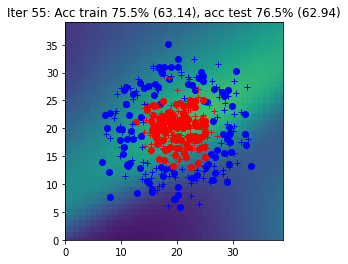

Iter 56: Acc train 75.5% (62.78), acc test 76.5% (62.57)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


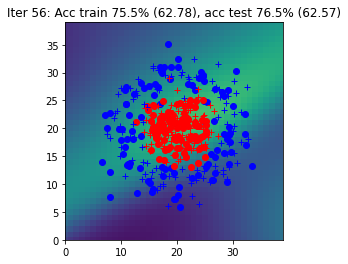

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 57: Acc train 76.5% (62.40), acc test 79.5% (62.21)


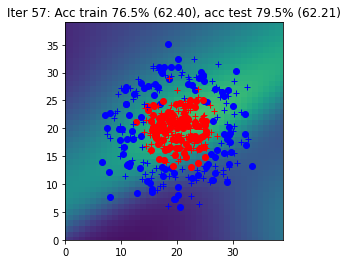

Iter 58: Acc train 76.0% (62.02), acc test 78.0% (61.84)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


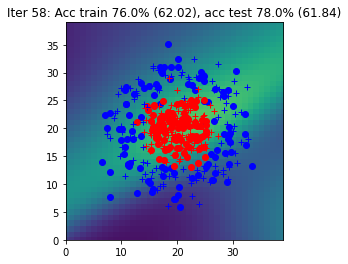

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 59: Acc train 77.0% (61.61), acc test 78.5% (61.43)


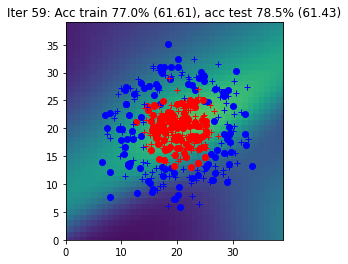

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 60: Acc train 77.0% (61.20), acc test 79.5% (61.02)


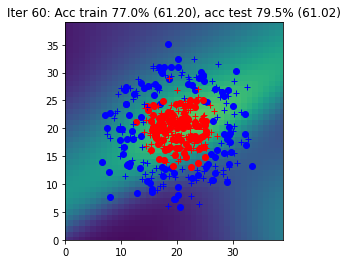

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 61: Acc train 77.0% (60.79), acc test 79.5% (60.62)


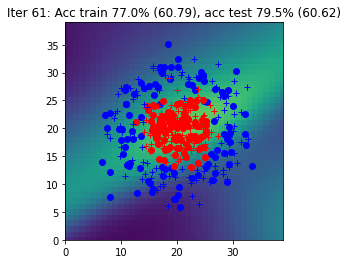

Iter 62: Acc train 80.0% (60.34), acc test 82.5% (60.17)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


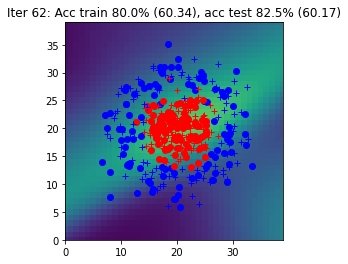

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 63: Acc train 78.5% (59.92), acc test 81.0% (59.75)


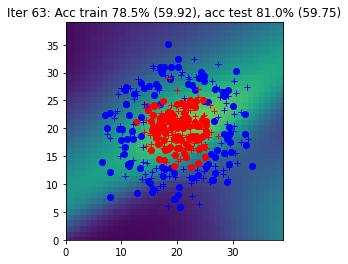

Iter 64: Acc train 80.5% (59.46), acc test 83.0% (59.29)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


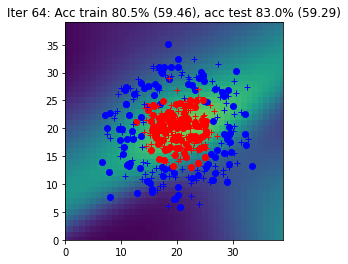

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 65: Acc train 82.0% (59.00), acc test 83.0% (58.84)


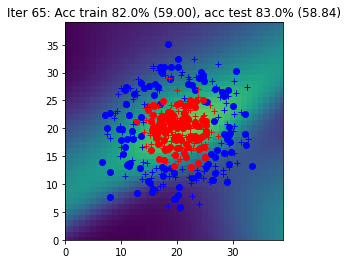

Iter 66: Acc train 79.0% (58.60), acc test 80.5% (58.44)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


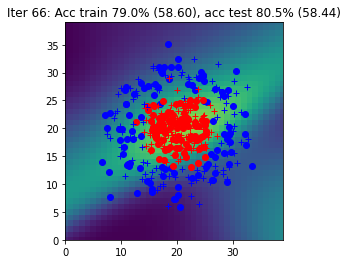

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 67: Acc train 80.5% (58.12), acc test 82.5% (57.97)


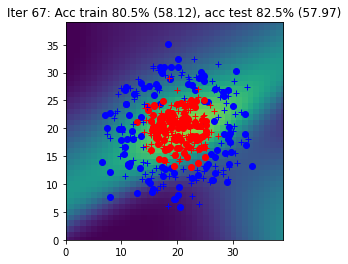

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 68: Acc train 82.0% (57.64), acc test 82.0% (57.50)


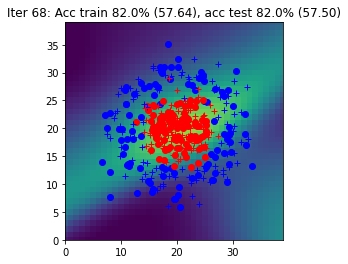

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 69: Acc train 82.5% (57.15), acc test 83.5% (57.01)


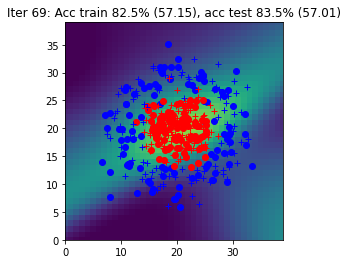

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 70: Acc train 83.0% (56.68), acc test 84.0% (56.55)


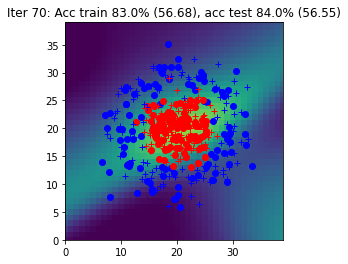

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 71: Acc train 83.5% (56.20), acc test 84.0% (56.08)


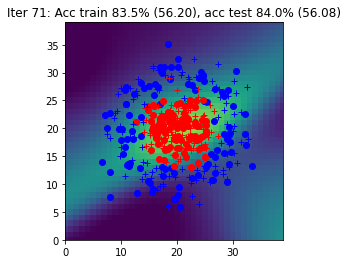

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 72: Acc train 84.0% (55.78), acc test 85.5% (55.66)


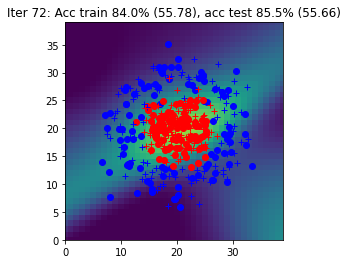

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 73: Acc train 84.5% (55.25), acc test 84.5% (55.15)


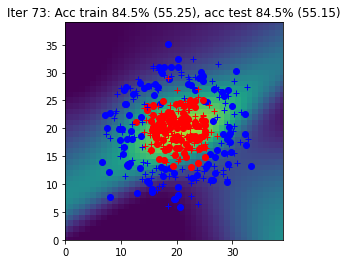

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 74: Acc train 84.5% (54.81), acc test 85.0% (54.71)


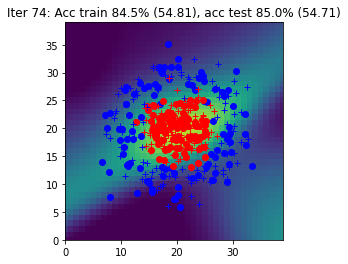

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 75: Acc train 84.5% (54.39), acc test 84.5% (54.30)


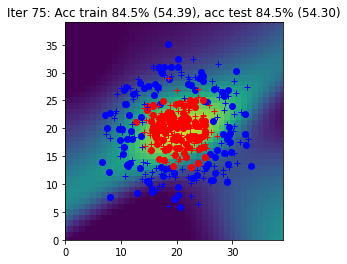

Iter 76: Acc train 87.0% (53.86), acc test 88.5% (53.79)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


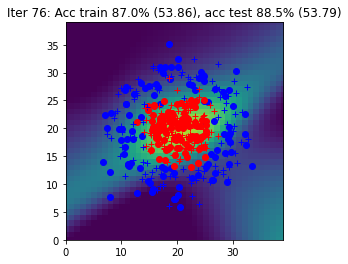

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 77: Acc train 87.5% (53.37), acc test 88.5% (53.30)


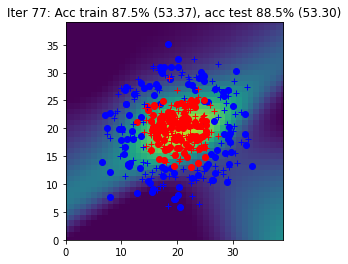

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 78: Acc train 87.5% (52.88), acc test 88.5% (52.82)


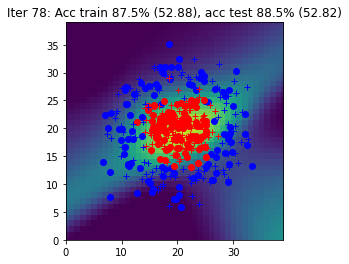

Iter 79: Acc train 88.5% (52.42), acc test 88.5% (52.38)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


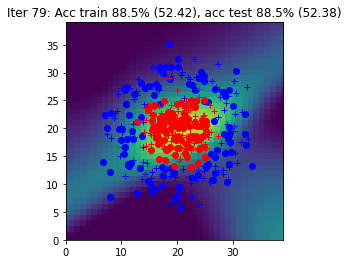

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 80: Acc train 90.5% (51.95), acc test 89.0% (51.93)


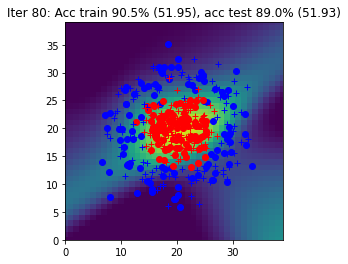

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 81: Acc train 92.0% (51.47), acc test 90.5% (51.47)


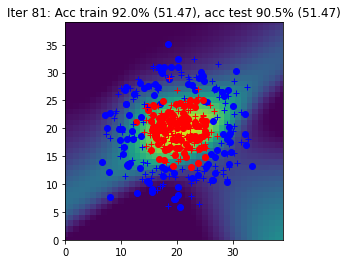

Iter 82: Acc train 92.5% (51.02), acc test 92.5% (51.03)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


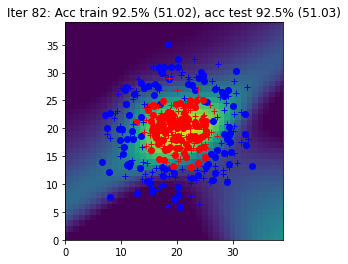

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 83: Acc train 93.0% (50.58), acc test 92.5% (50.60)


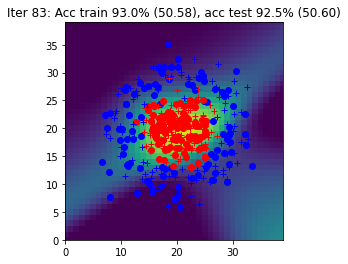

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 84: Acc train 93.5% (50.16), acc test 93.5% (50.20)


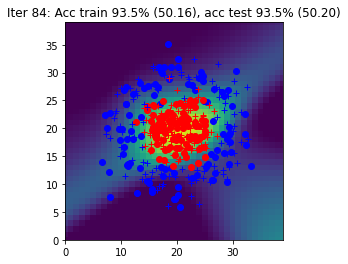

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 85: Acc train 94.5% (49.72), acc test 93.5% (49.77)


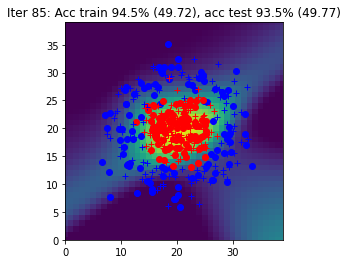

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 86: Acc train 94.0% (49.29), acc test 94.5% (49.36)


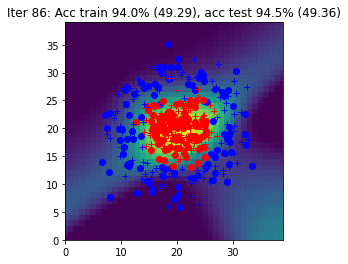

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 87: Acc train 94.5% (48.91), acc test 92.5% (49.01)


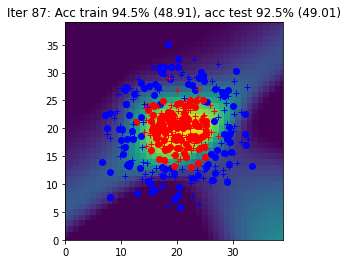

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 88: Acc train 94.0% (48.49), acc test 95.0% (48.59)


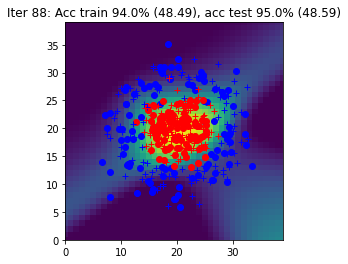

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 89: Acc train 94.0% (48.11), acc test 95.0% (48.24)


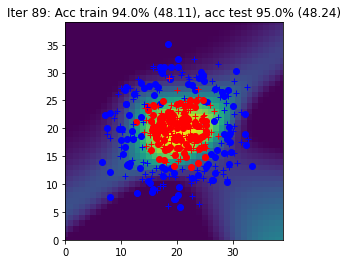

Iter 90: Acc train 94.0% (47.74), acc test 95.5% (47.88)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


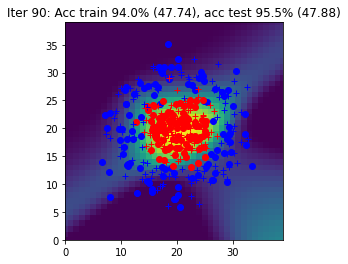

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 91: Acc train 94.0% (47.40), acc test 95.0% (47.56)


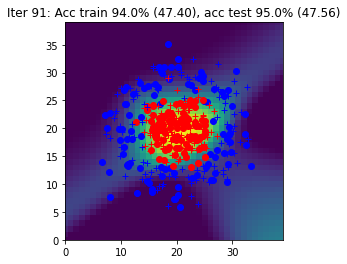

Iter 92: Acc train 94.0% (47.05), acc test 95.0% (47.22)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


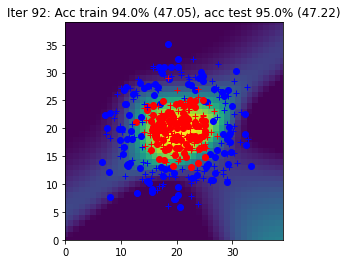

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 93: Acc train 94.0% (46.74), acc test 95.0% (46.93)


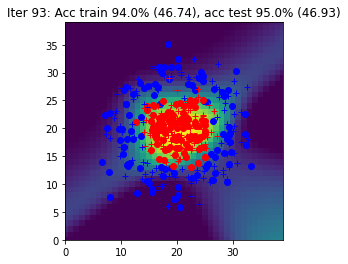

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 94: Acc train 94.0% (46.41), acc test 94.5% (46.62)


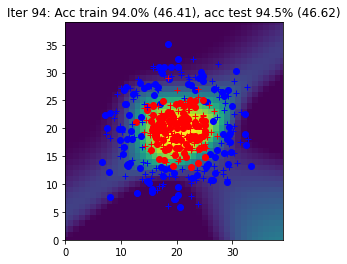

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 95: Acc train 94.0% (46.11), acc test 95.5% (46.33)


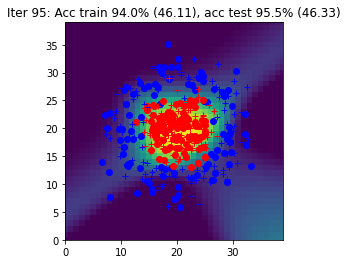

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 96: Acc train 94.0% (45.82), acc test 95.0% (46.05)


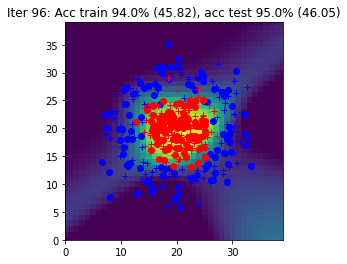

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 97: Acc train 93.5% (45.58), acc test 95.5% (45.85)


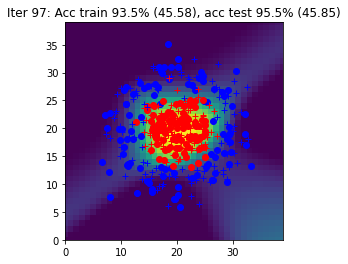

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 98: Acc train 94.0% (45.30), acc test 94.5% (45.58)


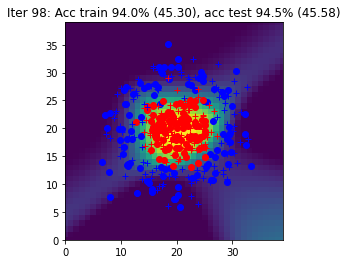

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 99: Acc train 94.0% (45.04), acc test 94.5% (45.33)


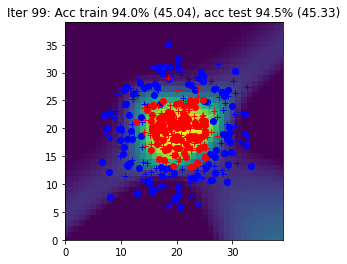

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 100: Acc train 94.5% (44.80), acc test 94.5% (45.10)


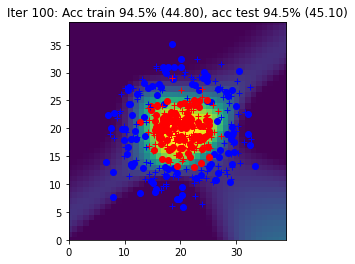

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 101: Acc train 94.5% (44.58), acc test 95.0% (44.87)


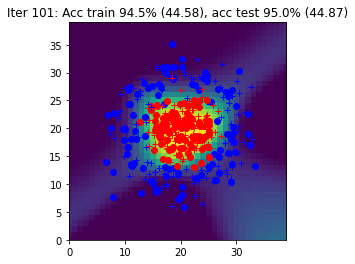

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 102: Acc train 94.5% (44.40), acc test 95.0% (44.69)


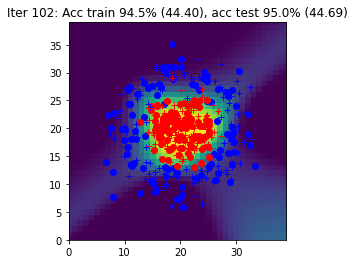

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 103: Acc train 94.5% (44.18), acc test 95.0% (44.50)


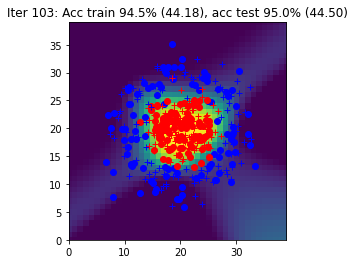

Iter 104: Acc train 94.0% (43.95), acc test 95.0% (44.28)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


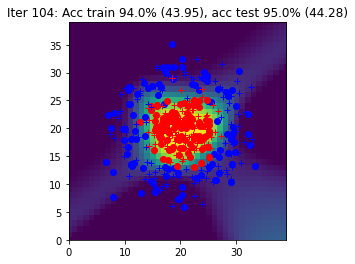

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 105: Acc train 94.5% (43.80), acc test 95.0% (44.14)


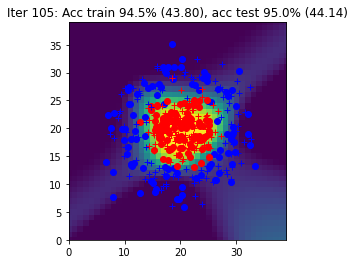

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 106: Acc train 94.0% (43.59), acc test 95.0% (43.93)


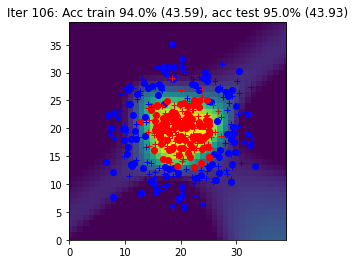

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 107: Acc train 94.5% (43.41), acc test 95.0% (43.77)


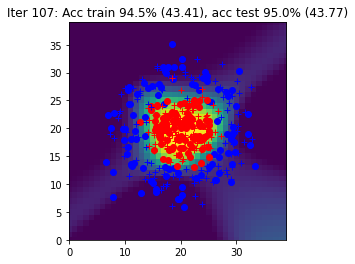

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 108: Acc train 95.5% (43.24), acc test 95.0% (43.61)


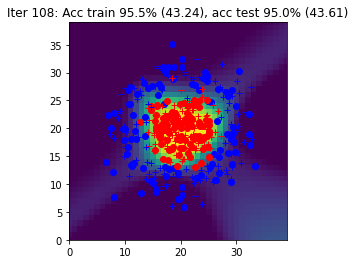

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 109: Acc train 94.5% (43.08), acc test 95.0% (43.46)


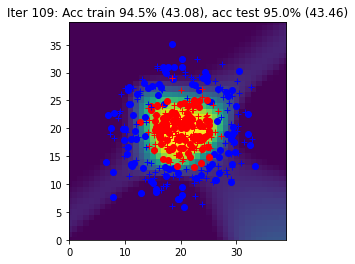

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 110: Acc train 95.5% (42.93), acc test 95.5% (43.33)


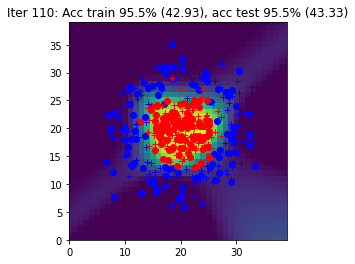

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 111: Acc train 95.5% (42.79), acc test 95.0% (43.17)


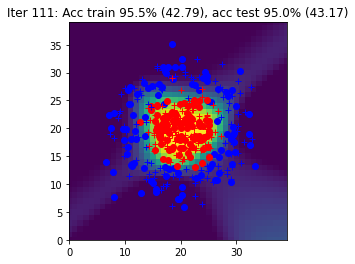

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 112: Acc train 95.5% (42.65), acc test 95.0% (43.05)


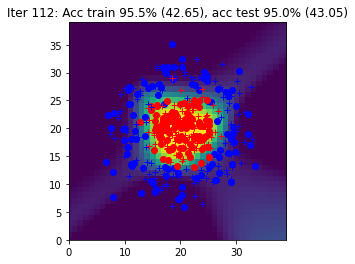

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 113: Acc train 95.5% (42.51), acc test 95.0% (42.92)


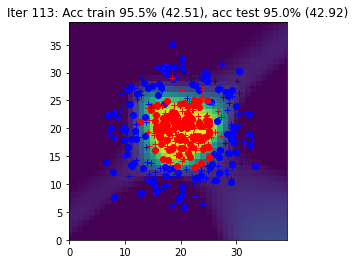

Iter 114: Acc train 95.5% (42.40), acc test 95.0% (42.81)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


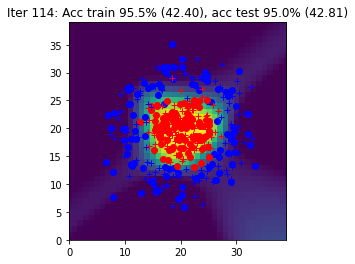

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 115: Acc train 95.5% (42.29), acc test 95.0% (42.71)


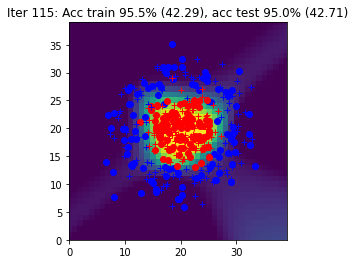

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 116: Acc train 95.5% (42.15), acc test 95.5% (42.55)


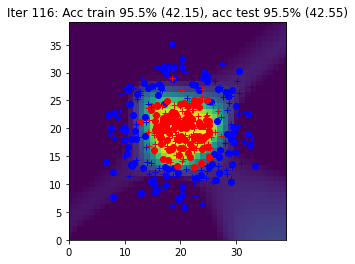

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 117: Acc train 95.5% (42.03), acc test 95.5% (42.44)


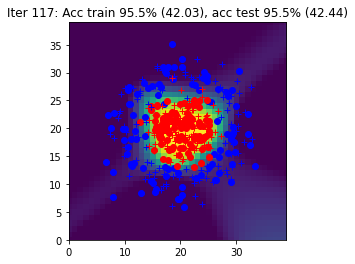

Iter 118: Acc train 95.5% (41.94), acc test 95.0% (42.37)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


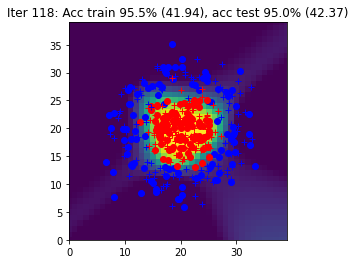

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 119: Acc train 95.5% (41.82), acc test 95.0% (42.24)


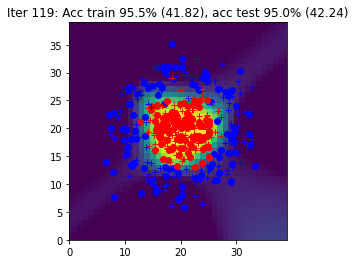

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 120: Acc train 95.0% (41.72), acc test 95.0% (42.13)


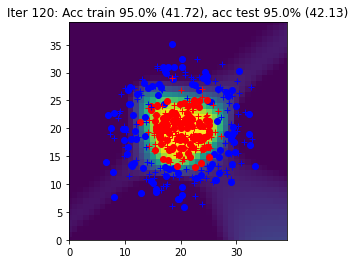

Iter 121: Acc train 95.5% (41.62), acc test 95.0% (42.04)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


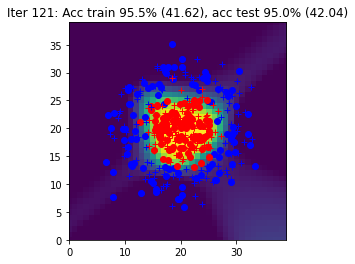

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 122: Acc train 95.5% (41.53), acc test 95.0% (41.97)


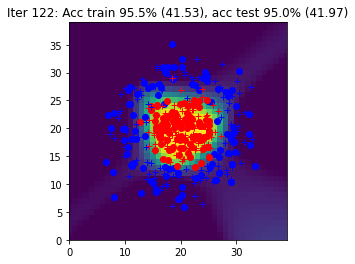

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 123: Acc train 95.0% (41.44), acc test 95.0% (41.86)


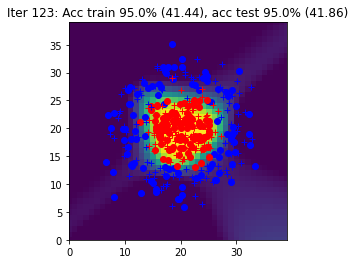

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 124: Acc train 95.0% (41.35), acc test 95.0% (41.76)


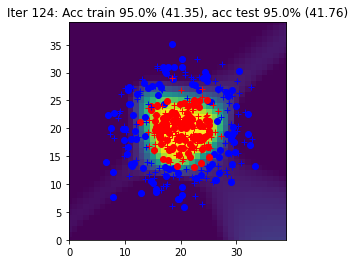

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 125: Acc train 95.5% (41.27), acc test 95.0% (41.70)


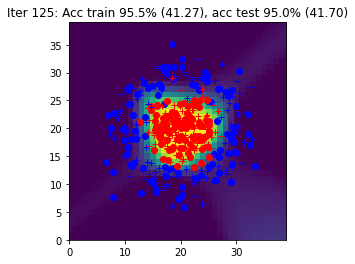

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 126: Acc train 95.0% (41.18), acc test 94.5% (41.61)


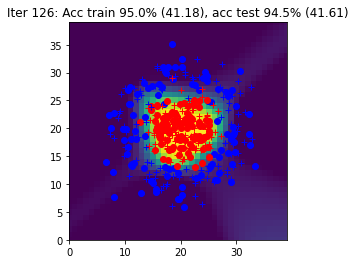

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 127: Acc train 95.5% (41.10), acc test 95.0% (41.54)


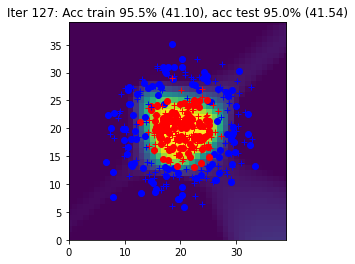

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 128: Acc train 95.0% (41.04), acc test 95.0% (41.44)


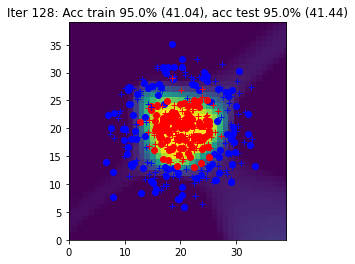

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 129: Acc train 95.0% (40.95), acc test 94.5% (41.37)


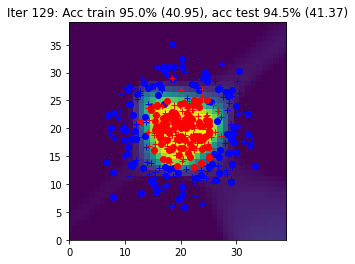

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 130: Acc train 95.0% (40.88), acc test 95.5% (41.33)


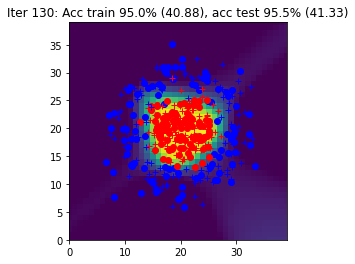

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 131: Acc train 95.0% (40.81), acc test 95.0% (41.24)


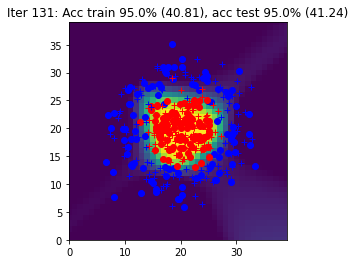

Iter 132: Acc train 95.0% (40.74), acc test 95.0% (41.19)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


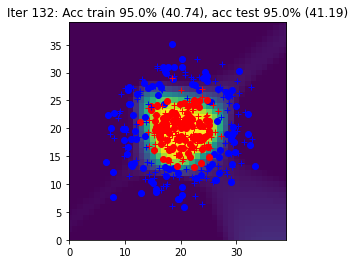

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 133: Acc train 95.0% (40.70), acc test 94.5% (41.17)


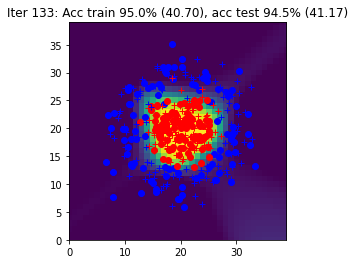

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 134: Acc train 95.0% (40.62), acc test 94.5% (41.07)


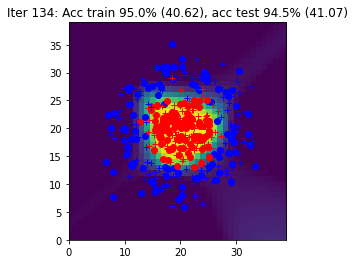

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 135: Acc train 95.0% (40.56), acc test 94.5% (41.01)


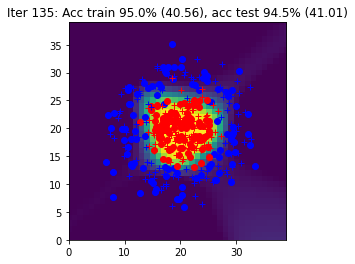

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 136: Acc train 95.0% (40.49), acc test 95.0% (40.93)


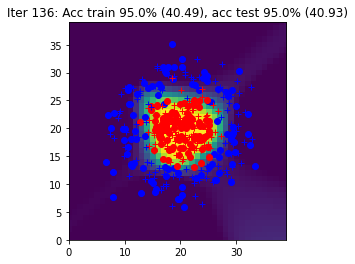

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 137: Acc train 95.0% (40.44), acc test 94.5% (40.90)


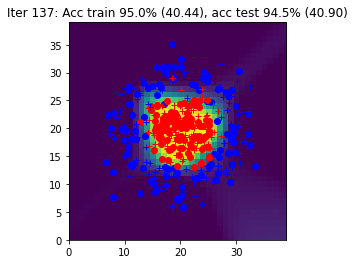

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 138: Acc train 95.0% (40.38), acc test 95.0% (40.82)


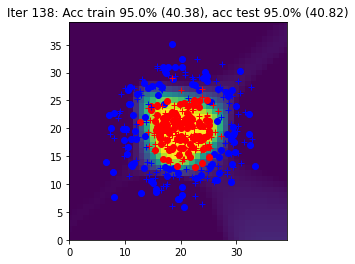

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 139: Acc train 95.0% (40.32), acc test 95.0% (40.76)


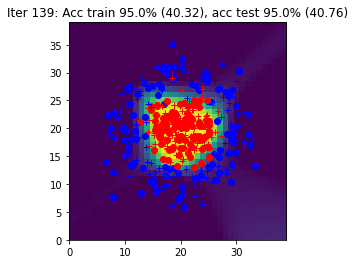

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 140: Acc train 95.0% (40.28), acc test 94.5% (40.70)


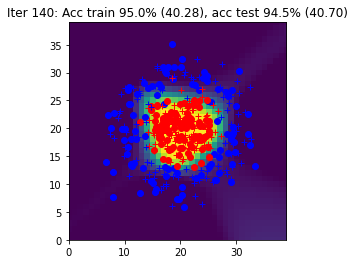

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 141: Acc train 94.5% (40.22), acc test 94.5% (40.65)


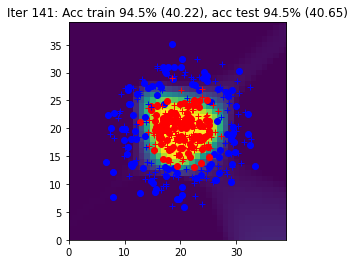

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 142: Acc train 95.0% (40.20), acc test 94.5% (40.67)


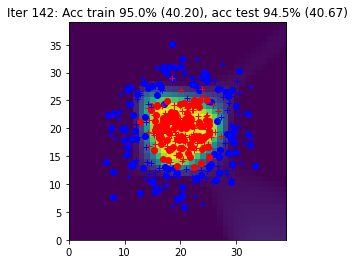

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 143: Acc train 95.0% (40.14), acc test 94.5% (40.61)


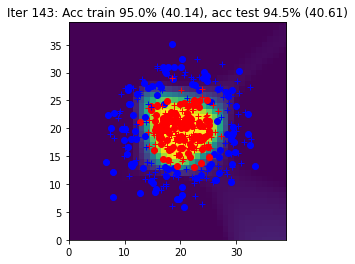

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 144: Acc train 95.0% (40.08), acc test 94.5% (40.54)


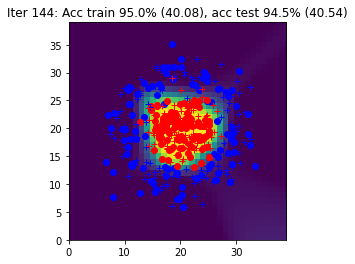

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 145: Acc train 94.5% (40.02), acc test 94.5% (40.45)


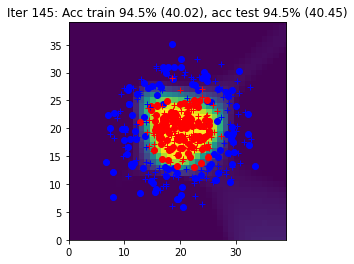

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 146: Acc train 95.5% (39.98), acc test 94.5% (40.43)


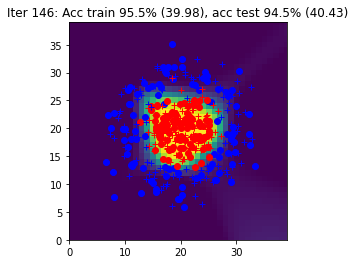

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 147: Acc train 94.5% (39.93), acc test 94.5% (40.35)


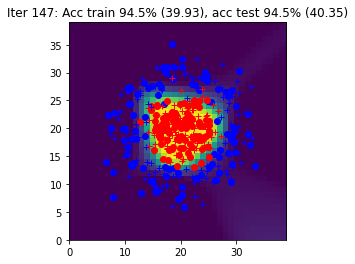

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 148: Acc train 95.0% (39.90), acc test 94.0% (40.29)


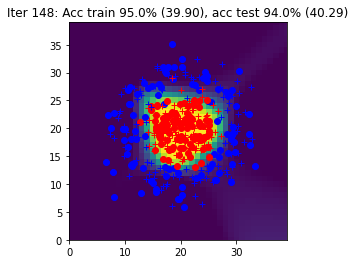

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 149: Acc train 95.0% (39.85), acc test 94.5% (40.29)


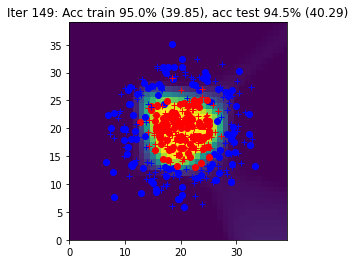

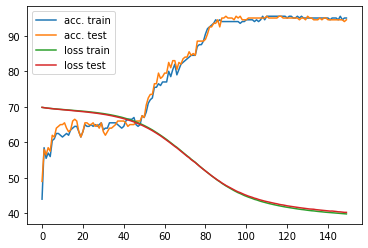

In [ ]:
# init
data = CirclesData()
data.plot_data()
N = data.Xtrain.shape[0]
Nbatch = 10
nx = data.Xtrain.shape[1]
nh = 10
ny = data.Ytrain.shape[1]
eta = 0.1

model, loss, optim = init_model(nx, nh, ny, eta)

curves = [[],[], [], []]

# epoch
for iteration in range(150):

    # permute
    perm = np.random.permutation(N)
    Xtrain = data.Xtrain[perm, :]
    Ytrain = data.Ytrain[perm, :]

    # batches
    for j in range(N // Nbatch):

        indsBatch = range(j * Nbatch, (j+1) * Nbatch)
        X = Xtrain[indsBatch, :]
        Y = Ytrain[indsBatch, :]

        # write the optimization algorithm on the batch (X,Y)
        # using the functions: loss_accuracy
        # the forward with the predict method from the model
        # the backward function with autograd
        # and then an optimization step
        Yhat = model(X)
        L = loss(Yhat, Y)
        optim.zero_grad()
        L.backward()
        optim.step()


    Yhat_train = model(data.Xtrain)
    Yhat_test = model(data.Xtest)
    Ltrain, acctrain = loss_accuracy(loss, Yhat_train, data.Ytrain)
    Ltest, acctest = loss_accuracy(loss, Yhat_test, data.Ytest)
    Ygrid = model(data.Xgrid)

    title = 'Iter {}: Acc train {:.1f}% ({:.2f}), acc test {:.1f}% ({:.2f})'.format(iteration, acctrain, Ltrain, acctest, Ltest)
    print(title)
    data.plot_data_with_grid(torch.nn.Softmax(dim=1)(Ygrid.detach()), title)

    curves[0].append(acctrain)
    curves[1].append(acctest)
    curves[2].append(Ltrain.detach())
    curves[3].append(Ltest.detach())

fig = plt.figure()
plt.plot(curves[0], label="acc. train")
plt.plot(curves[1], label="acc. test")
plt.plot(curves[2], label="loss train")
plt.plot(curves[3], label="loss test")
plt.legend()
plt.show()

# Part 5 : MNIST

Apply the code from previous part code to the MNIST dataset.

nx 784, ny 10


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 0: Acc train 41.5% (218.62), acc test 41.9% (218.44)
Iter 1: Acc train 54.2% (204.19), acc test 54.5% (203.77)
Iter 2: Acc train 61.7% (195.96), acc test 61.9% (195.55)
Iter 3: Acc train 67.9% (189.90), acc test 68.0% (189.55)
Iter 4: Acc train 71.9% (185.26), acc test 72.2% (184.88)
Iter 5: Acc train 76.5% (181.22), acc test 77.0% (180.77)
Iter 6: Acc train 79.3% (177.86), acc test 79.7% (177.42)
Iter 7: Acc train 80.4% (175.33), acc test 80.9% (174.90)
Iter 8: Acc train 81.1% (173.47), acc test 81.5% (173.11)
Iter 9: Acc train 81.7% (172.03), acc test 81.8% (171.73)
Iter 10: Acc train 82.1% (170.89), acc test 82.3% (170.66)
Iter 11: Acc train 82.4% (169.93), acc test 82.4% (169.73)
Iter 12: Acc train 82.7% (169.15), acc test 82.8% (168.94)
Iter 13: Acc train 83.0% (168.45), acc test 83.0% (168.30)
Iter 14: Acc train 83.1% (167.87), acc test 83.3% (167.77)
Iter 15: Acc train 83.5% (167.31), acc test 83.6% (167.27)
Iter 16: Acc train 83.7% (166.85), acc test 83.7% (166.81)
Iter 17

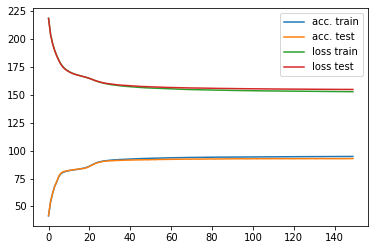

In [ ]:
# init
data = MNISTData()
N = data.Xtrain.shape[0]
Nbatch = 100
nx = data.Xtrain.shape[1]
nh = 100
ny = data.Ytrain.shape[1]
eta = 0.001

model, loss, optim = init_model(nx, nh, ny, eta)

curves = [[],[], [], []]
# epoch

print(f"nx {nx}, ny {ny}")
for iteration in range(150):
    perm = np.random.permutation(N)
    Xtrain = data.Xtrain[perm, :]
    Ytrain = data.Ytrain[perm, :]

    # batches
    for j in range(N // Nbatch):

        indsBatch = range(j * Nbatch, (j+1) * Nbatch)
        X = Xtrain[indsBatch, :]
        Y = Ytrain[indsBatch, :]

        # write the optimization algorithm on the batch (X,Y)
        # using the functions: loss_accuracy
        # the forward with the predict method from the model
        # the backward function with autograd
        # and then an optimization step
        Yhat = model(X)
        L = loss(Yhat, Y)
        optim.zero_grad()
        L.backward()
        optim.step()



    Yhat_train = model(data.Xtrain)
    Yhat_test = model(data.Xtest)
    Ltrain, acctrain = loss_accuracy(loss, Yhat_train, data.Ytrain)
    Ltest, acctest = loss_accuracy(loss, Yhat_test, data.Ytest)

    title = 'Iter {}: Acc train {:.1f}% ({:.2f}), acc test {:.1f}% ({:.2f})'.format(iteration, acctrain, Ltrain, acctest, Ltest)
    print(title)
    #data.plot_data_with_grid(torch.nn.Softmax(dim=1)(Ygrid.detach()), title)

    curves[0].append(acctrain)
    curves[1].append(acctest)
    curves[2].append(Ltrain.detach())
    curves[3].append(Ltest.detach())

fig = plt.figure()
plt.plot(curves[0], label="acc. train")
plt.plot(curves[1], label="acc. test")
plt.plot(curves[2], label="loss train")
plt.plot(curves[3], label="loss test")
plt.legend()
plt.show()



Predicted number: 1


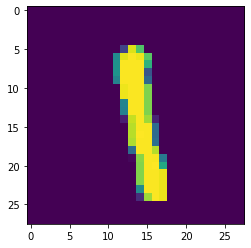

Predicted number: 2


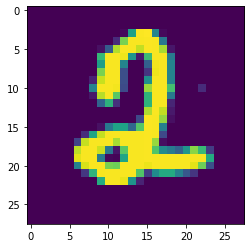

Predicted number: 9


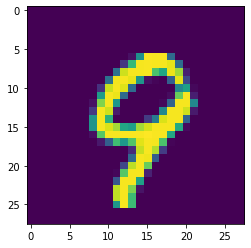

Predicted number: 7


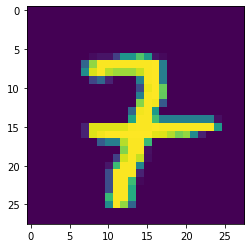

Predicted number: 4


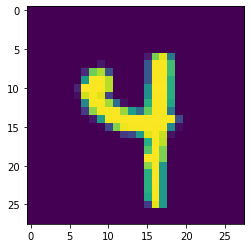

Predicted number: 4


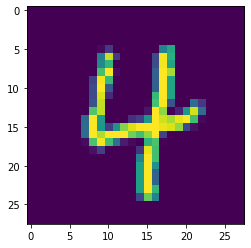

Predicted number: 6


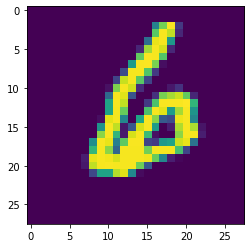

Predicted number: 1


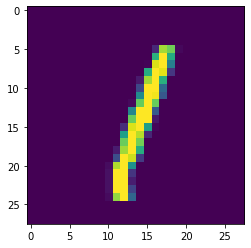

Predicted number: 3


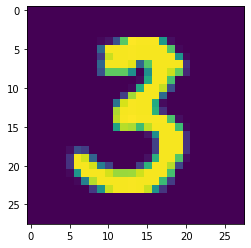

Predicted number: 3


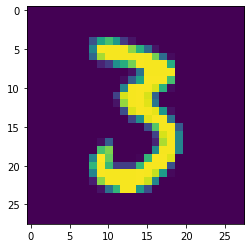

Predicted number: 5


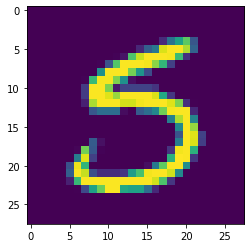

Predicted number: 6


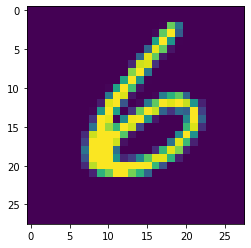

Predicted number: 4


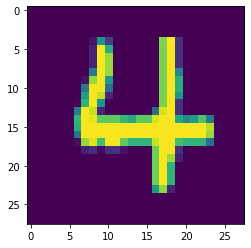

Predicted number: 3


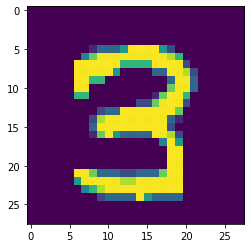

Predicted number: 3


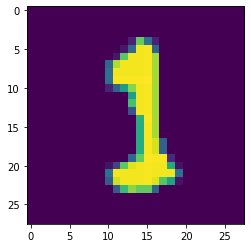

Predicted number: 6


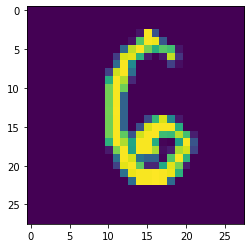

Predicted number: 2


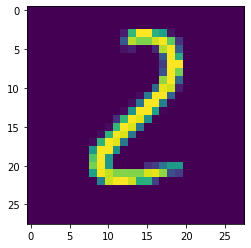

Predicted number: 3


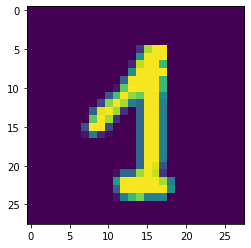

Predicted number: 4


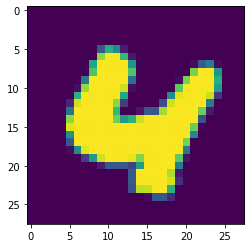

Predicted number: 6


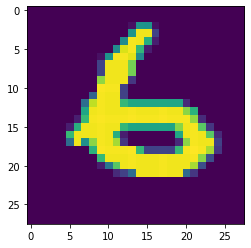

Predicted number: 8


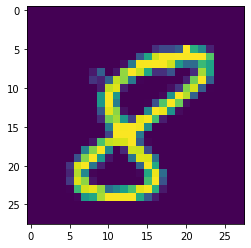

Predicted number: 8


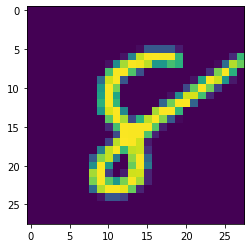

Predicted number: 8


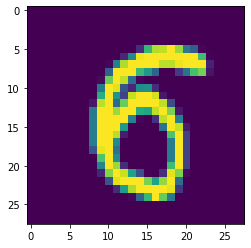

Predicted number: 9


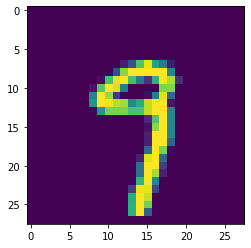

Predicted number: 6


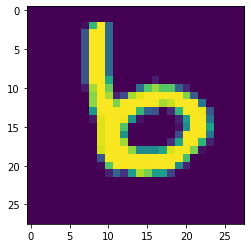

Predicted number: 2


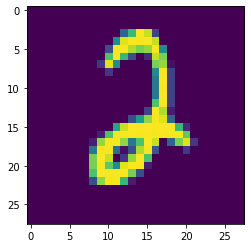

Predicted number: 2


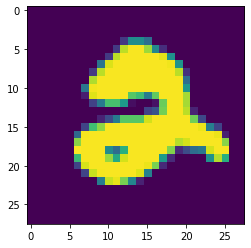

Predicted number: 6


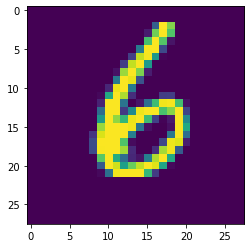

Predicted number: 1


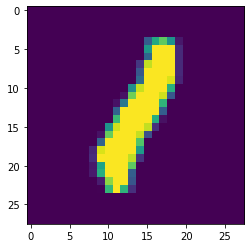

Predicted number: 6


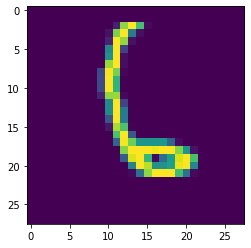

In [ ]:
with torch.no_grad():
  for i in range(30):
    input = Xtrain[i]
    pred = model(input).numpy()
    print("Predicted number:", pred.argmax())
    plt.imshow(np.reshape(input, (28,28)))
    plt.draw()
    plt.pause(1e-3)




# Part 6: Bonus: SVM


Train a SVM model on the Circles dataset.

Ideas :
- First try a linear SVM (sklearn.svm.LinearSVC dans scikit-learn). Does it work well ? Why ?
- Then try more complex kernels (sklearn.svm.SVC). Which one is the best ? why ?
- Does the parameter C of regularization have an impact? Why ?

In [ ]:
# data
data = CirclesData()
Xtrain = data.Xtrain.numpy()
Ytrain = data.Ytrain[:, 0].numpy()

Xgrid = data.Xgrid.numpy()

Xtest = data.Xtest.numpy()
Ytest = data.Ytest[:, 0].numpy()

def plot_svm_predictions(data, predictions):
      plt.figure(2)
      plt.clf()
      plt.imshow(np.reshape(predictions, (40,40)))
      plt.plot(data._Xtrain[data._Ytrain[:,0] == 1,0]*10+20, data._Xtrain[data._Ytrain[:,0] == 1,1]*10+20, 'bo', label="Train")
      plt.plot(data._Xtrain[data._Ytrain[:,1] == 1,0]*10+20, data._Xtrain[data._Ytrain[:,1] == 1,1]*10+20, 'ro')
      plt.plot(data._Xtest[data._Ytest[:,0] == 1,0]*10+20, data._Xtest[data._Ytest[:,0] == 1,1]*10+20, 'b+', label="Test")
      plt.plot(data._Xtest[data._Ytest[:,1] == 1,0]*10+20, data._Xtest[data._Ytest[:,1] == 1,1]*10+20, 'r+')
      plt.xlim(0,39)
      plt.ylim(0,39)
      plt.clim(0.3,0.7)
      plt.draw()
      plt.pause(1e-3)

In [ ]:
import sklearn.svm as svm

### Train the SVM    #######
## See https://scikit-learn.org/stable/modules/generated/sklearn.svm.LinearSVC.html
## and https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html
############################
#Here we are using the linear SVM
linearSvc = svm.LinearSVC()
linearSvc.fit(Xtrain, Ytrain)
###########################

LinearSVC()

Accuracy : 53.00


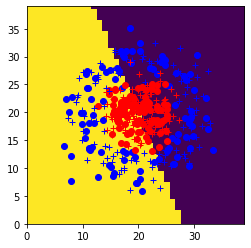

In [ ]:
## Print results

Ytest_pred = linearSvc.predict(Xtest)
accuracy = np.sum(Ytest == Ytest_pred) / len(Ytest)
print(f"Accuracy : {100 * accuracy:.2f}")
Ygrid_pred = linearSvc.predict(Xgrid)
plot_svm_predictions(data, Ygrid_pred)

In [ ]:

### Train the SVM    #######
## See https://scikit-learn.org/stable/modules/generated/sklearn.svm.LinearSVC.html
## and https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html
############################
#Here we are using the c support vector classification
svc = svm.SVC(C=0.00000000002)
svc.fit(Xtrain, Ytrain)
###########################

SVC(C=2e-11)

Accuracy : 95.00


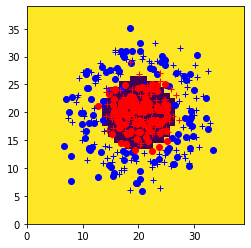

In [ ]:
## Print results

Ytest_pred = svc.predict(Xtest)
accuracy = np.sum(Ytest == Ytest_pred) / len(Ytest)
print(f"Accuracy : {100 * accuracy:.2f}")
Ygrid_pred = svc.predict(Xgrid)
plot_svm_predictions(data, Ygrid_pred)